In [1]:
import scipy.io
from scipy.interpolate import interp1d
from scipy import signal
import numpy as np
import pylab as plt
import pandas as pd
import xarray as xr
# from isqg import *
from numpy import *
from pylab import *
import gsw
from xrft import detrend
import xrft

/home/tchonang/miniconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
###################### functions

def compute_geostrophic_velocities(ds):
    """
    Compute geostrophic velocities from SSH data in an xarray Dataset.
    
    Parameters:
    ds (xarray.Dataset): Input dataset containing 'SSH', 'latitude', and 'longitude' DataArrays.
    
    Returns:
    xarray.Dataset: Dataset enriched with geostrophic velocity components 'u_g' and 'v_g'.
    """
    # Constants
    g = 9.81  # Acceleration due to gravity in m/s^2
    omega = 7.2921e-5  # Earth's rotation rate in rad/s
    earth_radius = 6371000  # Earth radius in meters
    
    # Calculate the Coriolis parameter
    ds['f'] = 2 * omega * np.sin(np.deg2rad(ds.latitude))
    
    # Calculate spatial deltas in meters for longitude and latitude
    # Longitude
    longitude_diff = np.diff(ds.longitude, axis=1)
    longitude_diff[longitude_diff > 180] -= 360  # Correct for dateline jump
    longitude_diff[longitude_diff < -180] += 360
    longitude_diff_extended = np.pad(longitude_diff, ((0, 0), (0, 1)), mode='edge')
    dx = xr.DataArray(
        (earth_radius * np.cos(np.deg2rad(ds.latitude)) * (np.pi / 180)) * longitude_diff_extended,
        dims=('num_lines', 'num_pixels'),
        coords={'num_lines': ds.num_lines, 'num_pixels': ds.num_pixels}
    )
    
    # Latitude
    latitude_diff = np.diff(ds.latitude, axis=0)
    latitude_diff_extended = np.pad(latitude_diff, ((0, 1), (0, 0)), mode='edge')
    dy = xr.DataArray(
        (earth_radius * np.pi / 180) * latitude_diff_extended,
        dims=('num_lines', 'num_pixels'),
        coords={'num_lines': ds.num_lines, 'num_pixels': ds.num_pixels}
    )
    
    # Compute gradients of SSH
    ds['grad_ssh_x'] = xr.DataArray(np.gradient(ds.SSH, axis=1) / dx, dims=('num_lines', 'num_pixels'), coords=ds.SSH.coords)
    ds['grad_ssh_y'] = xr.DataArray(np.gradient(ds.SSH, axis=0) / dy, dims=('num_lines', 'num_pixels'), coords=ds.SSH.coords)
    
    # Calculate geostrophic velocities
    ds['u_g'] = -g / ds['f'] * ds['grad_ssh_y']
    ds['v_g'] = g / ds['f'] * ds['grad_ssh_x']
    
    return ds

def filter_butter(data,cutoff,fs, btype,filter_order=4,axis=0):
    """filter signal data using butter filter.
    Parameters
    ==================
    data: N-D array
    cutoff: scalar
        the critical frequency
    fs: scalar
        the sampling frequency
    btype: string
        'low' for lowpass, 'high' for highpass, 'bandpass' for bandpass
    filter_order: scalar
        The order for the filter
    axis: scalar
        The axis of data to which the filter is applied
    Output
    ===============
    N-D array of the filtered data
    """
    import numpy as np
    from scipy import signal
    if btype=='bandpass':
            normal_cutoff=[cutoff[0]/0.5/fs,cutoff[1]/0.5/fs]
    else:
        normal_cutoff=cutoff/(0.5*fs)  #normalize cutoff frequency
    b,a=signal.butter(filter_order, normal_cutoff,btype)
    y = signal.filtfilt(b, a, data, axis=axis)
    return y

In [3]:
# Function to calculate distances and average within radius
def average_within_radius(ds, lon_s2, lat_s2, radius_km, earth_radius_km,variables_to_average):
    # Step 1: Calculate the distance from the target point to all other points
    lat2d = ds['latitude'].values
    lon2d = ds['longitude'].values

    # Convert degrees to radians
    lat_s2_rad = np.radians(lat_s2)
    lon_s2_rad = np.radians(lon_s2)
    lat_rad = np.radians(lat2d)
    lon_rad = np.radians(lon2d)

    # Haversine formula to calculate the great-circle distance
    dlat = lat_rad - lat_s2_rad
    dlon = lon_rad - lon_s2_rad
    a = np.sin(dlat / 2)**2 + np.cos(lat_s2_rad) * np.cos(lat_rad) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    distances_km = earth_radius_km * c

    # Step 2: Create a mask for points within the specified radius as an xarray.DataArray
    within_radius = xr.DataArray(distances_km <= radius_km, dims=['num_lines', 'num_pixels'])

    # Step 3: Average or smooth the data within this selection
    # variables_to_average = ['SSH', 'u_g', 'v_g', 'grad_ssh_x', 'grad_ssh_y', 'ut_g']

    # Create a new xarray Dataset to store the averaged results
    averaged_data = {}

    for var in variables_to_average:
        if var in ds:
            # Select data within the radius
            selected_data = ds[var].where(within_radius, drop=True)

            # Average the selected data along the spatial dimensions
            averaged_values = selected_data.mean(dim=['num_lines', 'num_pixels'])

            # Store the averaged values in the new dataset
            averaged_data[var] = averaged_values

    # Create an xarray Dataset from the averaged data
    averaged_ds = xr.Dataset(averaged_data)
    return averaged_ds


### analysis of adcp dataset 

In [4]:

import h5py

path = '/mnt/flow/swot/Matt_Analysis/calval_orbit_expert_v1.0/science_orbit/adcp/load_save_sig1000_adj.mat'

with h5py.File(path, 'r') as f:
    u = f['ADCP/velE_adj'][:]
    v = f['ADCP/velN_adj'][:]
    velE = f['ADCP/velE'][:]
    velN = f['ADCP/velN'][:]
    date = f['ADCP/time'][:,0]
    z = f['ADCP/dz'][0,:]

### put time from num to vect

In [8]:
time = pd.to_datetime(np.squeeze(date)-719529, unit='D').round('s')

### plot the raw data u and v and zoom on 2 weeks

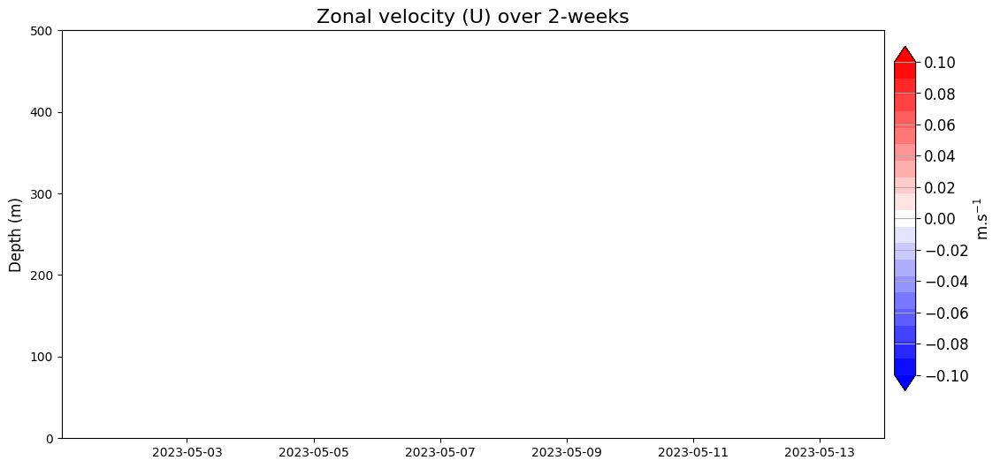

In [9]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time,-z,u.T, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([0,500])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Zonal velocity (U) over 2-weeks',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

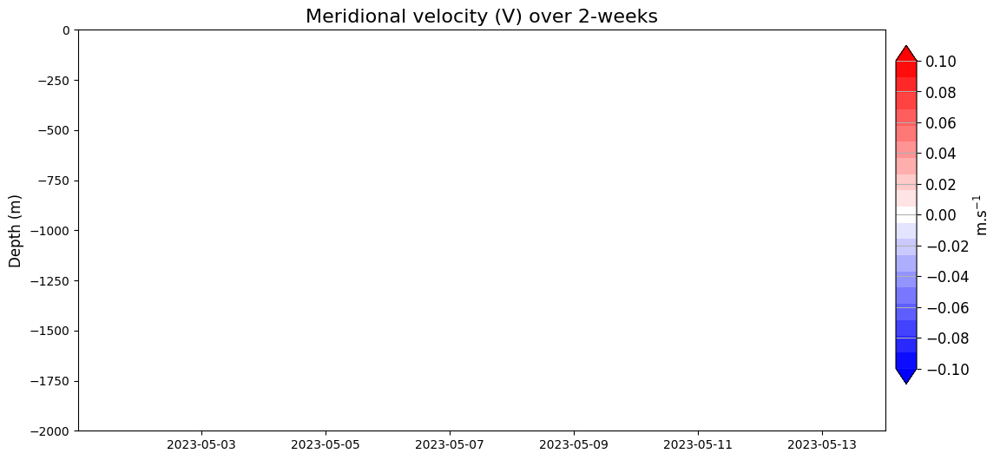

In [10]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time,z,v.T, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-2000,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

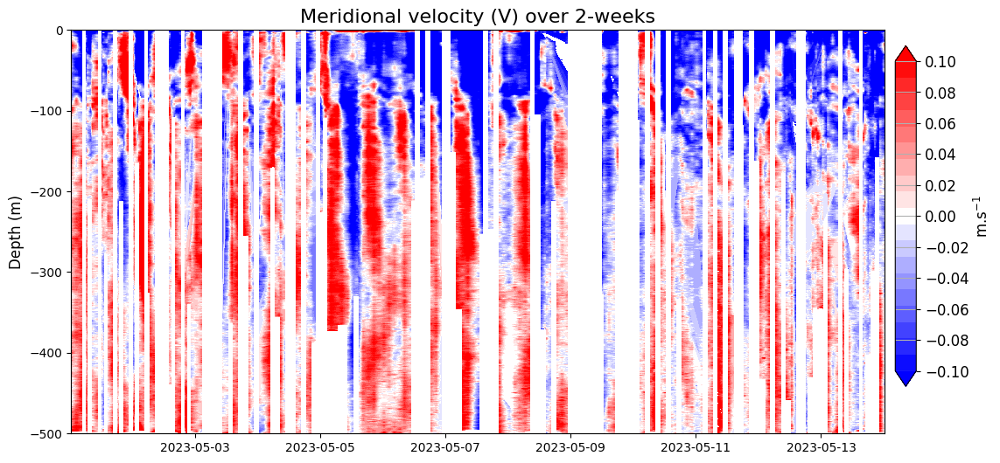

In [11]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time,-z,v.T, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

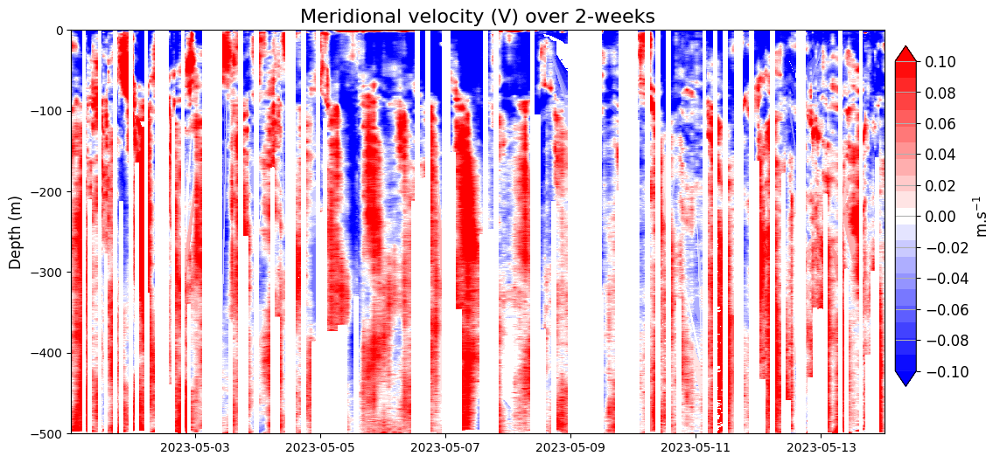

In [12]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time,-z,velN.T, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

### create a regular time to interpolate my data on it 

In [13]:
# Define start and end datetime
start_datetime = np.datetime64('2023-04-01T03:00:00')
end_datetime = np.datetime64('2023-07-10T00:00:00')

# Create datetime range with a step of 30 minutes
datetime_range = pd.date_range(start=start_datetime, end=end_datetime, freq='2h')

# Convert the datetime range to a numpy array with dtype='datetime64[ns]'
datetime_array = datetime_range.values.astype('datetime64[ns]')

### deal with nan in my velocity components

In [14]:
# Find valid (non-NaN) indices
valid_time_idx = ~np.isnan(time)
time1 = time[valid_time_idx]

In [15]:
# Handling NaNs: forward fill for simplicity in this example
velocity_u = u.T[:,valid_time_idx].copy()
for i in range(len(z)):
    valid_idx = np.where(~np.isnan(velocity_u[i]))[0]
    if valid_idx.size > 0:
        first_valid = valid_idx[0]
        last_valid = valid_idx[-1]
        velocity_u[i, :first_valid] = velocity_u[i, first_valid]
        velocity_u[i, last_valid+1:] = velocity_u[i, last_valid]
        velocity_u[i, first_valid:last_valid] = np.interp(time1[first_valid:last_valid],
                                                       time1[valid_idx], velocity_u[i, valid_idx])


In [16]:
# Handling NaNs: forward fill for simplicity in this example
velocity_v = v.T[:,valid_time_idx].copy()
for i in range(len(z)):
    valid_idx = np.where(~np.isnan(velocity_v[i]))[0]
    if valid_idx.size > 0:
        first_valid = valid_idx[0]
        last_valid = valid_idx[-1]
        velocity_v[i, :first_valid] = velocity_v[i, first_valid]
        velocity_v[i, last_valid+1:] = velocity_v[i, last_valid]
        velocity_v[i, first_valid:last_valid] = np.interp(time1[first_valid:last_valid],
                                                       time1[valid_idx], velocity_v[i, valid_idx])


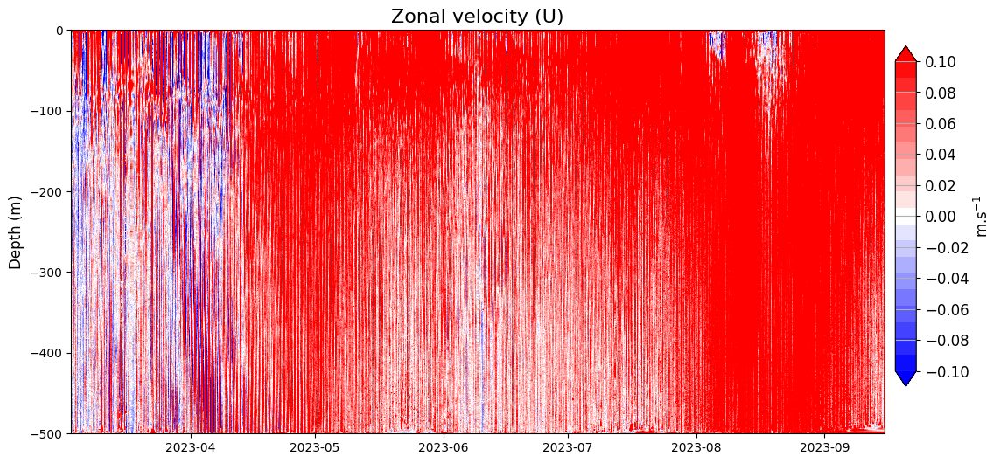

In [17]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time1,-z,velocity_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Zonal velocity (U)',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

In [18]:
velocity_u

array([[ 0.24299158,  0.31432298,  0.24320386, ...,  0.19307792,
         0.28177696,  0.20562173],
       [ 0.29901746,  0.04053177,  0.00921611, ...,  0.17629415,
         0.17928314,  0.3180925 ],
       [ 0.2263219 ,  0.2907148 ,  0.2022999 , ...,  0.16531688,
         0.23636478,  0.2804762 ],
       ...,
       [-0.07383929, -0.07383929, -0.07383929, ...,  0.06948243,
         0.06948243,  0.06948243],
       [-0.09753867, -0.09753867, -0.09753867, ...,  0.03690935,
         0.03690935,  0.03690935],
       [-0.09508538, -0.09508538, -0.09508538, ...,  0.04011887,
         0.04011887,  0.04011887]], dtype=float32)

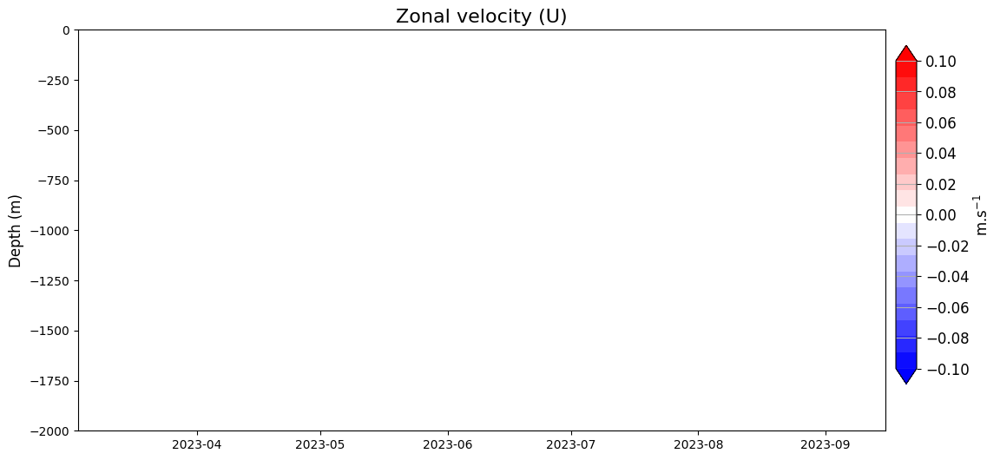

In [21]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time1,z,velocity_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-2000,0])
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Zonal velocity (U)',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

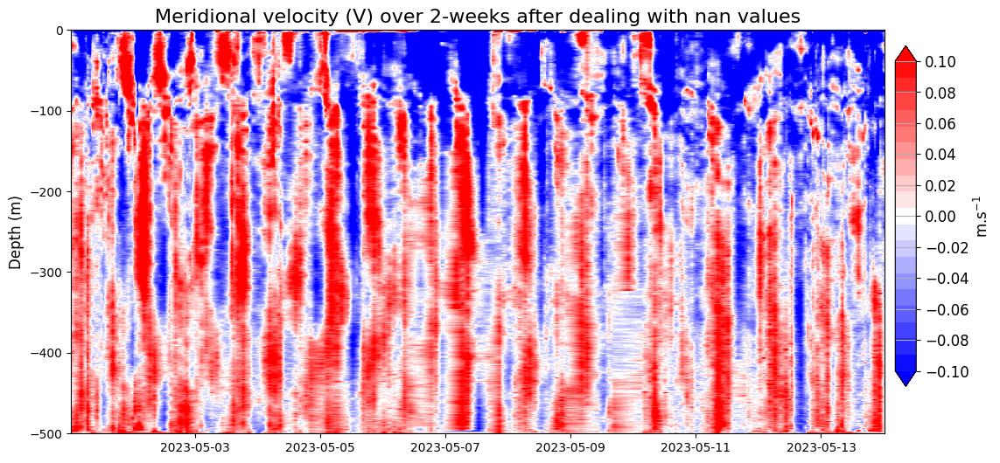

In [20]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time1,-z,velocity_v, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks after dealing with nan values',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

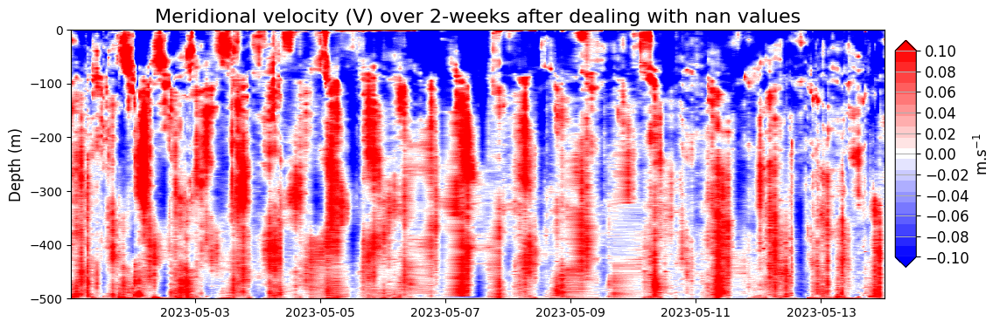

In [22]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 4))
ct1 = plt.contourf(time1,-z,velocity_v, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks after dealing with nan values',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

### Convert datetime64 to float (number of days since a reference time, e.g., the first date in 'timee')

In [23]:
# Convert datetime64 to float (number of days since a reference time, e.g., the first date in 'timee')
time_days = (time1 - np.datetime64('1970-01-01')) / np.timedelta64(1, 'D')
datetime_array_days = (datetime_array - np.datetime64('1970-01-01')) / np.timedelta64(1, 'D')

# # Create interpolation function
# interp_u = interp1d(timee_days, U, kind='linear', bounds_error=False)

# # Interpolated U values at the converted datetime points
# interp_u_values = interp_u(datetime_array_days)

### Interpolation onto the datetime_array

In [24]:
# Interpolation onto the datetime_array
interp_u_values = np.zeros((len(z), len(datetime_array)))
for i in range(len(z)):
    f = interp1d(time_days, velocity_u[i], kind='linear', bounds_error=False)#, fill_value="extrapolate")
    interp_u_values[i] = f(datetime_array_days)


In [25]:
# Interpolation onto the datetime_array
interp_v_values = np.zeros((len(z), len(datetime_array)))
for i in range(len(z)):
    f = interp1d(time_days, velocity_v[i], kind='linear', bounds_error=False)#, fill_value="extrapolate")
    interp_v_values[i] = f(datetime_array_days)

### define the index for the depth where i want to plot my PSD

In [26]:
idz = np.where((z >= 100) &(z <= 101))[0][0]
print('the index is ', idz)
print('the depth is ', z[idz])

the index is  400
the depth is  100.0


### plot of the spectre 

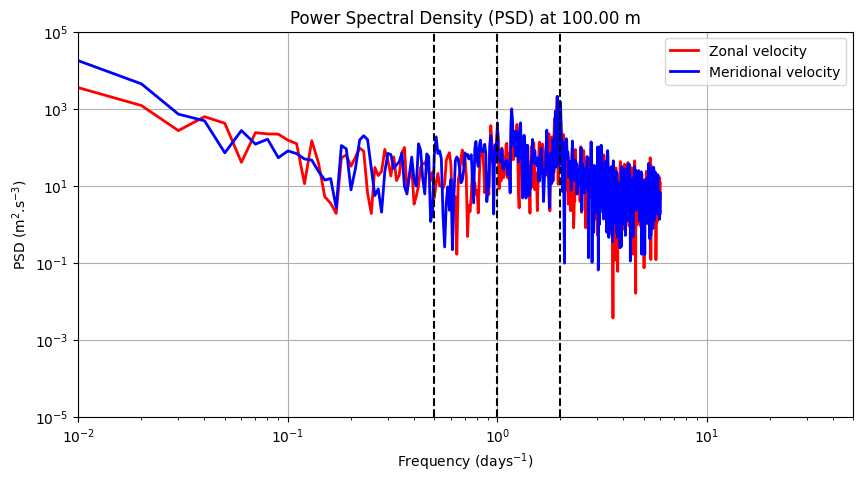

In [27]:
from scipy.signal import welch
# Compute the Power Spectral Density
fs = 1 / (120 * 60)  # Sampling frequency in Hz (1 sample per 1800 seconds)
npt=len(datetime_array[:-1])
noverlap = int(npt/2)  # Overlap between segments
frequencies_u, power_u = welch(interp_u_values[idz,:-1],window = 'hann',nfft = npt,
                                                             fs=fs,

                                                             nperseg=npt,
                                                             scaling='density',
                                                             noverlap=noverlap, axis=0)#, nperseg=256)

frequencies_v, power_v = welch(interp_v_values[idz,:-1],window = 'hann',nfft = npt,
                                                             fs=fs,

                                                             nperseg=npt,
                                                             scaling='density',
                                                             noverlap=noverlap)#, nperseg=256)

# Plotting the Power Spectral Density
lw=2
ymin, ymax = 1E-5, 1E5
xmin, xmax = 1E-2, 50
plt.figure(figsize=(10, 5))
plt.loglog(frequencies_u*3600*24, power_u,color='r', lw = lw, label='Zonal velocity')
plt.loglog(frequencies_v*3600*24, power_v,color='b', lw = lw, label='Meridional velocity')
plt.xlim([xmin,xmax])
plt.ylim([ymin,ymax])
# Add vertical lines at 12h and 24h frequencies
plt.axvline(x=2, color='k', linestyle='--')
plt.axvline(x=1, color='k', linestyle='--')
plt.axvline(x=0.5, color='k', linestyle='--')
dp = z[idz]
plt.title(f"Power Spectral Density (PSD) at {dp:.2f} m")
plt.xlabel('Frequency (days$^{-1}$)')
plt.ylabel(r'PSD (m$^2$.s$^{-3}$)',fontsize=fs+10)#('PSD (V^2/Hz)')
plt.grid(True)
plt.legend()
plt.show()


In [28]:
z

array([-0.0000e+00,  2.5000e-01,  5.0000e-01, ...,  4.9950e+02,
        4.9975e+02,  5.0000e+02])

### plot the PSD along the depth

In [29]:
da_u = xr.DataArray(
    data=interp_u_values[:,:-1],
    dims=["depth","time"],
    coords=dict(
        time=datetime_array[:-1],
        depth=(["depth"], z),
    ),
    attrs=dict(
        description="velocity",
        units="m/s",
    ),
)

In [30]:
da_u

<xarray.DataArray (depth: 2001, time: 1198)> Size: 19MB
array([[-0.08496133, -0.1275537 , -0.06354007, ...,  0.64348205,
         0.52577575,  0.57786323],
       [-0.10122124, -0.16690957, -0.09219082, ...,  0.45983075,
         0.53419712,  0.56015332],
       [-0.04777396, -0.0915421 , -0.03014009, ...,  0.59337605,
         0.6308787 ,  0.61335034],
       ...,
       [ 0.0199909 ,  0.01121985,  0.0024488 , ...,  0.00677566,
         0.00126471, -0.00424623],
       [ 0.0101954 , -0.00117135, -0.0125381 , ..., -0.00098243,
        -0.00942093, -0.01785943],
       [-0.00953589, -0.02117805, -0.03282021, ..., -0.00785357,
        -0.0094335 , -0.01101343]])
Coordinates:
  * time     (time) datetime64[ns] 10kB 2023-04-01T03:00:00 ... 2023-07-09T21...
  * depth    (depth) float64 16kB -0.0 0.25 0.5 0.75 ... 499.2 499.5 499.8 500.0
Attributes:
    description:  velocity
    units:        m/s

### remove the depth where there are all NAN values

In [31]:
all_nan_depths = da_u.isnull().all(dim='time')

# Print out the depths that are completely NaN
print("Depths with all NaNs:", da_u['depth'].where(all_nan_depths, drop=True))

Depths with all NaNs: <xarray.DataArray 'depth' (depth: 0)> Size: 0B
array([], dtype=float64)
Coordinates:
  * depth    (depth) float64 0B 


In [32]:
da_cleaned_u = da_u.where(~all_nan_depths, drop=True)
da_cleaned_u = da_cleaned_u.sel(depth=slice(0,500))

In [33]:
da_cleaned_u

<xarray.DataArray (depth: 2001, time: 1198)> Size: 19MB
array([[-0.08496133, -0.1275537 , -0.06354007, ...,  0.64348205,
         0.52577575,  0.57786323],
       [-0.10122124, -0.16690957, -0.09219082, ...,  0.45983075,
         0.53419712,  0.56015332],
       [-0.04777396, -0.0915421 , -0.03014009, ...,  0.59337605,
         0.6308787 ,  0.61335034],
       ...,
       [ 0.0199909 ,  0.01121985,  0.0024488 , ...,  0.00677566,
         0.00126471, -0.00424623],
       [ 0.0101954 , -0.00117135, -0.0125381 , ..., -0.00098243,
        -0.00942093, -0.01785943],
       [-0.00953589, -0.02117805, -0.03282021, ..., -0.00785357,
        -0.0094335 , -0.01101343]])
Coordinates:
  * time     (time) datetime64[ns] 10kB 2023-04-01T03:00:00 ... 2023-07-09T21...
  * depth    (depth) float64 16kB -0.0 0.25 0.5 0.75 ... 499.2 499.5 499.8 500.0
Attributes:
    description:  velocity
    units:        m/s

### detrend and apply the filter

In [34]:
detrend_u_t = xrft.detrend(da_cleaned_u, dim='time', detrend_type='linear')
shps_u = xrft.power_spectrum(detrend_u_t, dim=['time'], window='hann')

In [35]:
shps_u.data.min()

2.009404893321218e-06

In [36]:
shps_u.depth.shape

(2001,)

In [37]:
np.diff(shps_u.freq_time.values)

array([1.15933964e-07, 1.15933964e-07, 1.15933964e-07, ...,
       1.15933964e-07, 1.15933964e-07, 1.15933964e-07])

In [38]:
1/0.5

2.0

### plot my PSD along depth

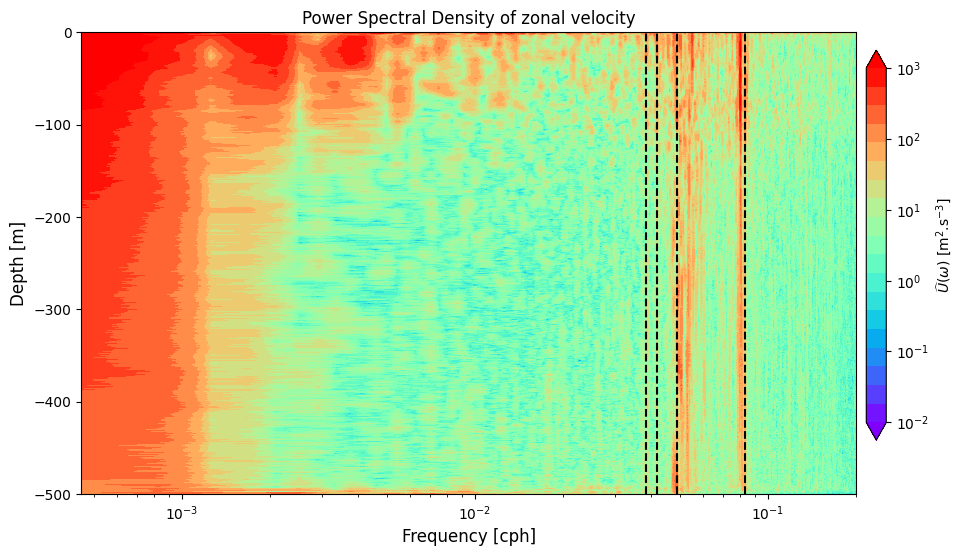

In [39]:
from matplotlib.colors import LogNorm
tick_psd = [1E-2, 1E-1,1E0,1E1,1E2,1E3]
ymin, ymax =  -500,0
xmin, xmax = 1/2208, 1/5#0,0.1
vmin, vmax=1.e-2, 1.e6
omega = shps_u.freq_time*3600#*60*24
# kr    = shps_iso.kr*1e3
level=np.linspace(vmin,vmax,20)
lev_W_exp = np.linspace(-2,3,20)
lev_W = np.power(10, lev_W_exp)

fig, ax1 = plt.subplots(figsize=(10, 6))

# ax1 = fig.add_subplot(111)
cs=ax1.contourf(omega, -shps_u.depth,(shps_u), levels = lev_W, extend = 'both',
                    cmap='rainbow',
                    norm=LogNorm())
# ax1.set_yscale('log')
ax1.set_xscale('log')

plt.axvline(x=1/12, color='k', linestyle='--')
plt.axvline(x=1/(24), color='k', linestyle='--')
plt.axvline(x=1/(26), color='k', linestyle='--')

plt.axvline(x=1/(20.5), color='k', linestyle='--')


ax1.set_title(f"Power Spectral Density of zonal velocity")
ax1.set_xlim([xmin,xmax])
ax1.set_ylim([ymin,ymax])
plt.xlabel(r'Frequency [cph]',size=12)
plt.ylabel(r'Depth [m]',size=12)
#cbar_ax = fig.add_axes([0.92,0.12, 0.04, 0.76])
### set the colorbar
cbar_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick_psd,
                    extend = 'both')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_title(cs,fontsize=10)
cbar.set_label(r'$\widehat{U}$($\omega$) [m$^2$.s$^{-3}$]',fontsize=fs+10)#(r'$\kappa$ $\times$ $\omega$ $\times$ $\widehat{SH}$($\kappa$,$\omega$)')

### samething like above but now for v

In [40]:
da_v = xr.DataArray(
    data=interp_v_values[:,:-1],
    dims=["depth","time"],
    coords=dict(
        time=datetime_array[:-1],
        depth=(["depth"], z),
    ),
    attrs=dict(
        description="velocity",
        units="m/s",
    ),
)

In [41]:
all_nan_depths = da_v.isnull().all(dim='time')

# Print out the depths that are completely NaN
print("Depths with all NaNs:", da_v['depth'].where(all_nan_depths, drop=True))

Depths with all NaNs: <xarray.DataArray 'depth' (depth: 0)> Size: 0B
array([], dtype=float64)
Coordinates:
  * depth    (depth) float64 0B 


In [42]:
da_cleaned_v = da_v.where(~all_nan_depths, drop=True)
da_cleaned_v = da_cleaned_v.sel(depth=slice(0,500))

In [43]:
da_cleaned_v

<xarray.DataArray (depth: 2001, time: 1198)> Size: 19MB
array([[ 0.3288308 ,  0.43699394,  0.40130979, ..., -0.20897214,
        -0.19882742, -0.16627878],
       [ 0.34294136,  0.40354935,  0.3847473 , ..., -0.3351406 ,
        -0.10911054, -0.20119813],
       [ 0.36837383,  0.455919  ,  0.41417312, ..., -0.19663252,
        -0.16949145, -0.2049241 ],
       ...,
       [ 0.10873989,  0.12326266,  0.13778544, ...,  0.06638467,
         0.05752276,  0.04866085],
       [ 0.10854784,  0.10799601,  0.10744418, ...,  0.05333985,
         0.04269103,  0.03204222],
       [ 0.05994973,  0.08057331,  0.10119689, ...,  0.05796293,
         0.04575101,  0.03353908]])
Coordinates:
  * time     (time) datetime64[ns] 10kB 2023-04-01T03:00:00 ... 2023-07-09T21...
  * depth    (depth) float64 16kB -0.0 0.25 0.5 0.75 ... 499.2 499.5 499.8 500.0
Attributes:
    description:  velocity
    units:        m/s

In [44]:
detrend_v_t = xrft.detrend(da_cleaned_v, dim='time', detrend_type='linear')
shps_v = xrft.power_spectrum(detrend_v_t, dim=['time'], window='hann')

In [45]:
shps_v.data.min()

2.1009739920679062e-07

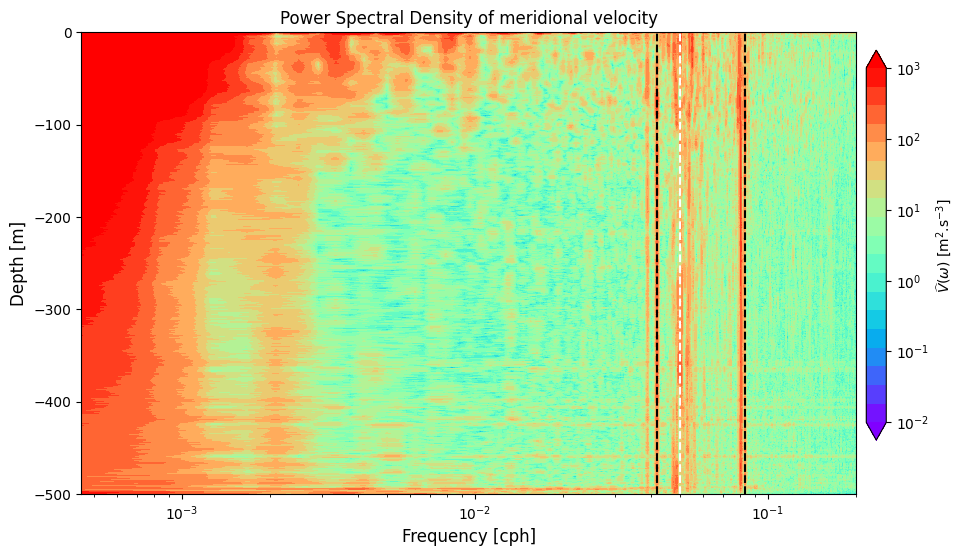

In [46]:
from matplotlib.colors import LogNorm
tick_psd = [1E-2, 1E-1,1E0,1E1,1E2,1E3]
ymin, ymax = -500,0
xmin, xmax = 1/2208,1/5#0,0.1
vmin, vmax=1.e-2, 1.e6
omega = shps_v.freq_time*3600#*60*24
# kr    = shps_iso.kr*1e3
level=np.linspace(vmin,vmax,20)
lev_W_exp = np.linspace(-2,3,20)
lev_W = np.power(10, lev_W_exp)

fig, ax1 = plt.subplots(figsize=(10, 6))

# ax1 = fig.add_subplot(111)
cs=ax1.contourf(omega, -shps_v.depth,(shps_v), levels = lev_W, extend = 'both',
                    cmap='rainbow',
                    norm=LogNorm())
# ax1.set_yscale('log')
ax1.set_xscale('log')

plt.axvline(x=1/12, color='k', linestyle='--')
plt.axvline(x=1/(24), color='k', linestyle='--')
plt.axvline(x=0.05, color='w', linestyle='--')

ax1.set_title(f"Power Spectral Density of meridional velocity")
ax1.set_xlim([xmin,xmax])
ax1.set_ylim([ymin,ymax])
plt.xlabel(r'Frequency [cph]',size=12)
plt.ylabel(r'Depth [m]',size=12)
#cbar_ax = fig.add_axes([0.92,0.12, 0.04, 0.76])
### set the colorbar
cbar_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick_psd,
                    extend = 'both')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_title(cs,fontsize=10)
cbar.set_label(r'$\widehat{V}$($\omega$) [m$^2$.s$^{-3}$]',fontsize=fs+10)#(r'$\kappa$ $\times$ $\omega$ $\times$ $\widehat{SH}$($\kappa$,$\omega$)')

In [47]:
5*24

120

### filter the data 

In [48]:
# Sampling frequency in Hz (2 samples per hour, every 30 minutes)
fs = 1/2
# Convert 48 hours period to frequency
fc = 1/36 #1 / 48  # cutoff frequency in cycles per hour

# Calculate normalized cutoff frequency (fs/2 = 1 for 30-minute sampling)
Wn = 2 * fc / fs

# Design Butterworth filter
# b, a = butter(N=4, Wn=Wn, btype='low', analog=False)

# Apply the filter
# filtered_data = filtfilt(b, a, interp_u_values[:,:-1], axis=1)
data_filt_u = filter_butter(interp_u_values[:,:-1],fc,fs, btype='low',filter_order=4,axis=1)
data_filt_v = filter_butter(interp_v_values[:,:-1],fc,fs, btype='low',filter_order=4,axis=1)


In [49]:
interp_u_values

array([[-0.08496133, -0.1275537 , -0.06354007, ...,  0.52577575,
         0.57786323,  0.62575178],
       [-0.10122124, -0.16690957, -0.09219082, ...,  0.53419712,
         0.56015332,  0.64996722],
       [-0.04777396, -0.0915421 , -0.03014009, ...,  0.6308787 ,
         0.61335034,  0.59400241],
       ...,
       [ 0.0199909 ,  0.01121985,  0.0024488 , ...,  0.00126471,
        -0.00424623, -0.00975718],
       [ 0.0101954 , -0.00117135, -0.0125381 , ..., -0.00942093,
        -0.01785943, -0.02629793],
       [-0.00953589, -0.02117805, -0.03282021, ..., -0.0094335 ,
        -0.01101343, -0.01259336]])

In [50]:
data_filt_u.shape

(2001, 1198)

In [51]:
# # Create DataArrays from the numpy arrays
# da_u_filt = xr.DataArray(data_filt_u, coords=[z, datetime_array[:-1]], dims=["depth", "time"], name="data_filt_u")
# da_v_filt = xr.DataArray(data_filt_v, coords=[z, datetime_array[:-1]], dims=["depth", "time"], name="data_filt_v")

# # Combine the DataArrays into a Dataset
# dataset = xr.Dataset({
#     'data_filt_u': da_u_filt,
#     'data_filt_v': da_v_filt
# })

# # Print the Dataset
# print(dataset)

# # Save the Dataset to a NetCDF file
# dataset.to_netcdf('/mnt/flow/swot/calval/Data/NRL/ftp7320.nrlssc.navy.mil/pub/SATELLITE/SSH/48hr_LPF_adcp_data.nc')

In [52]:
da_u_filt = xr.DataArray(interp_u_values[:,:-1], coords=[z, datetime_array[:-1]], dims=["depth", "time"], name="data_filt_u")
da_v_filt = xr.DataArray(interp_v_values[:,:-1], coords=[z, datetime_array[:-1]], dims=["depth", "time"], name="data_filt_v")

# # Combine the DataArrays into a Dataset
dataset = xr.Dataset({
    'data_filt_u': da_u_filt,
    'data_filt_v': da_v_filt
})

# Print the Dataset
# print(dataset)

# # Save the Dataset to a NetCDF file
# dataset.to_netcdf('/mnt/flow/swot/calval/Data/NRL/ftp7320.nrlssc.navy.mil/pub/SATELLITE/SSH/adcp_uv_data.nc')

In [53]:
idz = 200

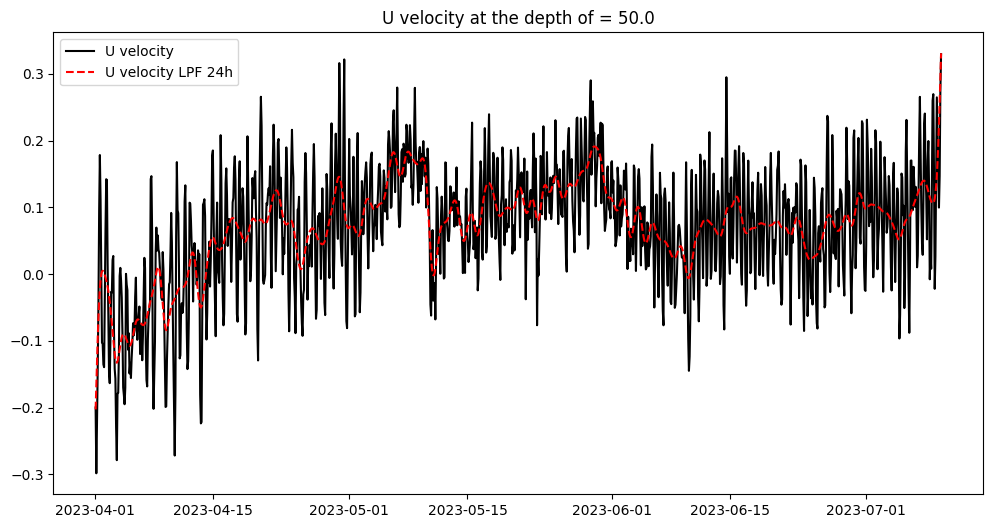

In [54]:
plt.figure(figsize=(12, 6))
# plt.plot(datetime_array[:-1], filtered_data[-1,:],'r')
plt.plot(datetime_array[:-1], interp_u_values[idz,:-1],'k', label='U velocity')
plt.plot(datetime_array[:-1], data_filt_u[idz,:],'--r', label='U velocity LPF 24h')
plt.title(f'U velocity at the depth of = {z[idz]}')
plt.legend()
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-07 00:25:25')])

In [55]:
# interp_u_values

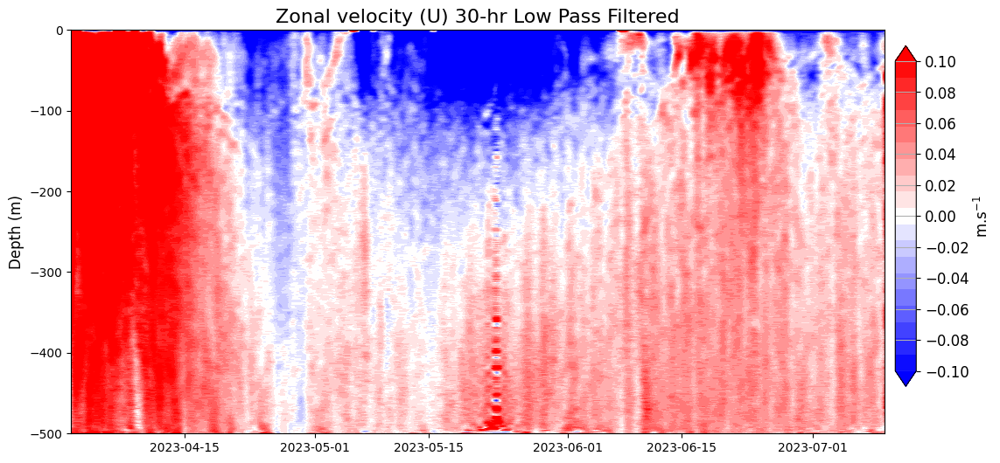

In [56]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(datetime_array[:-1],-z,data_filt_v, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Zonal velocity (U) 30-hr Low Pass Filtered',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

In [57]:
data_filt_u

array([[-8.57588522e-02, -4.26552524e-02, -2.81945844e-04, ...,
         4.61392159e-01,  5.18431039e-01,  5.77486637e-01],
       [-1.03466686e-01, -5.26775133e-02, -2.71533413e-03, ...,
         4.78924054e-01,  5.21538964e-01,  5.65210419e-01],
       [-4.92547435e-02, -8.29786434e-03,  3.19108174e-02, ...,
         5.00402585e-01,  5.56675833e-01,  6.14695936e-01],
       ...,
       [ 1.98230358e-02,  1.76903551e-02,  1.54057107e-02, ...,
        -5.41996858e-03, -4.55390797e-03, -3.61108979e-03],
       [ 9.59592957e-03,  9.75730530e-05, -8.62015580e-03, ...,
        -2.31012208e-02, -2.17866797e-02, -2.01498603e-02],
       [-9.64570436e-03, -1.59782025e-02, -2.17790338e-02, ...,
        -2.58116534e-02, -1.95916315e-02, -1.30546146e-02]])

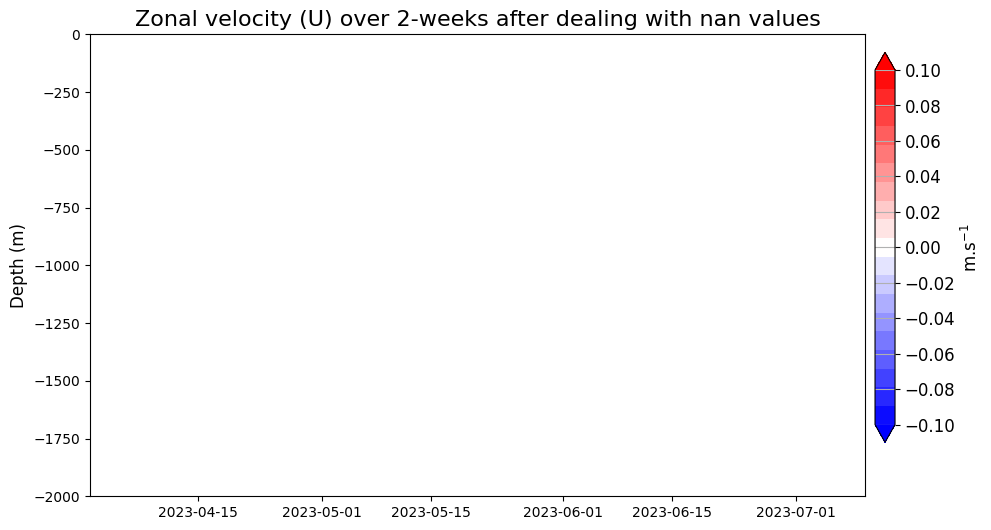

In [58]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(10, 6))
ct1 = plt.contourf(datetime_array[:-1],z,data_filt_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-2000,0])
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Zonal velocity (U) over 2-weeks after dealing with nan values',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

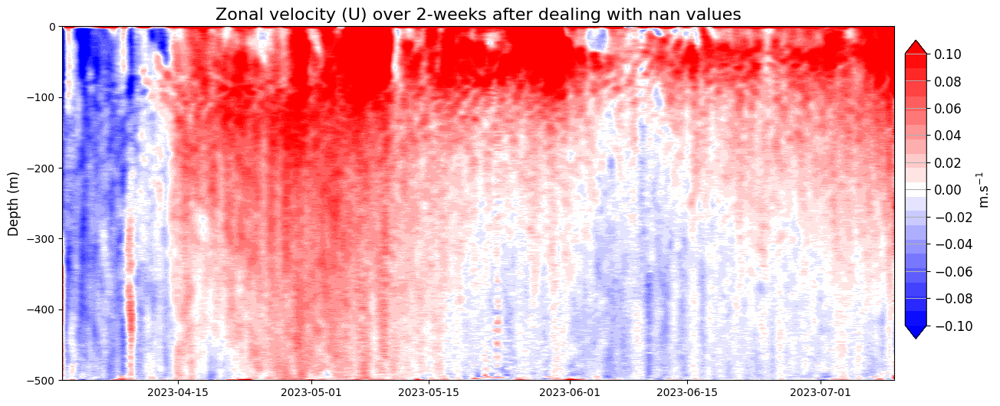

In [59]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(14, 6))
ct1 = plt.contourf(datetime_array[:-1],-z,data_filt_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Zonal velocity (U) over 2-weeks after dealing with nan values',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

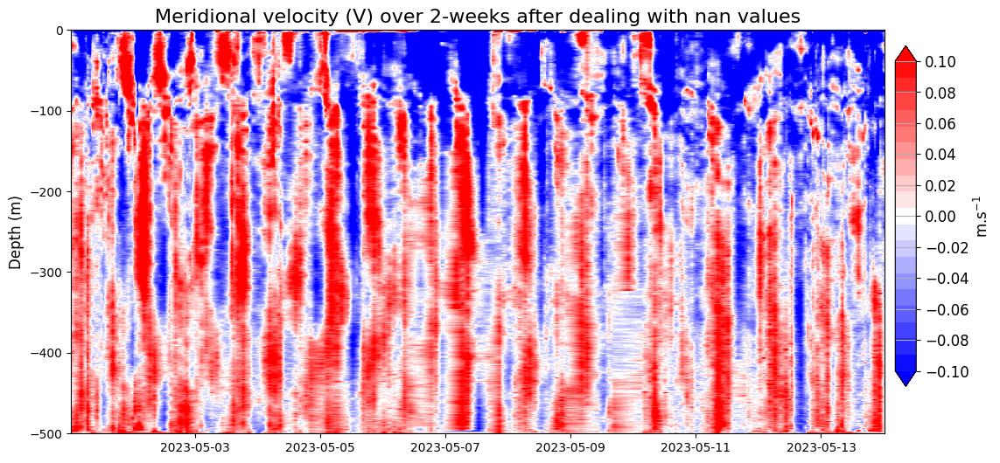

In [60]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(time1,-z,velocity_v, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-500,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks after dealing with nan values',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

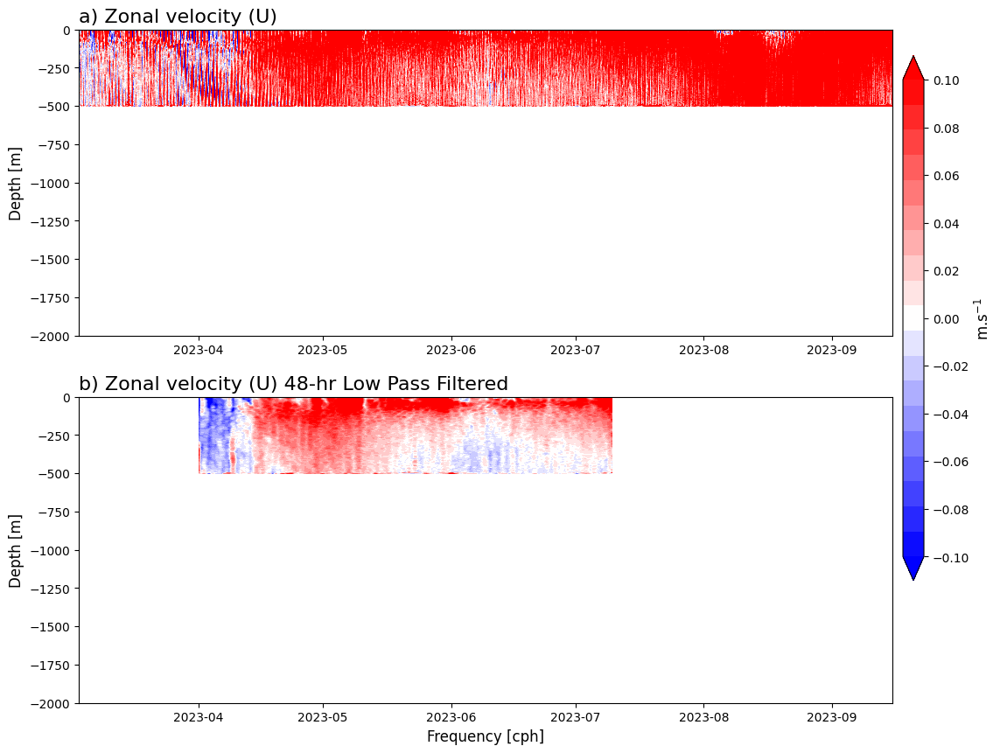

In [62]:
from matplotlib.colors import LogNorm

# depth_index=np.where((shps_r.depth >= -750) &(shps_r.depth <= -749))[0][0]-10
tick_psd = [1E-2,1E-1,1E0,1E1,1E2,1E3]
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
ymin, ymax =  -500,0
ymin1, ymax1 =  1E-2,1E3
xmin, xmax = -0.2, 0.2#0,0.1
vmin, vmax=1.e-2, 1.e3
# omega = shps_r.freq_time.values*3600#*60*24
# power_r = shps_r.data
color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'
# kr    = shps_iso.kr*1e3
level=np.linspace(vmin,vmax,20)
lev_W_exp = np.linspace(-2,3,20)
lev_W = np.power(10, lev_W_exp)
loc = 'left'

# Create subplots
fig = plt.figure(figsize=(12, 10))
gs = GridSpec(2, 2, figure=fig)
# gs = GridSpec(2, 1, height_ratios=[1, 2])

# First row, first column plot
ax1 = fig.add_subplot(gs[0,:])
ax1.contourf(time1,-z,velocity_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
# ax1.set_xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
ax1.set_title(f'a) Zonal velocity (U)',loc='left',fontsize=fs+4)
ax1.set_ylim([-500,0])
# ax3.set_xlabel(r'Frequency [cph]',size=12)
ax1.set_ylabel(r'Depth [m]',size=12)
# plt.setp(ax1.get_xticklabels(), visible=False)
# ax1.grid(True)


# # First row, second column plot
# ax2 = fig.add_subplot(gs[0, 1])
# ax2.loglog(omega[omega > 0], power_r[depth_index,omega > 0], label='Counterclockwise')
# ax2.loglog(-omega[omega < 0], power_r[depth_index,omega <0], label='Clockwise ')
# # plt.semilogy(frequencies_r*3600, power_r, label='Power Spectrum')
# # ax2.axvline(x=f_inertial_cph, color='r', linestyle='--', label=f'Inertial Frequency ~{f_inertial_cph:.2f} cph')
# # ax2.axvline(x=1/12.4, color='k', linestyle='--', label=f'Semi-diurnal Frequency ~{1/12.4:.2f} cph')
# ax2.set_xlim([xmin,xmax])
# ax2.set_ylim([ymin1, ymax1])
# plt.legend()
# ax2.set_title(f"b)",loc=loc,fontsize=fs+10)
# ax2.set_xlabel('Frequency [cph]')
# ax2.set_ylabel(r'$\widehat{U}$($\omega$) [m$^2$.s$^{-3}$]')
# ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

# Second row, spanning both columns
ax3 = fig.add_subplot(gs[1,:], sharex=ax1, sharey = ax1)
cs = ax3.contourf(datetime_array[:-1],-z,data_filt_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
# ax3.set_xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
ax3.set_title(f'b) Zonal velocity (U) 48-hr Low Pass Filtered',loc='left',fontsize=fs+4)
ax3.set_ylim([-2000,0])
ax3.set_xlabel(r'Frequency [cph]',size=12)
ax3.set_ylabel(r'Depth [m]',size=12)
#cbar_ax = fig.add_axes([0.92,0.12, 0.04, 0.76])
## set the colorbar
cbar_ax = fig.add_axes([0.91, 0.25, 0.02, 0.6])
cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick,
                    extend = 'both')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_title(cs,fontsize=10)
cbar.set_label('m.s$^{-1}$',fontsize=12)#(r'$\kappa$ $\times$ $\omega$ $\times$ $\widehat{SH}$($\kappa$,$\omega$)')

#

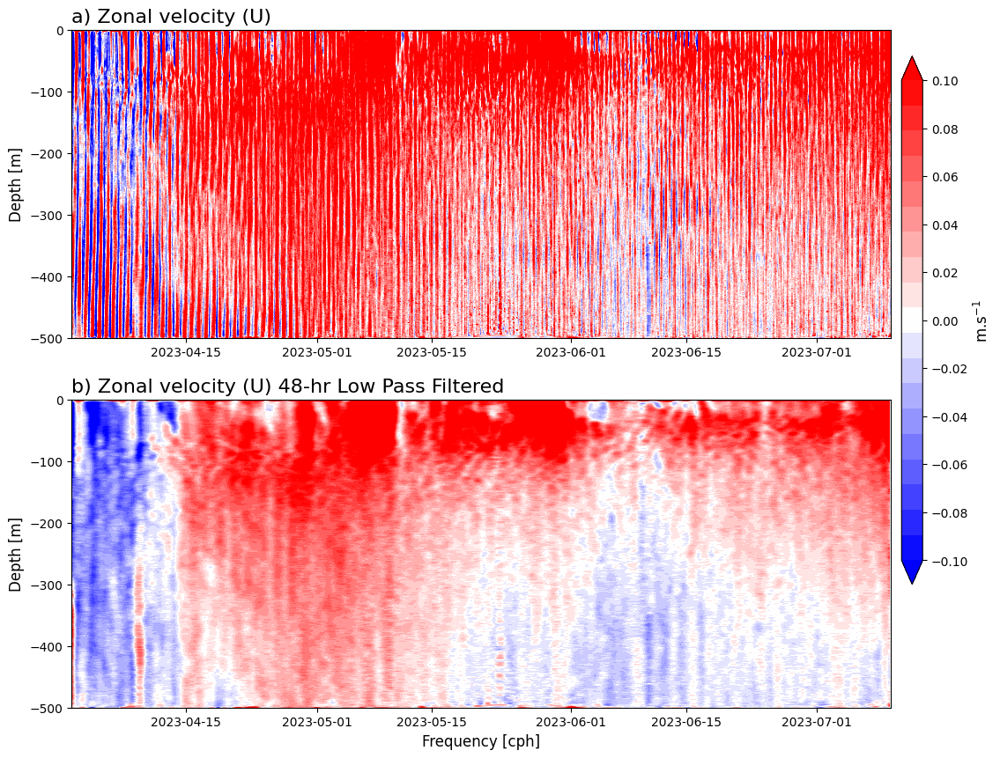

In [63]:
from matplotlib.colors import LogNorm

# depth_index=np.where((shps_r.depth >= -750) &(shps_r.depth <= -749))[0][0]-10
tick_psd = [1E-2,1E-1,1E0,1E1,1E2,1E3]
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
ymin, ymax =  -500,0
ymin1, ymax1 =  1E-2,1E3
xmin, xmax = -0.2, 0.2#0,0.1
vmin, vmax=1.e-2, 1.e3
# omega = shps_r.freq_time.values*3600#*60*24
# power_r = shps_r.data
color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'
# kr    = shps_iso.kr*1e3
level=np.linspace(vmin,vmax,20)
lev_W_exp = np.linspace(-2,3,20)
lev_W = np.power(10, lev_W_exp)
loc = 'left'

# Create subplots
fig = plt.figure(figsize=(12, 10))
gs = GridSpec(2, 2, figure=fig)
# gs = GridSpec(2, 1, height_ratios=[1, 2])

# First row, first column plot
ax1 = fig.add_subplot(gs[0,:])
ax1.contourf(time1,-z,velocity_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
ax1.set_xlim([pd.Timestamp('2023-04-01 00:25:25'), pd.Timestamp('2023-07-10 00:25:25')])
ax1.set_title(f'a) Zonal velocity (U)',loc='left',fontsize=fs+4)
ax1.set_ylim([-500,0])
# ax3.set_xlabel(r'Frequency [cph]',size=12)
ax1.set_ylabel(r'Depth [m]',size=12)
# plt.setp(ax1.get_xticklabels(), visible=False)
# ax1.grid(True)


# # First row, second column plot
# ax2 = fig.add_subplot(gs[0, 1])
# ax2.loglog(omega[omega > 0], power_r[depth_index,omega > 0], label='Counterclockwise')
# ax2.loglog(-omega[omega < 0], power_r[depth_index,omega <0], label='Clockwise ')
# # plt.semilogy(frequencies_r*3600, power_r, label='Power Spectrum')
# # ax2.axvline(x=f_inertial_cph, color='r', linestyle='--', label=f'Inertial Frequency ~{f_inertial_cph:.2f} cph')
# # ax2.axvline(x=1/12.4, color='k', linestyle='--', label=f'Semi-diurnal Frequency ~{1/12.4:.2f} cph')
# ax2.set_xlim([xmin,xmax])
# ax2.set_ylim([ymin1, ymax1])
# plt.legend()
# ax2.set_title(f"b)",loc=loc,fontsize=fs+10)
# ax2.set_xlabel('Frequency [cph]')
# ax2.set_ylabel(r'$\widehat{U}$($\omega$) [m$^2$.s$^{-3}$]')
# ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

# Second row, spanning both columns
ax3 = fig.add_subplot(gs[1,:], sharex=ax1, sharey = ax1)
cs = ax3.contourf(datetime_array[:-1],-z,data_filt_u, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
ax3.set_xlim([pd.Timestamp('2023-04-01 00:25:25'), pd.Timestamp('2023-07-10 00:25:25')])
ax3.set_title(f'b) Zonal velocity (U) 48-hr Low Pass Filtered',loc='left',fontsize=fs+4)
ax3.set_ylim([-500,0])
ax3.set_xlabel(r'Frequency [cph]',size=12)
ax3.set_ylabel(r'Depth [m]',size=12)
#cbar_ax = fig.add_axes([0.92,0.12, 0.04, 0.76])
## set the colorbar
cbar_ax = fig.add_axes([0.91, 0.25, 0.02, 0.6])
cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick,
                    extend = 'both')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_title(cs,fontsize=10)
cbar.set_label('m.s$^{-1}$',fontsize=12)#(r'$\kappa$ $\times$ $\omega$ $\times$ $\widehat{SH}$($\kappa$,$\omega$)')

#

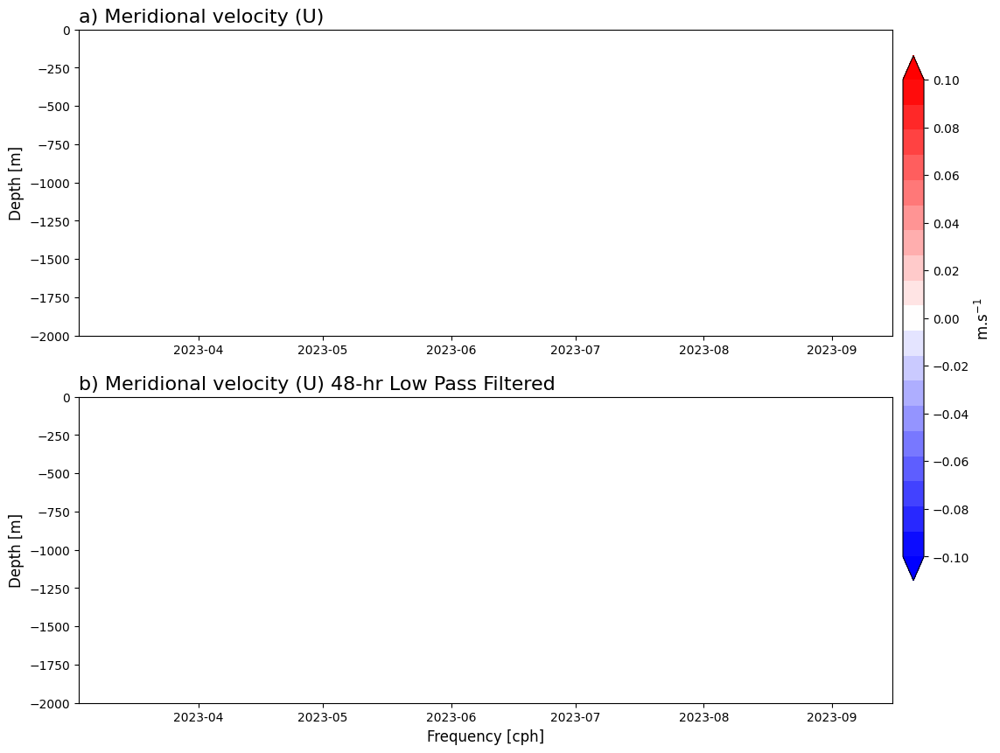

In [64]:
from matplotlib.colors import LogNorm

# depth_index=np.where((shps_r.depth >= -750) &(shps_r.depth <= -749))[0][0]-10
tick_psd = [1E-2,1E-1,1E0,1E1,1E2,1E3]
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
ymin, ymax =  -2000,0
ymin1, ymax1 =  1E-2,1E3
xmin, xmax = -0.2, 0.2#0,0.1
vmin, vmax=1.e-2, 1.e3
# omega = shps_r.freq_time.values*3600#*60*24
# power_r = shps_r.data
color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'
# kr    = shps_iso.kr*1e3
level=np.linspace(vmin,vmax,20)
lev_W_exp = np.linspace(-2,3,20)
lev_W = np.power(10, lev_W_exp)
loc = 'left'

# Create subplots
fig = plt.figure(figsize=(12, 10))
gs = GridSpec(2, 2, figure=fig)
# gs = GridSpec(2, 1, height_ratios=[1, 2])

# First row, first column plot
ax1 = fig.add_subplot(gs[0,:])
ax1.contourf(time1,z,velocity_v, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
# ax1.set_xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
ax1.set_title(f'a) Meridional velocity (U)',loc='left',fontsize=fs+4)
ax1.set_ylim([-2000,0])
# ax3.set_xlabel(r'Frequency [cph]',size=12)
ax1.set_ylabel(r'Depth [m]',size=12)
# plt.setp(ax1.get_xticklabels(), visible=False)
# ax1.grid(True)


# # First row, second column plot
# ax2 = fig.add_subplot(gs[0, 1])
# ax2.loglog(omega[omega > 0], power_r[depth_index,omega > 0], label='Counterclockwise')
# ax2.loglog(-omega[omega < 0], power_r[depth_index,omega <0], label='Clockwise ')
# # plt.semilogy(frequencies_r*3600, power_r, label='Power Spectrum')
# # ax2.axvline(x=f_inertial_cph, color='r', linestyle='--', label=f'Inertial Frequency ~{f_inertial_cph:.2f} cph')
# # ax2.axvline(x=1/12.4, color='k', linestyle='--', label=f'Semi-diurnal Frequency ~{1/12.4:.2f} cph')
# ax2.set_xlim([xmin,xmax])
# ax2.set_ylim([ymin1, ymax1])
# plt.legend()
# ax2.set_title(f"b)",loc=loc,fontsize=fs+10)
# ax2.set_xlabel('Frequency [cph]')
# ax2.set_ylabel(r'$\widehat{U}$($\omega$) [m$^2$.s$^{-3}$]')
# ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

# Second row, spanning both columns
ax3 = fig.add_subplot(gs[1,:], sharex=ax1, sharey = ax1)
cs = ax3.contourf(datetime_array[:-1],z,data_filt_v, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
# ax3.set_xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
ax3.set_title(f'b) Meridional velocity (U) 48-hr Low Pass Filtered',loc='left',fontsize=fs+4)
ax3.set_ylim([-2000,0])
ax3.set_xlabel(r'Frequency [cph]',size=12)
ax3.set_ylabel(r'Depth [m]',size=12)
#cbar_ax = fig.add_axes([0.92,0.12, 0.04, 0.76])
## set the colorbar
cbar_ax = fig.add_axes([0.91, 0.25, 0.02, 0.6])
cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick,
                    extend = 'both')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_title(cs,fontsize=10)
cbar.set_label('m.s$^{-1}$',fontsize=12)#(r'$\kappa$ $\times$ $\omega$ $\times$ $\widehat{SH}$($\kappa$,$\omega$)')

#

In [134]:
filt_u = xr.DataArray(
    data=data_filt_u,
    dims=["depth","time"],
    coords=dict(
        time=datetime_array[:-1],
        depth=(["depth"], z),
    ),
    attrs=dict(
        description="velocity",
        units="m/s",
    ),
)
filt_v = xr.DataArray(
    data=data_filt_v,
    dims=["depth","time"],
    coords=dict(
        time=datetime_array[:-1],
        depth=(["depth"], z),
    ),
    attrs=dict(
        description="velocity",
        units="m/s",
    ),
)

## Rotary spectrum

In [135]:
shps_r = xrft.power_spectrum(detrend_u_t+ 1j *detrend_v_t, dim=['time'], window='hann')

In [136]:
shps_r

<xarray.DataArray (depth: 2001, freq_time: 1198)> Size: 19MB
array([[3.97300938e+01, 2.02882554e+01, 5.38415253e+00, ...,
        1.83697848e+01, 3.87998034e+01, 6.69514440e+01],
       [2.25135658e+01, 3.25038345e+01, 7.52461665e+01, ...,
        1.81293714e+01, 5.37467752e+01, 5.88322526e+01],
       [2.32906310e+01, 5.15211207e+00, 3.15887974e-01, ...,
        2.01433754e+01, 2.71924148e+01, 7.40857234e+01],
       ...,
       [2.03878646e-01, 7.71616514e-02, 8.35364426e-02, ...,
        8.12446738e-02, 5.98642110e-01, 4.55677569e-02],
       [2.01295495e-01, 1.29215662e-01, 1.14412968e-01, ...,
        6.28679780e-02, 4.48535460e-02, 4.23250515e-02],
       [6.71209417e-02, 5.19003089e-03, 1.89630837e-02, ...,
        6.87703717e-02, 2.24921124e-01, 2.23142618e-01]])
Coordinates:
  * depth      (depth) float64 16kB -0.0 0.25 0.5 0.75 ... 499.5 499.8 500.0
  * freq_time  (freq_time) float64 10kB -6.944e-05 -6.933e-05 ... 6.933e-05

## intertial frequency computation

In [137]:
# Constants
earth_rotation_rate = 7.2921e-5  # radians per second

# Latitude of the location in degrees, replace with your actual latitude
latitude = 35.917  # example latitude

# Calculate the inertial frequency (in radians per second)
f_inertial = 2 * earth_rotation_rate * np.sin(np.radians(latitude))

# Convert inertial frequency to cycles per hour (since data step is 30 minutes)
f_inertial_cph = f_inertial / (2 * np.pi) * 3600

In [138]:
1/f_inertial_cph

20.40061751839943

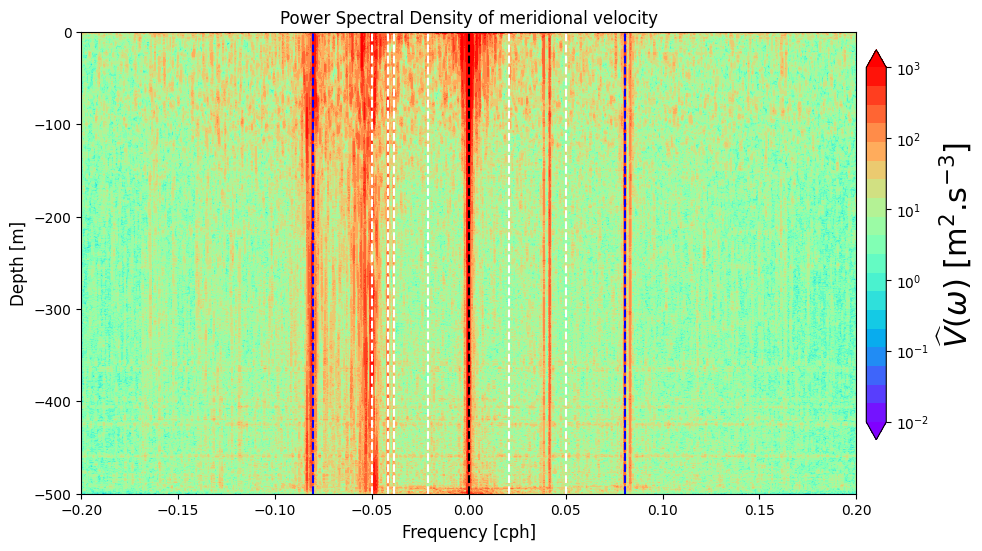

In [155]:
from matplotlib.colors import LogNorm
tick_psd = [1E-2, 1E-1,1E0,1E1,1E2,1E3]
ymin, ymax =  -500,0
xmin, xmax = -0.2, 0.2#0,0.1
vmin, vmax=1.e-1, 1.e6
omega = shps_r.freq_time*3600#*60*24
# kr    = shps_iso.kr*1e3
level=np.linspace(vmin,vmax,20)
lev_W_exp = np.linspace(-2,3,20)
lev_W = np.power(10, lev_W_exp)

fig, ax1 = plt.subplots(figsize=(10, 6))

# ax1 = fig.add_subplot(111)
cs=ax1.contourf(omega, -shps_r.depth,(shps_r), levels = lev_W, extend = 'both',
                    cmap='rainbow',
                    norm=LogNorm())
# # ax1.set_yscale('log')
# # ax1.set_xscale('log')

plt.axvline(x=-1/12.4, color='b', linestyle='--')
plt.axvline(x=1/12.4, color='b', linestyle='--')
plt.axvline(x=0, color='k', linestyle='--')
# plt.axvline(x=1/(24), color='k', linestyle='--')
plt.axvline(x=0.05, color='w', linestyle='--')
plt.axvline(x=-0.05, color='w', linestyle='--')
plt.axvline(x=-1/24, color='w', linestyle='--')
plt.axvline(x=-1/26, color='w', linestyle='--')

plt.axvline(x=-1/48, color='w', linestyle='--')

plt.axvline(x=1/48, color='w', linestyle='--')

ax1.set_title(f"Power Spectral Density of meridional velocity")
ax1.set_xlim([xmin,xmax])
ax1.set_ylim([ymin,ymax])
plt.xlabel(r'Frequency [cph]',size=12)
plt.ylabel(r'Depth [m]',size=12)
#cbar_ax = fig.add_axes([0.92,0.12, 0.04, 0.76])
## set the colorbar
cbar_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick_psd,
                    extend = 'both')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_title(cs,fontsize=10)
cbar.set_label(r'$\widehat{V}$($\omega$) [m$^2$.s$^{-3}$]',fontsize=fs+10)#(r'$\kappa$ $\times$ $\omega$ $\times$ $\widehat{SH}$($\kappa$,$\omega$)')

In [146]:
ax1.get_ylim()[1]

1000.0

/tmp/ipykernel_23879/658750531.py:119: UserWarning: Adding colorbar to a different Figure <Figure size 1000x600 with 2 Axes> than <Figure size 1200x1000 with 3 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick_psd,


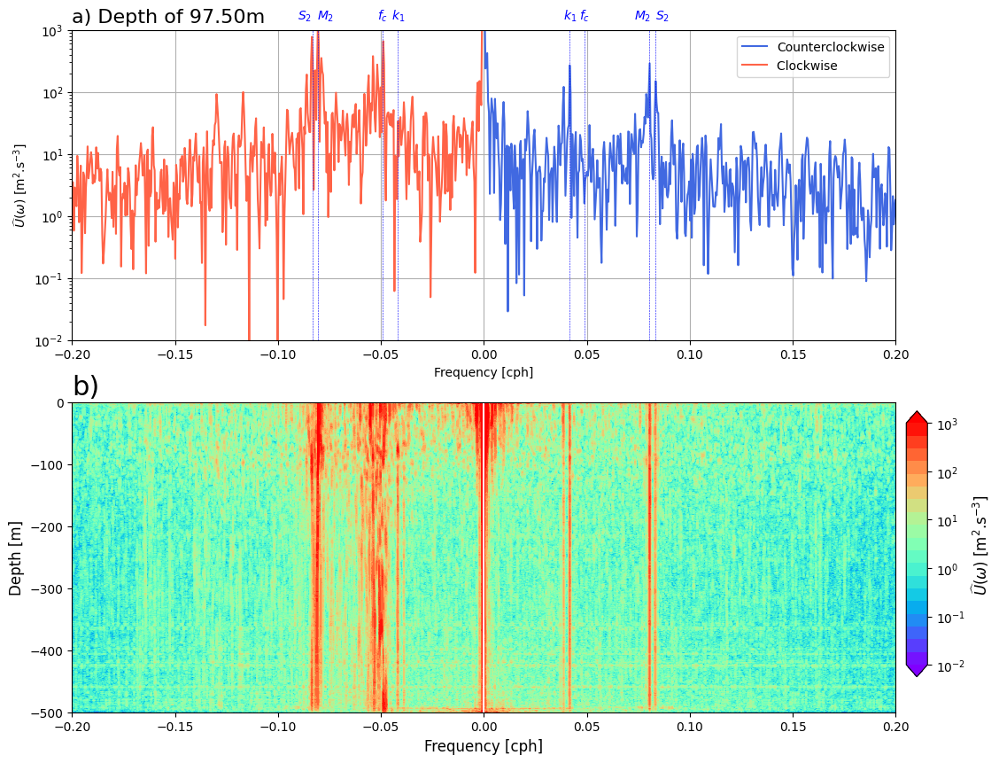

In [153]:
from matplotlib.colors import LogNorm

depth_index=np.where((shps_r.depth >= 100) &(shps_r.depth <= 101))[0][0]-10
tick_psd = [1E-2,1E-1,1E0,1E1,1E2,1E3]
ymin, ymax =  -500,0
ymin1, ymax1 =  1E-2,1E3
xmin, xmax = -0.2, 0.2#0,0.1
vmin, vmax=1.e-1, 1.e3
omega = shps_r.freq_time.values*3600#*60*24
power_r = shps_r.data
color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'
# kr    = shps_iso.kr*1e3
level=np.linspace(vmin,vmax,20)
lev_W_exp = np.linspace(-1,3,20)
lev_W = np.power(10, lev_W_exp)
loc = 'left'

# Create subplots
fig = plt.figure(figsize=(12, 10))
gs = GridSpec(2, 2, figure=fig)
# gs = GridSpec(2, 1, height_ratios=[1, 2])

# First row, first column plot
ax1 = fig.add_subplot(gs[0,:])
ax1.semilogy(omega[omega > 0], power_r[depth_index,omega > 0], color='royalblue',label='Counterclockwise')
ax1.semilogy(omega[omega < 0], power_r[depth_index,omega <0], color='tomato',label='Clockwise ')
plt.legend(loc = 'upper right')

x_value = -1/24
fc = f_inertial_cph
m2 = 1/12.42
s2 = 1/12

m2p = 1/13
s2p = 1/11.5
ax1.axvline(x=x_value, color='b', linestyle='--', linewidth=0.4)
ax1.axvline(x=-x_value, color='b', linestyle='--', linewidth=0.4)
ax1.axvline(x=fc, color='b', linestyle='--', linewidth=0.4)
ax1.axvline(x=-fc, color='b', linestyle='--', linewidth=0.4)
ax1.axvline(x=m2, color='b', linestyle='--', linewidth=0.4)
ax1.axvline(x=-m2, color='b', linestyle='--', linewidth=0.4)
ax1.axvline(x=s2, color='b', linestyle='--', linewidth=0.4)
ax1.axvline(x=-s2, color='b', linestyle='--', linewidth=0.4)


# Adding the text 'k_1' above the line
y_position = ax1.get_ylim()[1] *0.1  # 90% of the y-axis limit for positioning
ax1.text(x_value, y_position, r'$k_1$', color='b', ha='center')
ax1.text(-x_value, y_position, r'$k_1$', color='b', ha='center')
ax1.text(fc, y_position, r'$f_c$', color='b', ha='center')
ax1.text(-fc, y_position, r'$f_c$', color='b', ha='center')
ax1.text(m2p, y_position, r'$M_2$', color='b', ha='center')
ax1.text(-m2p, y_position, r'$M_2$', color='b', ha='center')
ax1.text(s2p, y_position, r'$S_2$', color='b', ha='center')
ax1.text(-s2p, y_position, r'$S_2$', color='b', ha='center')

# ax1.axvline(x=0, color='k', linestyle='--')
ax1.set_xlim([xmin,xmax])
ax1.set_ylim([ymin1, ymax1])
ax1.set_title(f"a) Depth of {shps_r.depth.values[depth_index]:.2f}m",loc=loc,fontsize=fs+4)
ax1.set_xlabel('Frequency [cph]')
ax1.set_ylabel(r'$\widehat{U}$($\omega$) [m$^2$.s$^{-3}$]')
ax1.grid(True)


# # First row, second column plot
# ax2 = fig.add_subplot(gs[0, 1])
# ax2.loglog(omega[omega > 0], power_r[depth_index,omega > 0], label='Counterclockwise')
# ax2.loglog(-omega[omega < 0], power_r[depth_index,omega <0], label='Clockwise ')
# # plt.semilogy(frequencies_r*3600, power_r, label='Power Spectrum')
# # ax2.axvline(x=f_inertial_cph, color='r', linestyle='--', label=f'Inertial Frequency ~{f_inertial_cph:.2f} cph')
# # ax2.axvline(x=1/12.4, color='k', linestyle='--', label=f'Semi-diurnal Frequency ~{1/12.4:.2f} cph')
# ax2.set_xlim([xmin,xmax])
# ax2.set_ylim([ymin1, ymax1])
# plt.legend()
# ax2.set_title(f"b)",loc=loc,fontsize=fs+10)
# ax2.set_xlabel('Frequency [cph]')
# ax2.set_ylabel(r'$\widehat{U}$($\omega$) [m$^2$.s$^{-3}$]')
# ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

# Second row, spanning both columns
ax3 = fig.add_subplot(gs[1,:], sharex=ax1)
ax3.contourf(omega, -shps_r.depth,(shps_r), levels = lev_W, extend = 'both',
                    cmap='rainbow',
                    norm=LogNorm())
# ax3.axvline(x=-1/12.4, color='b', linestyle='--')
# ax3.axvline(x=1/12.4, color='b', linestyle='--')
ax3.axvline(x=0, color='w', linestyle='-')

# # plt.axvline(x=1/(24), color='k', linestyle='--')
# ax3.axvline(x=0.05, color='w', linestyle='--')
# ax3.axvline(x=-0.05, color='w', linestyle='--')



# ax1.axvline(x=-1/24, color='k', linestyle='--',linewidth=0.2)
# ax1.text(1/24, plt.ylim()[1] * 0.9, 'k_1', color='b', ha='center')

# Annotate vertical lines
# ax3.text(-f_inertial_cph, ymax, f'$f$', color='b', fontsize=8, ha='left')
# # ax3.text(1/12.4, ymax, f'{1/12.4:.2f}', color='b', fontsize=8, ha='right')
# ax3.text(0.05, ymax, '0.05', color='w', fontsize=8, ha='right')
# ax3.text(-0.05, ymax, '-0.05', color='w', fontsize=8, ha='left')
# ax3.text(-1/24, ymax, r'$day$', color='k', fontsize=8, ha='left')

ax3.set_title(f"b)",loc=loc,fontsize=fs+10)
ax3.set_xlim([xmin,xmax])
ax3.set_ylim([ymin,ymax])
ax3.set_xlabel(r'Frequency [cph]',size=12)
ax3.set_ylabel(r'Depth [m]',size=12)
#cbar_ax = fig.add_axes([0.92,0.12, 0.04, 0.76])
## set the colorbar
cbar_ax = fig.add_axes([0.91, 0.15, 0.02, 0.3])
cbar = fig.colorbar(cs, cax=cbar_ax, ticks = tick_psd,
                    extend = 'both')
cbar.ax.tick_params(labelsize=10)
#cbar.ax.set_title(cs,fontsize=10)
cbar.set_label(r'$\widehat{U}$($\omega$) [m$^2$.s$^{-3}$]',fontsize=12)#(r'$\kappa$ $\times$ $\omega$ $\times$ $\widehat{SH}$($\kappa$,$\omega$)')

#

In [154]:
1/0.15

6.666666666666667

In [ ]:
1/24

## read aviso and swot

In [362]:
directory = '/mnt/flow/swot/Matt_Analysis/CNES_L3_CalVal/version_V1_0/'
nc_swot = xr.open_dataset(directory+'SUBSET_SWOT_UV_PASS_013_OVER_CALVAL_REGION_V1.0.nc')
nc_avi = xr.open_dataset(directory+'SUBSET_AVISO_UV_PASS_013_OVER_CALVAL_REGION_V1.0.nc')

In [363]:
nc_swot

<xarray.Dataset>
Dimensions:     (time: 97, num_lines: 407, num_pixels: 69)
Coordinates:
    latitude    (num_lines, num_pixels) float64 ...
    longitude   (num_lines, num_pixels) float64 ...
  * time        (time) datetime64[ns] 2023-03-29T08:51:06.750832384 ... 2023-...
Dimensions without coordinates: num_lines, num_pixels
Data variables:
    SSH         (time, num_lines, num_pixels) float64 ...
    u_g         (time, num_lines, num_pixels) float64 ...
    v_g         (time, num_lines, num_pixels) float64 ...
    v_n         (time, num_lines, num_pixels) float64 ...
    v_e         (time, num_lines, num_pixels) float64 ...
    grad_ssh_x  (time, num_lines, num_pixels) float64 ...
    grad_ssh_y  (time, num_lines, num_pixels) float64 ...
    ut_g        (time, num_lines, num_pixels) float64 ...

In [493]:
from scipy.interpolate import griddata
ds = nc_swot

# Define the point of interest
lon_s2 = -125.044
lat_s2 = 35.917

# Prepare to store interpolated results
times = ds.time
num_times = len(times)

# Initialize arrays to store the interpolated values
variables_to_interpolate = ['u_g', 'v_g']

# Create a dictionary to store interpolated results
interpolated_results = {var: np.zeros(num_times) for var in variables_to_interpolate}

# Flatten the latitude and longitude coordinates
lat_flat = ds['latitude'].values.flatten()
lon_flat = ds['longitude'].values.flatten()

# Prepare the grid points for interpolation
grid_points = np.array([(lat_s2, lon_s2)])

# Iterate over the time dimension
for idt in range(num_times):
    for var in variables_to_interpolate:
        # Flatten the variable values for interpolation
        var_flat = ds[var][idt, :, :].values.ravel()

        # Perform interpolation using SciPy's griddata
        interpolated_value = griddata(
            (lat_flat, lon_flat),  # Original latitudes and longitudes
            var_flat,              # Variable values
            grid_points,           # Coordinates for interpolation
            method='linear'        # Interpolation method (you can change this)
        )

        # Store the interpolated value
        interpolated_results[var][idt] = interpolated_value

# Create an xarray Dataset to store the interpolated time series
result_ds = xr.Dataset({
    var: xr.DataArray(interpolated_results[var], dims=['time'], coords={'time': times})
    for var in variables_to_interpolate
})

print(result_ds)

/tmp/ipykernel_40014/4143423400.py:40: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  interpolated_results[var][idt] = interpolated_value


<xarray.Dataset>
Dimensions:  (time: 97)
Coordinates:
  * time     (time) datetime64[ns] 2023-03-29T08:51:06.750832384 ... 2023-07-...
Data variables:
    u_g      (time) float64 -0.2808 nan -0.1955 ... 0.1577 0.1995 0.04687
    v_g      (time) float64 -0.06478 nan 0.1743 ... -0.02722 0.06559 -0.04713


In [463]:
lon_s2 = -125.044
lat_s2 = 35.917
# nc_interp = nc.interp(longitude=lon_s2, latitude=lat_s2, method='linear')

interp_u_swot = filt_u.interp(time=averaged_nc_avi.time, method='linear')
interp_v_swot = filt_v.interp(time=averaged_nc_avi.time, method='linear')

In [464]:
np.nanmean(interp_u_swot[idz,:],0).shape

/tmp/ipykernel_40014/325603959.py:1: RuntimeWarning: Mean of empty slice
  np.nanmean(interp_u_swot[idz,:],0).shape


(97,)

## average swot avison on a cycle aroud s2 position

In [465]:
# Define the point of interest and radius
lon_s2 = -125.044
lat_s2 = 35.917
radius_km = 10  # Radius in kilometers

# Earth's radius in kilometers
earth_radius_km = 6371.0
variables_swot = ['u_g', 'v_g', 'v_e', 'v_n','ut_g']
variables_avi = ['ugosa', 'vgosa','utgosa']

# Apply the function to both datasets
averaged_nc_swot = average_within_radius(nc_swot, lon_s2, lat_s2, radius_km, earth_radius_km, variables_swot)
averaged_nc_avi = average_within_radius(nc_avi, lon_s2, lat_s2, radius_km, earth_radius_km,variables_avi)

# Print the averaged datasets
print("Averaged nc_swot dataset:")
print(averaged_nc_swot)

print("\nAveraged nc_avi dataset:")
print(averaged_nc_avi)

Averaged nc_swot dataset:
<xarray.Dataset>
Dimensions:  (time: 97)
Coordinates:
  * time     (time) datetime64[ns] 2023-03-29T08:51:06.750832384 ... 2023-07-...
Data variables:
    u_g      (time) float64 -0.2906 nan -0.1823 ... 0.1699 0.1815 0.1562
    v_g      (time) float64 -0.06264 nan 0.1694 ... -0.008762 0.07771 -0.02381
    v_e      (time) float64 -0.2319 nan 0.01645 ... 0.1004 0.1748 0.08011
    v_n      (time) float64 -0.265 nan -0.03452 0.03645 ... 0.1263 0.1898 0.1062
    ut_g     (time) float64 0.2991 nan 0.2671 0.2244 ... 0.1727 0.1997 0.1708

Averaged nc_avi dataset:
<xarray.Dataset>
Dimensions:  (time: 97)
Coordinates:
  * time     (time) datetime64[ns] 2023-03-29T08:51:06.750832384 ... 2023-07-...
Data variables:
    ugosa    (time) float64 -0.07634 nan -0.1124 ... 0.1591 0.1645 0.1667
    vgosa    (time) float64 0.1108 nan 0.08771 ... 0.04394 0.02841 0.0195
    utgosa   (time) float64 0.1354 nan 0.1429 0.1321 ... 0.1662 0.1683 0.1696


In [466]:
idz = np.where((z<-10) &(z>-40))[0]

In [467]:
z[idz]

array([-39.77715086, -38.11976957, -36.46238829, -34.805007  ,
       -33.14762572, -31.49024443, -29.83286315, -28.17548186,
       -26.51810057, -24.86071929, -23.203338  , -21.54595672,
       -19.88857543, -18.23119414, -16.57381286, -14.91643157,
       -13.25905029, -11.601669  ])

/tmp/ipykernel_40014/1250522644.py:4: RuntimeWarning: Mean of empty slice
  plt.plot(averaged_nc_avi.time,np.nanmean(interp_u_swot[idz,:],0),'k', label='ACDP at '+str(int(z[indz]))+'m')


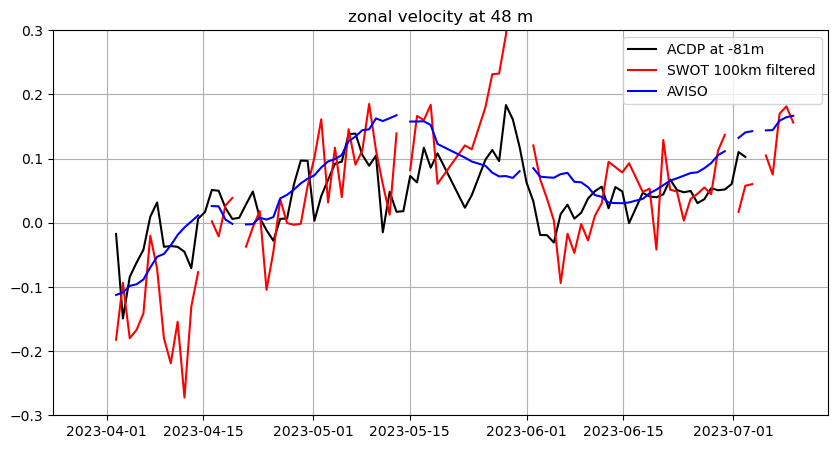

In [468]:
indz = -50
plt.figure(figsize=(10, 5))

plt.plot(averaged_nc_avi.time,np.nanmean(interp_u_swot[idz,:],0),'k', label='ACDP at '+str(int(z[indz]))+'m')
# plt.plot(interp_u_aviso.time,(interp_u_aviso[-4,:]**2+interp_u_aviso[-4,:]**2),'r', label='ACDP at 31 m')

# plt.plot(daily_average.time,(interp_u_aviso[-20,:]),'b', label='ACDP at 31 m')
# plt.plot(nc.time, np.nanmean(interp_u_aviso[indz,:],0),'--r')
plt.plot(averaged_nc_avi.time, averaged_nc_swot.u_g,'r', label='SWOT 100km filtered')#-np.nanmean(nc_interp.ugosa),'--b')
plt.plot(averaged_nc_avi.time, averaged_nc_avi.ugosa,'b', label='AVISO')#-np.nanmean(nc_interp.ugosa),'--b')

plt.title('zonal velocity at 48 m')
plt.ylim([-.3,.3])
plt.legend()
plt.grid(True)

/tmp/ipykernel_40014/3658326637.py:27: RuntimeWarning: Mean of empty slice
  ax.plot(averaged_nc_avi.time,np.nanmean( interp_v_swot[idz,:],0),'k',lw=lw, label='5-day LPF ACDP at '+str(int(z[idz][0]))+' to '+str(int(z[idz][-1]))+'m')


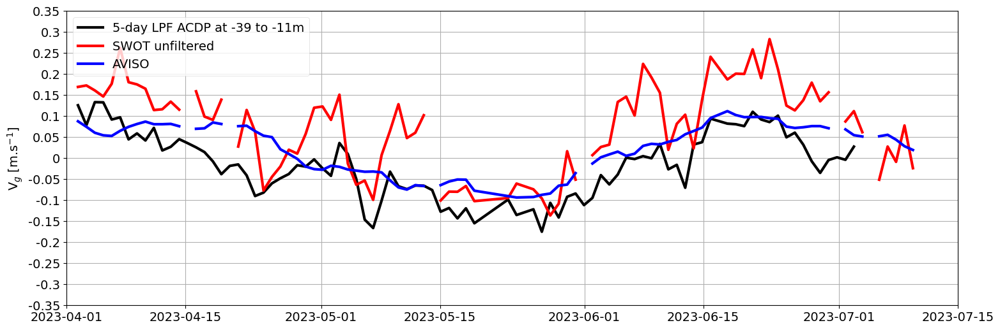

In [471]:
dmin, dmax = -.35,.35#-.25,.25
lw = 3; loc = 'upper left'; locs = 'center left'
############################################################
#############################3 prepare the plot
ifont = 25; unit = '$m$'
sizz = 14; colors = 'gray'; pts = 15
levels = np.linspace(vmin, vmax, pts)
xyfont = 25
xtick = ['2023-04-01','2023-01-15','2023-05-01','2023-05-15',
         '2023-06-01','2023-06-15','2023-07-01','2023-07-15']
xlabel = ['04/01','04/15','05/01','05/15','06/01','06/15','07/01','07/15']
#### set up xlim an y lim
xlim1 = np.datetime64('2023-04-01')
xlim2 = np.datetime64('2023-07-15')
# xticklabels = ['2023-04-01T16', '2023-04-20', '2023-05-09', '2023-05-29','2023-06-18','2023-07-10T23']  # Specify the corresponding tick labels


ytick = [-0.35,-0.3,-0.25,-0.2,-0.15,-0.1,-0.05,0,0.05,0.1,0.15,0.2,0.25,0.3,0.35]
         
ylabel = ['-0.35','-0.3','-0.25','-0.2','-0.15','-0.1','-0.05','0','0.05','0.1','0.15','0.2','0.25','0.3','0.35']

indz = -20
###################################################
fig, ax = plt.subplots(figsize=(18,6))  
####### old
ax = plt.subplot(111)
ax.plot(averaged_nc_avi.time,np.nanmean( interp_v_swot[idz,:],0),'k',lw=lw, label='5-day LPF ACDP at '+str(int(z[idz][0]))+' to '+str(int(z[idz][-1]))+'m')
ax.plot(averaged_nc_avi.time, averaged_nc_swot.v_g,'r',lw=lw, label='SWOT unfiltered')#-np.nanmean(nc_interp.ugosa),'--b')
ax.plot(averaged_nc_avi.time, averaged_nc_avi.vgosa,'b',lw=lw, label='AVISO')#-np.nanmean(nc_interp.ugosa),'--b')

ax.xaxis.set_tick_params(labelsize=sizz)
ax.yaxis.set_tick_params(labelsize=sizz)
ax.set_xlim([xlim1, xlim2])
ax.set_ylim(dmin,dmax)
ax.xaxis.set_tick_params(labelsize=sizz)
ax.yaxis.set_tick_params(labelsize=sizz)
# ax.set_xticks(xticks)
# ax.set_xticklabels(xlabel)
ax.set_yticks(ytick)
ax.set_yticklabels(ylabel)
legend_properties = {'size':sizz}
lg = plt.legend(loc=loc,prop=legend_properties)
lg.get_frame().set_ec('lightgray')
lg.get_frame().set_lw(0.5)
# ax.set_title('(a)', loc='left',fontsize=sizz,
#          fontweight='bold', color = colors)
# ax.set_xlabel('$Time$',fontsize=sizz)
ax.set_ylabel('V$_g$ [m.s$^{-1}$]',fontsize=sizz) # regex: ($10log10$)
#title_text = r'$\bf{Standard\ deviation\ computed\ over\ along\ and\ cross\ track}$'
#title = fig.suptitle(title_text, y=0.97, fontsize=sizz)
# title.set_color('blue')
# title.set_bbox(dict(facecolor='white', edgecolor='red', boxstyle='round'))
# plt.tight_layout()
ax.grid()


ValueError: x and y must have same first dimension, but have shapes (99,) and (97,)

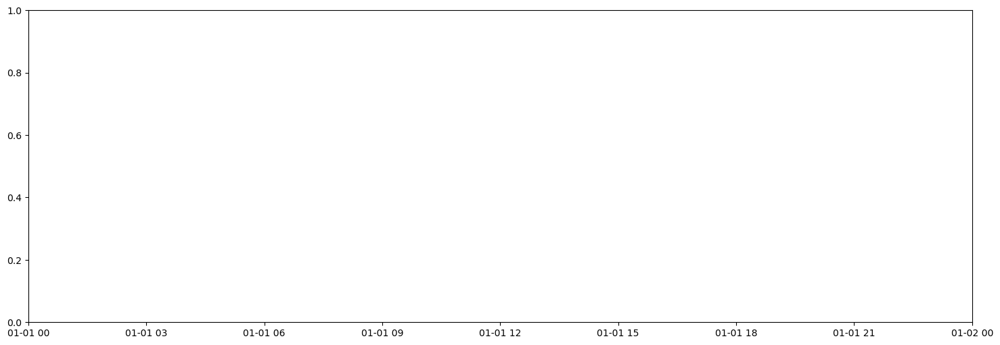

In [425]:
dmin, dmax = -.25,.25
lw = 3; loc = 'lower center'; locs = 'center left'
############################################################
#############################3 prepare the plot
ifont = 25; unit = '$m$'
sizz = 14; colors = 'gray'; pts = 15
levels = np.linspace(vmin, vmax, pts)
xyfont = 25
xtick = ['2023-04-01','2023-01-15','2023-05-01','2023-05-15',
         '2023-06-01','2023-06-15','2023-07-01','2023-07-15']
xlabel = ['04/01','04/15','05/01','05/15','06/01','06/15','07/01','07/15']
#### set up xlim an y lim
xlim1 = np.datetime64('2023-04-01')
xlim2 = np.datetime64('2023-07-15')
# xticklabels = ['2023-04-01T16', '2023-04-20', '2023-05-09', '2023-05-29','2023-06-18','2023-07-10T23']  # Specify the corresponding tick labels


ytick = [-0.25,-0.2,-0.15,-0.1,-0.05,0,0.25,0.2,0.15,0.1,0.05]
         
ylabel = ['-0.25','-0.2','-0.15','-0.1','-0.05','0','0.05','0.1','0.15','0.2','0.25']

indz = -20
###################################################
fig, ax = plt.subplots(figsize=(18,6))  
####### old
ax = plt.subplot(111)
ax.plot(interp_u_aviso.time,(interp_u_swot[indz,:]),'k',lw=lw, label='ACDP at '+str(int(z[indz]))+'m')
ax.plot(result_ds.time, averaged_nc_swot.u_g,'r',lw=lw, label='SWOT 100km filtered')#-np.nanmean(nc_interp.ugosa),'--b')
ax.plot(result_ds.time, averaged_nc_avi.ugosa,'b',lw=lw, label='AVISO')#-np.nanmean(nc_interp.ugosa),'--b')

ax.xaxis.set_tick_params(labelsize=sizz)
ax.yaxis.set_tick_params(labelsize=sizz)
ax.set_xlim([xlim1, xlim2])
ax.set_ylim(dmin,dmax)
ax.xaxis.set_tick_params(labelsize=sizz)
ax.yaxis.set_tick_params(labelsize=sizz)
# ax.set_xticks(xticks)
# ax.set_xticklabels(xlabel)
ax.set_yticks(ytick)
ax.set_yticklabels(ylabel)
legend_properties = {'size':sizz}
lg = plt.legend(loc=loc,prop=legend_properties)
lg.get_frame().set_ec('lightgray')
lg.get_frame().set_lw(0.5)
# ax.set_title('(a)', loc='left',fontsize=sizz,
#          fontweight='bold', color = colors)
# ax.set_xlabel('$Time$',fontsize=sizz)
ax.set_ylabel('U$_g$ [m.s$^{-1}$]',fontsize=sizz) # regex: ($10log10$)
#title_text = r'$\bf{Standard\ deviation\ computed\ over\ along\ and\ cross\ track}$'
#title = fig.suptitle(title_text, y=0.97, fontsize=sizz)
# title.set_color('blue')
# title.set_bbox(dict(facecolor='white', edgecolor='red', boxstyle='round'))
# plt.tight_layout()
ax.grid()


## raw swot plot of zonal (ug) velocity 

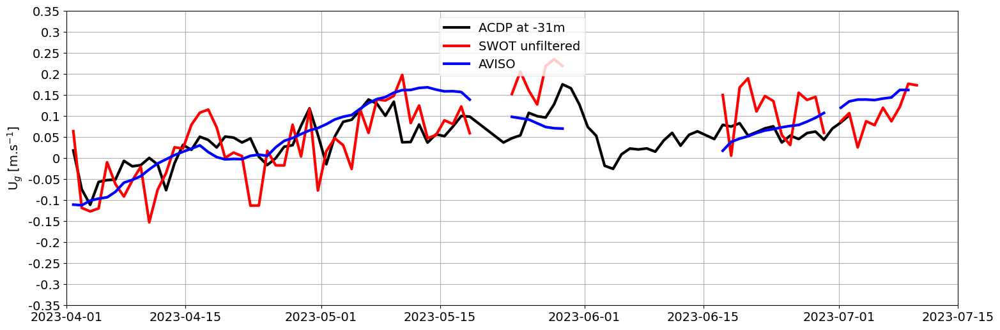

In [349]:
dmin, dmax = -.35,.35#-.25,.25
lw = 3; loc = 'upper center'; locs = 'center left'
############################################################
#############################3 prepare the plot
ifont = 25; unit = '$m$'
sizz = 14; colors = 'gray'; pts = 15
levels = np.linspace(vmin, vmax, pts)
xyfont = 25
xtick = ['2023-04-01','2023-01-15','2023-05-01','2023-05-15',
         '2023-06-01','2023-06-15','2023-07-01','2023-07-15']
xlabel = ['04/01','04/15','05/01','05/15','06/01','06/15','07/01','07/15']
#### set up xlim an y lim
xlim1 = np.datetime64('2023-04-01')
xlim2 = np.datetime64('2023-07-15')
# xticklabels = ['2023-04-01T16', '2023-04-20', '2023-05-09', '2023-05-29','2023-06-18','2023-07-10T23']  # Specify the corresponding tick labels


ytick = [-0.35,-0.3,-0.25,-0.2,-0.15,-0.1,-0.05,0,0.05,0.1,0.15,0.2,0.25,0.3,0.35]
         
ylabel = ['-0.35','-0.3','-0.25','-0.2','-0.15','-0.1','-0.05','0','0.05','0.1','0.15','0.2','0.25','0.3','0.35']

indz = -20
###################################################
fig, ax = plt.subplots(figsize=(18,6))  
####### old
ax = plt.subplot(111)
ax.plot(interp_u_aviso.time,(interp_u_swot[indz,:]),'k',lw=lw, label='ACDP at '+str(int(z[indz]))+'m')
ax.plot(result_ds.time, averaged_nc_swot.u_g,'r',lw=lw, label='SWOT unfiltered')#-np.nanmean(nc_interp.ugosa),'--b')
ax.plot(result_ds.time, averaged_nc_avi.ugosa,'b',lw=lw, label='AVISO')#-np.nanmean(nc_interp.ugosa),'--b')

ax.xaxis.set_tick_params(labelsize=sizz)
ax.yaxis.set_tick_params(labelsize=sizz)
ax.set_xlim([xlim1, xlim2])
ax.set_ylim(dmin,dmax)
ax.xaxis.set_tick_params(labelsize=sizz)
ax.yaxis.set_tick_params(labelsize=sizz)
# ax.set_xticks(xticks)
# ax.set_xticklabels(xlabel)
ax.set_yticks(ytick)
ax.set_yticklabels(ylabel)
legend_properties = {'size':sizz}
lg = plt.legend(loc=loc,prop=legend_properties)
lg.get_frame().set_ec('lightgray')
lg.get_frame().set_lw(0.5)
# ax.set_title('(a)', loc='left',fontsize=sizz,
#          fontweight='bold', color = colors)
# ax.set_xlabel('$Time$',fontsize=sizz)
ax.set_ylabel('U$_g$ [m.s$^{-1}$]',fontsize=sizz) # regex: ($10log10$)
#title_text = r'$\bf{Standard\ deviation\ computed\ over\ along\ and\ cross\ track}$'
#title = fig.suptitle(title_text, y=0.97, fontsize=sizz)
# title.set_color('blue')
# title.set_bbox(dict(facecolor='white', edgecolor='red', boxstyle='round'))
# plt.tight_layout()
ax.grid()


In [186]:
path_prof = '/mnt/flow/swot/calval/Data/insitu_mooring/JPL_QC/PROFILERS/'
nc_p = xr.open_dataset(path_prof+'SWOTPOSTLAUNCH_L2_JPLQC_MOORING-S2_CTD-PROFILER_START20230303_END20230728_RT_VER002_5s4s_alltimes.nc')

In [188]:
lat_p = nc_p.LATITUDE_GPSSB_STERIC_HEIGHT.values
lon_p = nc_p.LONGITUDE_GPSSB_STERIC_HEIGHT.values

In [189]:
np.nanmin(lon_p)

-125.05067432814324

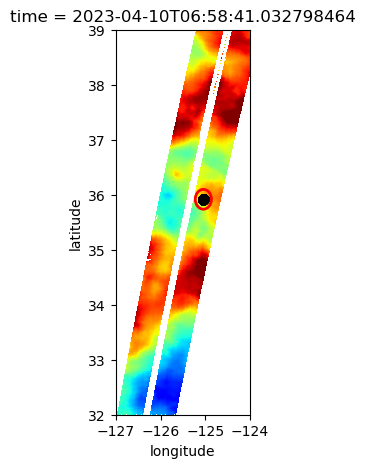

In [573]:
params = {
    'vmin': -0.15,
    'vmax': 0.15,
    'x': 'longitude',
    'y': 'latitude',
    'xlim': (-127, -124),
    'ylim': (32, 39),
    'cmap': 'jet',
    'add_colorbar': False  # Disable individual colorbars
}
# Define the point of interest and radius
lon_s2 = -125.044
lat_s2 = 35.917
radius_km = 20  # Radius in kilometers

# Convert radius from kilometers to degrees (approximation)
radius_deg = radius_km / 111.0  # 1 degree ≈ 111 km

# Plotting SSH variable from nc_swot as an example
plt.figure(figsize=(5, 5))
ax = plt.gca()

# Plot the data
nc_swot['SSH'].isel(time=10).plot(ax=ax,**params)
# scatter plot of lon and lat of s2 function of time
ax.scatter(lon_p,lat_p,color='k')

# Add the circle
circle = plt.Circle((lon_s2, lat_s2), radius_deg, color='red', fill=False, linewidth=2)
ax.add_artist(circle)
# Get the y-axis limits
ylim = ax.get_ylim()

# Calculate the mean latitude in radians
mean_lat = np.deg2rad((ylim[1] + ylim[0]) / 2)

# Set the data aspect ratio
ax.set_aspect(1 / np.cos(mean_lat))

# Add the center point
# plt.plot(lon_s2, lat_s2, 'bo')  # Red point at the center


# # Set plot limits to focus on the area of interest
# plt.xlim(lon_s2 - 2*radius_deg, lon_s2 + 2*radius_deg)
# plt.ylim(lat_s2 - 2*radius_deg, lat_s2 + 2*radius_deg)

# plt.title('SSH with Circle around Point of Interest')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.grid(True)

/tmp/ipykernel_45363/2761686952.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


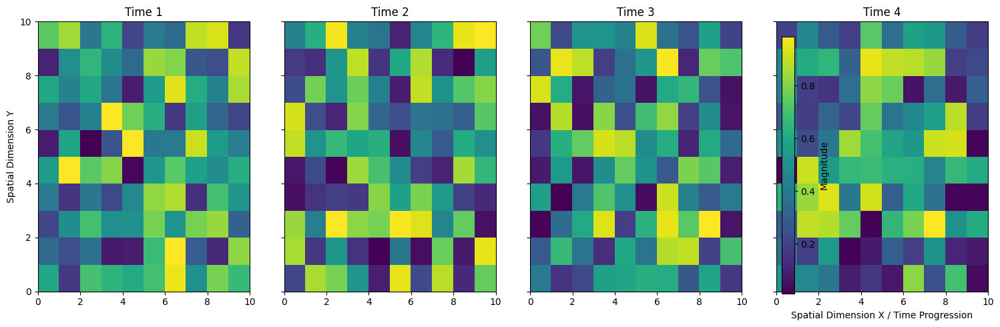

In [79]:
import matplotlib.pyplot as plt
import numpy as np

# Example data: Create a list of 2D arrays to represent different time steps
data_list = [np.random.rand(10, 10) for _ in range(4)]  # Replace with actual data for each time step
time_labels = ["Time 1", "Time 2", "Time 3", "Time 4"]  # Labels for each time step

# Create figure and subplots in a single row to represent time evolution on x-axis
fig, axes = plt.subplots(1, len(data_list), figsize=(15, 5), sharey=True)

# Loop through each dataset and corresponding axis to plot `pcolor` maps
for i, (data, ax) in enumerate(zip(data_list, axes)):
    # Create pcolor plot for each time step
    c = ax.pcolor(data, cmap='viridis', shading='auto')
    ax.set_title(time_labels[i])
    if i == 0:
        ax.set_ylabel("Spatial Dimension Y")  # Set common y-axis label for the first plot only

    # Set common x-axis label only on the last subplot to represent time evolution
    if i == len(data_list) - 1:
        ax.set_xlabel("Spatial Dimension X / Time Progression")

# Add a single shared colorbar across all subplots
fig.colorbar(c, ax=axes.ravel().tolist(), orientation='vertical', label='Magnitude')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


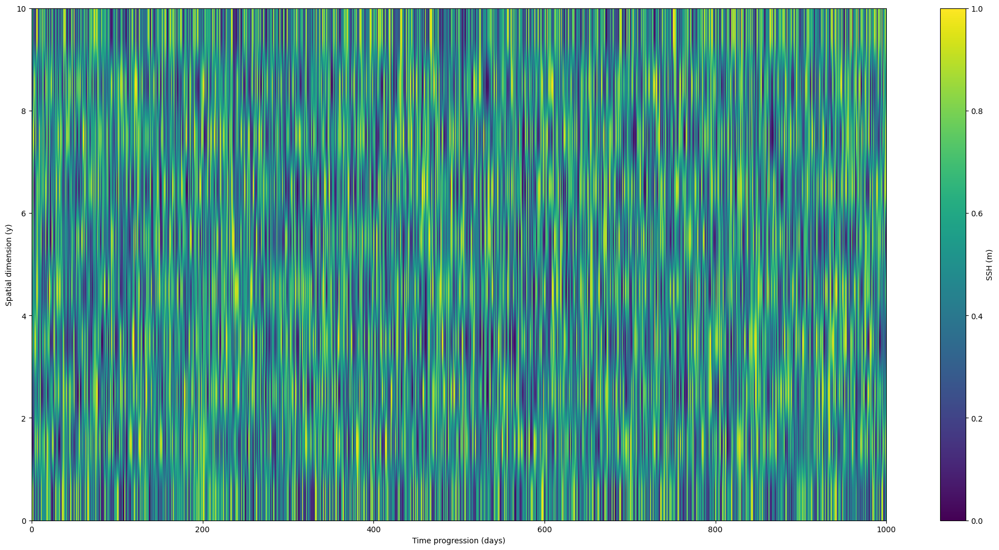

In [82]:

# Example data: 3D array where each 2D slice represents SSH at a different time
time_steps = 100  # Number of time steps (days)
y_dim, x_dim = 10, 10  # Dimensions of each SSH grid
ssh_data = np.random.rand(time_steps, y_dim, x_dim)  # Replace with actual SSH data

# Create a figure to hold the mosaic
fig, ax = plt.subplots(figsize=(20, 10))

# Loop through each time slice and add it to the plot
for t in range(time_steps):
    extent = [t * x_dim, (t + 1) * x_dim, 0, y_dim]  # Extent to place each slice horizontally
    ax.imshow(ssh_data[t], extent=extent, origin='lower', cmap='viridis', aspect='auto', vmin=0, vmax=1)

# Customize plot to show time progression
ax.set_xlim(0, time_steps * x_dim)  # Total width to fit all time slices
ax.set_ylim(0, y_dim)
ax.set_xlabel('Time progression (days)')
ax.set_ylabel('Spatial dimension (y)')

# Add colorbar
cbar = fig.colorbar(ax.images[0], ax=ax, orientation='vertical', label='SSH (m)')

plt.tight_layout()
plt.show()


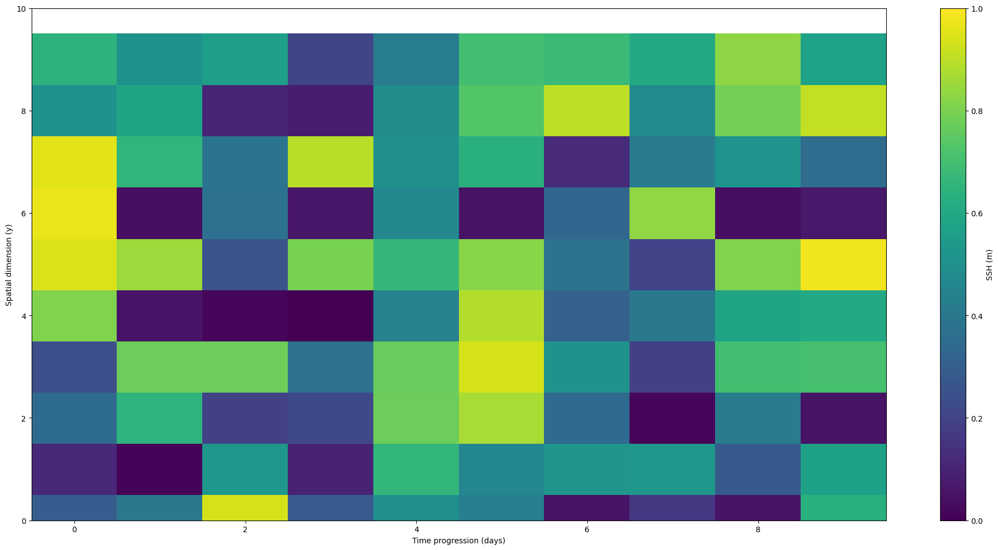

In [92]:
import matplotlib.pyplot as plt
import numpy as np

# Example data: 3D array where each 2D slice represents SSH at a different time
time_steps = 100  # Number of time steps (days)
y_dim, x_dim = 10, 10  # Dimensions of each SSH grid
ssh_data = np.random.rand(time_steps, y_dim, x_dim)  # Replace with actual SSH data

# Create figure
fig, ax = plt.subplots(figsize=(20, 10))

# Loop through each time slice and add it to the plot
for t in range(time_steps):
    # Generate x and y grid for pcolor (offset each slice by x_dim)
    x = np.arange(x_dim) #+ x_dim  # Shift x-coordinates for each slice
    y = np.arange(y_dim)
    X, Y = np.meshgrid(x, y)
    
    # Plot each time step's SSH data with pcolor
    c = ax.pcolor(X, Y, ssh_data[t], cmap='viridis', shading='auto', vmin=0, vmax=1)

# Set axis limits to accommodate all time steps
# ax.set_xlim(0, 12)
ax.set_ylim(0, y_dim)
ax.set_xlabel('Time progression (days)')
ax.set_ylabel('Spatial dimension (y)')

# Add colorbar for SSH values
fig.colorbar(c, ax=ax, orientation='vertical', label='SSH (m)')

plt.tight_layout()
plt.show()

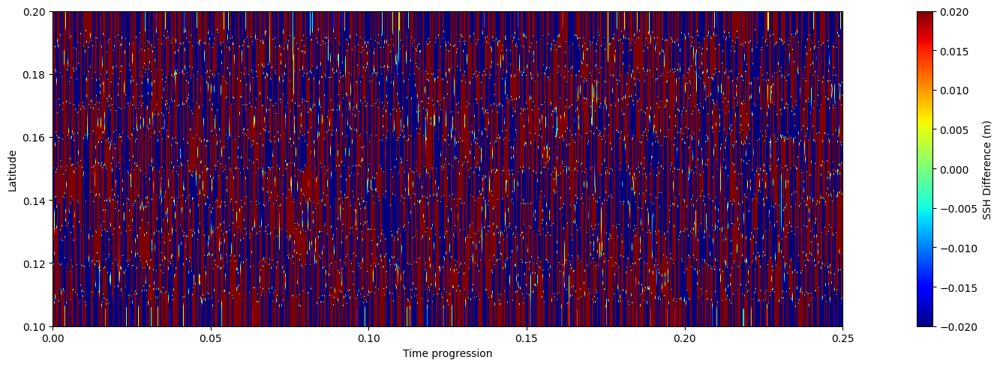

In [97]:
import matplotlib.pyplot as plt
import numpy as np

# Example data setup
total_time_steps = 100  # Number of time steps (days)
lat_dim, lon_dim = 10, 10  # Dimensions of each SSH grid (latitude, longitude)
ncom_to_swot = np.random.rand(total_time_steps, lat_dim, lon_dim)  # Example SSH data 1
filtered_ssh_data = np.random.rand(total_time_steps, lat_dim, lon_dim)  # Example SSH data 2

# Calculate the SSH difference for each time step
ssh_diff_data = ncom_to_swot - filtered_ssh_data

# Define figure dimensions and image size
figure_width = 20  # Total figure width to fit all images
figure_height = 5  # Figure height
image_width = 0.25 / total_time_steps  # Adjusted width for each image in mosaic
image_height = 0.2  # Height for each image in mosaic

# Create the figure and axes
fig, ax = plt.subplots(figsize=(figure_width, figure_height))

# Loop through each time step and plot the SSH difference image
for t in range(total_time_steps):
    x_position = t * image_width  # Calculate x-position for the current image
    ssh_image = ssh_diff_data[t]  # SSH difference data for the current time step
    
    # Plot the SSH difference using `imshow`
    ax.imshow(
        ssh_image,
        vmin=-0.02, vmax=0.02,
        cmap='jet',
        origin='upper',
        extent=[x_position, x_position + image_width, 0.1, image_height]
    )

# Set axis labels and limits
ax.set_xlabel('Time progression')
ax.set_ylabel('Latitude')
ax.set_xlim(0, image_width * total_time_steps)  # Set x-axis limits to fit all images
# ax.set_ylim(0.1, image_height)  # Set y-axis limits based on the extent specified

# Add a colorbar
cbar = fig.colorbar(ax.images[0], ax=ax, orientation='vertical', label='SSH Difference (m)')

plt.tight_layout()
plt.show()

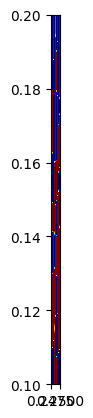

In [98]:
plt.imshow(
        ssh_image, vmin = -0.02, vmax = 0.02,
        cmap='jet', 
        origin='upper', 
        extent=[x_position, x_position + image_width, 0.1, image_height]
    )

## projection of the mode

In [45]:
import os 
def qgdecomp(z,N2,f0):
    import numpy as np
    M = D2matrix(z, N2,f0)
    w, vi = np.linalg.eig(M)
    vi = vi[:, np.argsort(w)]
    vi = vi / vi[0,:].reshape(1,-1) #eigenfunction
    w = np.sort(w) #eigenvalue
    return w, vi

In [46]:
import math

def coriolis_parameter(latitude):
    # Convert latitude from degrees to radians
    latitude_radians = math.radians(latitude)
    
    # Earth's angular velocity in radians per second
    omega = 7.2921e-5
    
    # Compute the Coriolis parameter
    f = 2 * omega * math.sin(latitude_radians)
    
    return f

In [47]:
def D2matrix(z, N2, f0):
    import numpy as np
    def twopave(x):
        return (x[0:-1]+x[1:])/2.
    """
    construct second-order centered difference matrix
    \frac{\partial}{\partial_z} \frac{f_0^2}{N^2}
    \frac{\partial}{\partial_z}
    """
    #f0 = 1e-4
    N = z.size
    N2c = f0 ** 2 / twopave(N2)  # N2c is the N2 at center point
    dzc = np.diff(z)
    dzf = np.r_[0, twopave(dzc)]
    A = np.zeros((N, N))
    for k in range(1, N - 1):
        A[k, k - 1] = - N2c[k - 1] / (dzc[k - 1] * dzf[k])
        A[k, k] = N2c[k - 1] / (dzc[k - 1] * dzf[k]) + \
                  N2c[k] / (dzc[k] * dzf[k])
        A[k, k + 1] = - N2c[k] / (dzc[k] * dzf[k])

    A[0, 0] = N2c[0] / dzc[0] ** 2
    A[0, 1] = -A[0, 0]
    A[-1, -1] = N2c[-1] / dzc[-1] ** 2
    A[-1, -2] = -A[-1, -1]
    return A

In [391]:
def D2matrix(z, N2, f0):
    import numpy as np
    def twopave(x):
        return (x[0:-1]+x[1:])/2.
    """
    construct second-order centered difference matrix
    \frac{\partial}{\partial_z} \frac{f_0^2}{N^2}
    \frac{\partial}{\partial_z}
    """
    #f0 = 1e-4
    N = z.size
    N2c = f0 ** 2 / N2  # N2c is the N2 at center point
    dzc = np.diff(z)
    dzf = np.r_[0, twopave(dzc)]
    A = np.zeros((N, N))
    for k in range(1, N - 1):
        A[k, k - 1] = - N2c[k - 1] / (dzc[k - 1] ** 2)
        A[k, k] = N2c[k - 1] / (dzc[k - 1] **2) + \
                  N2c[k] / (dzc[k] **2)
        A[k, k + 1] = - N2c[k] / (dzc[k] **2)

    A[0, 0] = N2c[0] / dzc[0] ** 2
    A[0, 1] = -A[0, 0]
    A[-1, -1] = N2c[-1] / dzc[-1] ** 2
    A[-1, -2] = -A[-1, -1]
    return A

In [48]:
path_fixed = '/mnt/flow/swot/Analysis_Luke/Moorings2/DATA/FIXED/'
path_prof = '/mnt/flow/swot/Analysis_Luke/Moorings2/DATA/PROF/'

nc_f = xr.open_dataset(path_fixed+'SWOTPOSTLAUNCH_L2_JPLQC_MOORING-S1_CTD-FIXED_START20230303_END20230917_DM_VER01.nc')
nc_p = xr.open_dataset(path_prof+'SWOTPOSTLAUNCH_L2_JPLQC_MOORING-P1_CTD-PROFILER-BOTH_START20230218_END20230918_DM_VER01_5s4s_alltimes.nc')

In [49]:
density_1 = nc_p.RHO_TIMEMEAN.values
depth_1 = nc_p.RHO_TIMEMEAN_DEPTH.values

density_2 = nc_f.RHO_TIMEMEAN.values
depth_2 = nc_f.RHO_TIMEMEAN_DEPTH.values

In [50]:
density_combined = np.concatenate((density_1, density_2[depth_2 > depth_1[-1]]))

depth_combined = np.concatenate((depth_1, depth_2[depth_2 > depth_1[-1]]))

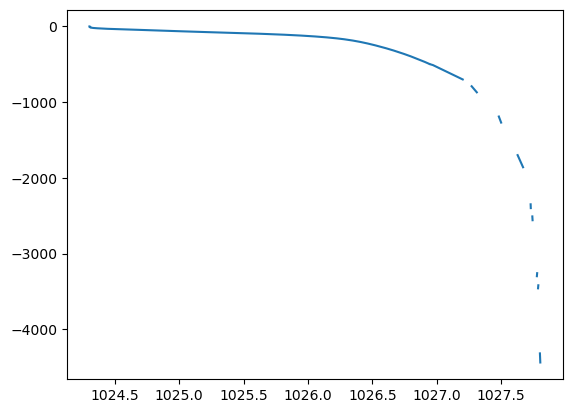

In [51]:
plt.plot(density_combined, -depth_combined)

In [ ]:
np.diff(density_combined)

In [53]:
# n2 = []; depth=[]
# g=9.81; rho0=1035
# for i in range(1,len(depth_1)):
#     if not np.isnan(density_1[i-1]) and not np.isnan(density_1[i]):
#         n2.append((g/rho0)*((density_1[i] - density_1[i-1])/(depth_1[i] - depth_1[i-1])))
#         depth.append(depth_1[i])
        
                  
# depth = np.array(depth)
# n2 = np.array(n2)     

In [54]:
n2 = []; depth=[]
g=9.81; rho0=1035
for i in range(1,len(depth_combined)):
    if not np.isnan(density_combined[i-1]) and not np.isnan(density_combined[i]):
        n2.append((g/rho0)*((density_combined[i] - density_combined[i-1])/(depth_combined[i] - depth_combined[i-1])))
        depth.append(depth_combined[i])
        
                  
depth = np.array(depth)
n2 = np.array(n2)

In [55]:
# Find the indices where the condition is true
indices = np.where((depth >= 495) & (depth <= 520))

# Use the indices to assign np.nan
n2[indices] = np.nan
notnan = ~np.isnan(n2)

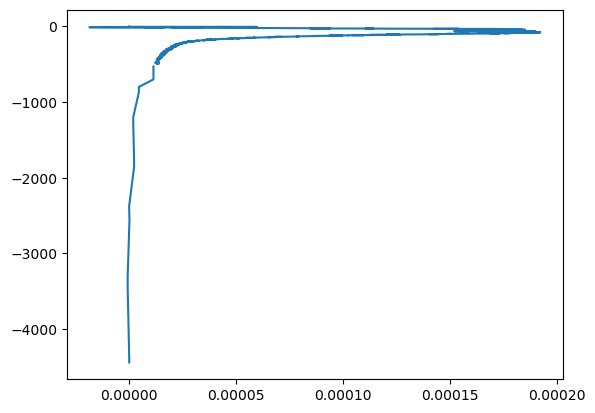

In [56]:
plt.plot(n2,-np.asarray(depth))

In [57]:
from scipy.interpolate import interp1d
interp_N2 = interp1d(depth[notnan], n2[notnan], kind='linear', bounds_error=False)

# Interpolated buoyancy frequency values at the original depth points
interp_N2_values = interp_N2(depth_combined)

In [72]:
N2 = interp_N2_values[12:-180]
Depth = np.asarray(depth_combined[12:-180]) ### I start by 12 because below 12 there are N2<0
f0 = coriolis_parameter(latitude) ## coriolis parameter

In [63]:
depth_combined.shape

(895,)

(-3000.0, -1.0)

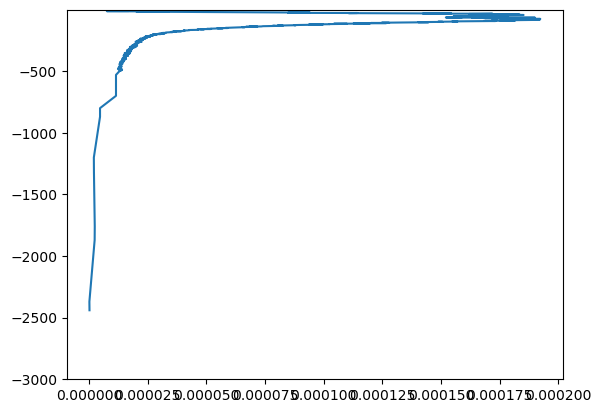

In [64]:
plt.plot(N2,-Depth)
plt.ylim([-3000,-1])

In [ ]:
N2

## convert the density to the baroclinic mode

In [73]:
w,vi = qgdecomp(Depth,N2,f0)

In [295]:
w,vi = qgdecomp(depth[12:-6],N2[12:-6],f0)

In [ ]:
w,vi = qgdecomp(depth[12:-20],n2[12:-20],f0)

In [ ]:
Depth

In [ ]:
vi[:, 0]

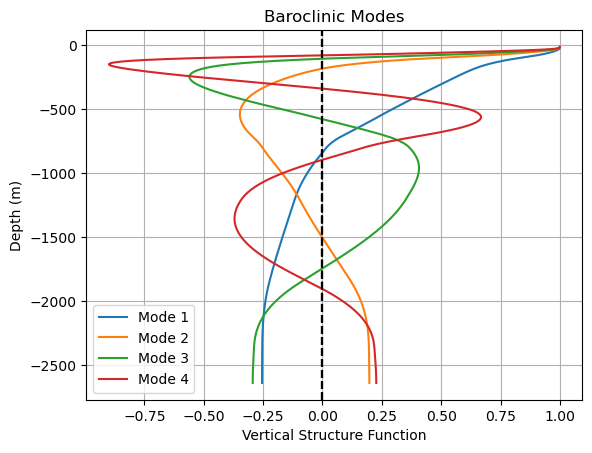

In [75]:
modes_to_plot = 4
dz=1

for i in range(1, modes_to_plot + 1):
    plt.plot(vi[:, i], -Depth, label=f'Mode {i}')
    # Highlight zero crossings
    zero_crossings = np.where(np.diff(np.sign(vi[:, i])))[0]
    # plt.scatter(zero_crossings * dz, np.zeros(len(zero_crossings)), color='red', zorder=5)
    plt.axvline(x=0, color='k', linestyle='--')
    # plt.xlim([-1,1])


plt.xlabel('Vertical Structure Function')
plt.ylabel('Depth (m)')
plt.title('Baroclinic Modes')
plt.legend()
plt.grid()

In [122]:
adcp_data = {
    'u': da_cleaned_v.values,
    'v': da_cleaned_v.values
}

In [121]:
da_cleaned_v.depth

<xarray.DataArray 'depth' (depth: 1045)>
array([-1.930849e+03, -1.929192e+03, -1.927534e+03, ..., -3.314763e+00,
       -1.657381e+00,  0.000000e+00])
Coordinates:
  * depth    (depth) float64 -1.931e+03 -1.929e+03 -1.928e+03 ... -1.657 0.0

In [102]:
baroclinic_modes = vi[:,:11]
# Interpolate the baroclinic modes to the ADCP depths
interpolated_modes = np.zeros((len(z), baroclinic_modes.shape[1]))

for i in range(baroclinic_modes.shape[1]):
    f_interp = interp1d(Depth, baroclinic_modes[:, i], kind='cubic', fill_value='extrapolate')
    interpolated_modes[:, i] = f_interp(-z)

In [87]:
interpolated_modes.shape

(2685, 11)

In [88]:
z

array([-4.44841137e+03, -4.44675399e+03, -4.44509661e+03, ...,
       -3.31476257e+00, -1.65738129e+00,  0.00000000e+00])

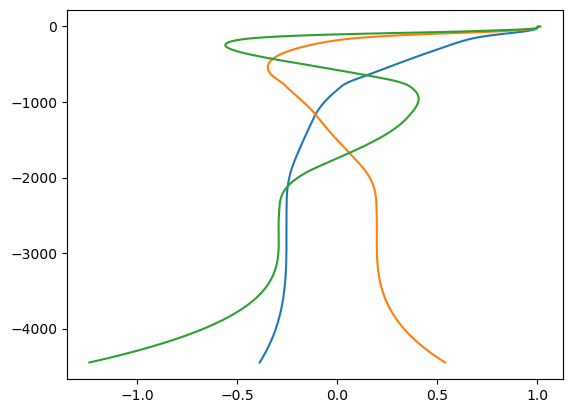

In [103]:
plt.plot(interpolated_modes[:,1:4],z)

In [132]:
# Interpolate ADCP data to match baroclinic mode depths
nt = da_cleaned_v.shape[1]
mode_depths = Depth
nz_mode = len(mode_depths)

u_interp = np.zeros((nz_mode, nt))
v_interp = np.zeros((nz_mode, nt))


for t in range(nt):
    u_interp[:, t] = interp1d(-da_cleaned_v.depth.values, adcp_data['u'][:, t], kind='linear', bounds_error=False, fill_value=np.nan)(mode_depths)
    v_interp[:, t] = interp1d(-da_cleaned_v.depth.values, adcp_data['v'][:, t], kind='linear', bounds_error=False, fill_value=np.nan)(mode_depths)


In [168]:
# Compute EKE
u_prime = u_interp - np.nanmean(u_interp, axis=1, keepdims=True)
v_prime = v_interp - np.nanmean(v_interp, axis=1, keepdims=True)
EKE = 0.5 * (u_prime**2 + v_prime**2)

/tmp/ipykernel_7279/1938711509.py:2: RuntimeWarning: Mean of empty slice
  u_prime = u_interp - np.nanmean(u_interp, axis=1, keepdims=True)
/tmp/ipykernel_7279/1938711509.py:3: RuntimeWarning: Mean of empty slice
  v_prime = v_interp - np.nanmean(v_interp, axis=1, keepdims=True)


In [130]:
da_cleaned_v.depth.values

array([-1.93084920e+03, -1.92919182e+03, -1.92753444e+03, ...,
       -3.31476257e+00, -1.65738129e+00,  0.00000000e+00])

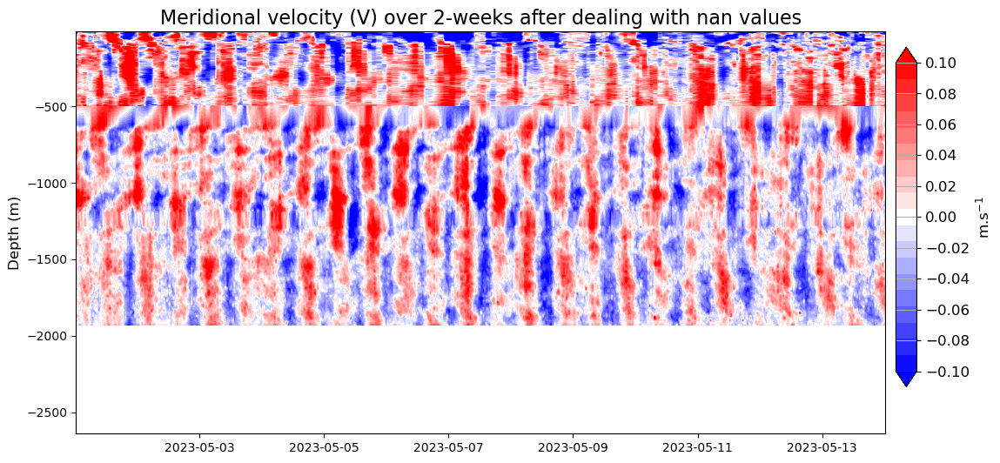

In [133]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(datetime_array[:-1],-Depth,u_interp, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
# plt.ylim([-2000,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks after dealing with nan values',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

In [134]:
notnan = ~np.isnan(u_interp[:,100])

In [228]:
alpha = np.linalg.lstsq(vi[notnan,0:632], EKE[notnan,:])[0]

/tmp/ipykernel_7279/566009903.py:1: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  alpha = np.linalg.lstsq(vi[notnan,0:632], EKE[notnan,:])[0]


In [233]:
alpha = np.linalg.solve(A, b)[0]

In [229]:
vi[notnan,0:632].shape

(632, 632)

In [330]:
from scipy.linalg import solve
A = vi[notnan,0:20]#np.random.random((3, 3))
b = u_interp[notnan,100]#np.random.random(3)
# rslt = solve(A, b)

In [323]:
cond_number = np.linalg.cond(A[:,0:50])
print("Condition number of A:", cond_number)


Condition number of A: 1546828.688570116


In [324]:
A1 = A[0:500:,0:100]  # 5 rows, 10 columns
A1_pinv = np.linalg.pinv(A1)

# Verify A @ A_pinv
identity1 = A1 @ A1_pinv
#print("A1 @ A1_pinv (should be close to identity matrix):\n", identity1)


In [ ]:
A[0:500,100]

In [326]:
np.linalg.det(A1)

LinAlgError: Last 2 dimensions of the array must be square

In [331]:
rank_A = np.linalg.matrix_rank(A)
print("Rank of matrix A:", rank_A)

Rank of matrix A: 20


In [333]:
np.linalg.pinv(A1)@A1  

array([[ 7.68592358e-01,  3.65452766e-01, -7.15641379e-02, ...,
        -1.00708008e-03,  6.10351562e-04, -2.13623047e-04],
       [ 3.65370750e-01,  3.69366169e-01,  2.65151799e-01, ...,
         1.83105469e-04, -1.83105469e-04,  1.22070312e-04],
       [-7.21826553e-02,  2.65419960e-01,  5.24346471e-01, ...,
         1.22070312e-04,  1.22070312e-04, -4.88281250e-04],
       ...,
       [-2.42143869e-07,  6.51925802e-08,  1.74157321e-07, ...,
         9.99999866e-01, -3.87430191e-07,  2.23517418e-08],
       [ 3.18977982e-08, -8.14907253e-09, -2.15368345e-08, ...,
        -1.67638063e-08,  1.00000007e+00,  1.86264515e-08],
       [-6.33008312e-10,  9.45874490e-11,  4.38376446e-10, ...,
         5.82076609e-10, -1.28056854e-09,  1.00000000e+00]])

In [334]:
x = np.linalg.pinv(A) @ b

In [290]:
# Condition number of A
cond_number = np.linalg.cond(A[:,:4])
print("Condition number of A:", cond_number)


Condition number of A: 9.28338901540154


In [ ]:
A@(x)

In [ ]:
b

In [281]:
import cvxpy

def solve(A, B):
    """
    Minimizes |AX - B|**2, assuming A and B are 
    square matrices for simplicity. If this optimized 
    error is zero, this corresponds to solving AX = B.
    """
    n = A.shape[0]
    X = cvxpy.Variable((n))
    # Set objective
    obj_fun = cvxpy.sum_squares(A*X - B)
    objective = cvxpy.Minimize(obj_fun)
    # Set constraints
    constraints = [X >= 0]
    prob = cvxpy.Problem(objective, constraints)
    result = prob.solve(solver = "ECOS")
    return X.value

rr=solve(A,b)

/home/tchonang/miniconda3/lib/python3.10/site-packages/cvxpy/expressions/expression.py:650: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3 times so far.

  warnings.warn(msg, UserWarning)
/home/tchonang/miniconda3/lib/python3.10/site-packages/cvxpy/reductions/solvers/solving_chain.py:354: FutureWarning: 
    You specified your problem should be solved by ECOS. Starting in
    CXVPY 1.6.0, ECOS will no longer be installed by default with CVXPY.
    Please either add an explicit dependency on ECOS or switch to our new
    default solver, Clarabel, by either not specifying a solver argument
    or specifying ``solver=cp.CLARABEL``.
    
  warnings.warn(ECOS_DEP_DEPRECATION_MSG, Fu

In [282]:
rr

In [ ]:
A1 = np.random.random((5, 10))  # 5 rows, 10 columns
A1_pinv = np.linalg.pinv(A1)

# Verify A @ A_pinv
identity1 = A1 @ A1_pinv
print("A1 @ A1_pinv (should be close to identity matrix):\n", identity1)


In [ ]:
A@ np.linalg.pinv(A)

In [ ]:
(A @ rslt)

In [ ]:
EKE[notnan,:]

In [236]:
aa = np.dot(np.linalg.inv(A), b) 

In [ ]:
A @ aa

In [ ]:
alpha[:,10]

In [210]:
U_reconstructed = vi[notnan,1:11] @ alpha


In [ ]:
U_reconstructed==EKE[notnan,:]

In [349]:
# Filter out rows with NaN values
notnan = ~np.isnan(EKE).any(axis=1)#~np.isnan(vi).any(axis=0) & ~np.isnan(EKE).any(axis=0)

# Ensure vi and EKE have no inf or NaN values
vi_filtered = vi[1:4, 1:4]  # Selecting columns 1 to 10 for vi
EKE_filtered = EKE[1:4, 100]  # Keeping all columns for EKE

# Solve the least-squares problem
alpha = np.linalg.lstsq(vi_filtered, EKE_filtered, rcond=None)[0]

In [352]:
EKE_filtered

array([1.39621362e-05, 2.85112731e-05, 4.72064778e-05])

In [350]:
alpha

array([-44617.06700373,  80493.88057118, -35876.81356466])

In [ ]:
# Define the matrix vi
vi = A[1:100,1:5]

# Define the EKE vector
EKE = b[1:100]

# Compute the least-squares solution
alpha, residuals, rank, s = np.linalg.lstsq(vi, EKE, rcond=None)

print("Computed alpha:", alpha)
print("Residuals:", residuals)
print("Rank of matrix vi:", rank)
print("Singular values of vi:", s)

# Verify the solution by computing vi @ alpha
EKE_reconstructed = np.dot(vi, alpha)
print("Reconstructed EKE:", EKE_reconstructed)

In [ ]:
vi

In [371]:
# Compute the least-squares solution
alpha, residuals, rank, s = np.linalg.lstsq(vi, EKE, rcond=None)

print("Computed alpha:", alpha)
print("Residuals:", residuals)
print("Rank of matrix vi:", rank)
print("Singular values of vi:", s)

# Verify the solution by computing vi @ alpha
EKE_reconstructed = np.dot(vi, alpha)
print("Reconstructed EKE:", EKE_reconstructed)

# Check how close the reconstructed EKE is to the original EKE
is_close = np.allclose(EKE, EKE_reconstructed, atol=1e-10)
print("Is the reconstructed EKE close to the original EKE?", is_close)
reconstruction_error = np.linalg.norm(EKE - EKE_reconstructed)
print("Reconstruction error:", reconstruction_error)

Computed alpha: [-48.78395229 115.44292487 -79.96795306  13.24640728]
Residuals: [0.05957677]
Rank of matrix vi: 4
Singular values of vi: [1.44984415e+01 5.26500100e+00 1.71061099e-01 1.07713606e-03]
Reconstructed EKE: [-0.06257121 -0.06256767 -0.06255776 -0.06253778 -0.06251524 -0.06248974
 -0.06244297 -0.06237343 -0.06228725 -0.06218093 -0.06204607 -0.06187661
 -0.06167218 -0.06145164 -0.06122157 -0.06092929 -0.06057596 -0.06017608
 -0.05970266 -0.0591349  -0.05850498 -0.05778657 -0.05695597 -0.05608832
 -0.05513356 -0.05407739 -0.05294874 -0.05174846 -0.05041598 -0.04897585
 -0.04746445 -0.04578909 -0.04403297 -0.04220394 -0.04025131 -0.03823526
 -0.03609745 -0.03376314 -0.03133076 -0.02885643 -0.02625718 -0.02348927
 -0.02068529 -0.01774764 -0.01467612 -0.01156045 -0.00830223 -0.00492787
 -0.00145277  0.00210361  0.00583336  0.00961968  0.01345489  0.01788896
  0.02256599  0.02708301  0.03176866  0.03660768  0.04158151  0.0466974
  0.05202558  0.05751962  0.06299175  0.06859046  0.

In [175]:
alpha.shape

(11, 4458)

<BarContainer object of 10 artists>

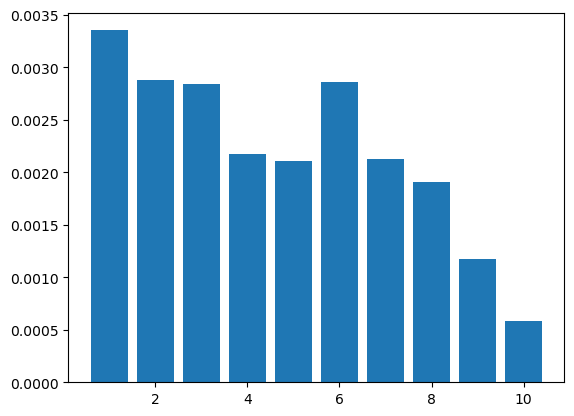

In [194]:
plt.bar(np.arange(1, alpha.shape[0]+1), abs(alpha[:, 2000]))
# plt.xlim([1,11])
    

<BarContainer object of 10 artists>

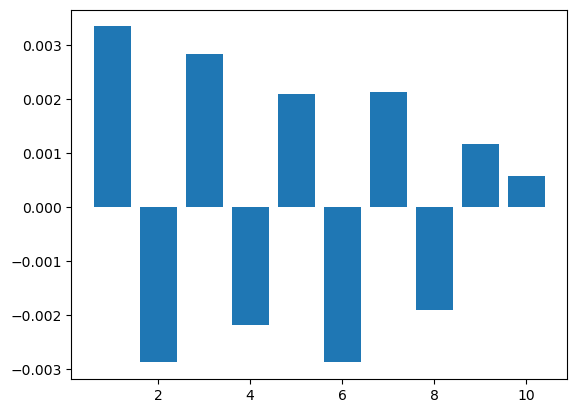

In [195]:
plt.bar(np.arange(1, alpha.shape[0]+1), (alpha[:, 2000]))

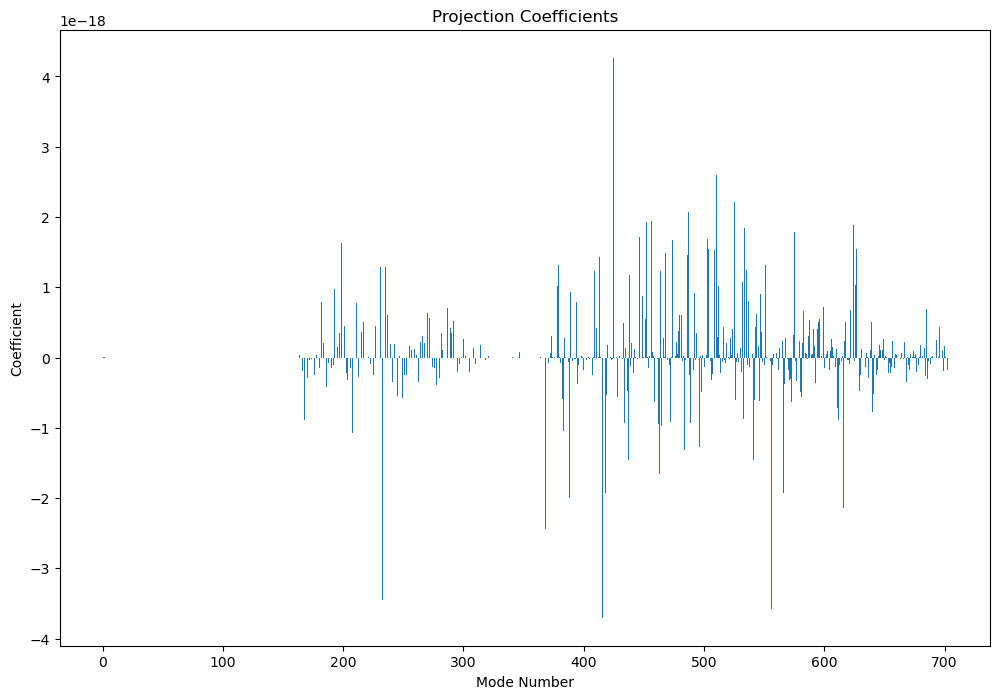

In [139]:
plt.figure(figsize=(12, 8))
plt.bar(range(len(alpha)), alpha)
plt.xlabel('Mode Number')
plt.ylabel('Coefficient')
plt.title('Projection Coefficients')
plt.show()

In [187]:
alpha


array([[-1.35983973e+08, -5.95829153e+07,  8.38706551e+07, ...,
         3.28393419e+08, -3.00912626e+08,  4.20441915e+07],
       [ 3.35254713e+08,  1.46893089e+08, -2.06756106e+08, ...,
        -8.09567847e+08,  7.41831652e+08, -1.03644135e+08],
       [-4.45149431e+08, -1.95036115e+08,  2.74473528e+08, ...,
         1.07477947e+09, -9.84884966e+08,  1.37583052e+08],
       ...,
       [ 1.93279609e-02,  8.15360621e-03, -2.42656842e-03, ...,
        -2.44047046e-02,  1.38133764e-02, -5.89605421e-04],
       [-3.81417572e-03, -1.59758329e-03,  2.26072967e-04, ...,
         4.95031476e-03, -2.23401189e-03,  1.02454796e-04],
       [ 6.61209226e-04,  1.68301165e-04, -1.46463513e-04, ...,
        -1.24365091e-03,  3.67492437e-04, -7.65807927e-05]])

In [120]:
# Compute EKE
u_prime = u_interp - np.nanmean(u_interp, axis=1, keepdims=True)
v_prime = v_interp - np.nanmean(v_interp, axis=1, keepdims=True)
EKE = 0.5 * (u_prime**2 + v_prime**2)

In [168]:
# Project observed currents onto baroclinic modes
projection_coeffs_u = np.dot(vi.T, u_prime)
projection_coeffs_v = np.dot(vi.T, v_prime)

# Compute energy for each mode
mode_energies = np.zeros((nz_mode, nt))

for i in range(nz_mode):
    mode_energies[i, :] = 0.5 * (projection_coeffs_u[i, :]**2 + projection_coeffs_v[i, :]**2)
# Compute average energy for each mode over time
average_mode_energies = np.nansum(mode_energies, axis=1)#np.nanmean(mode_energies, axis=1)

In [169]:
projection_coeffs_u.shape

(483, 4459)

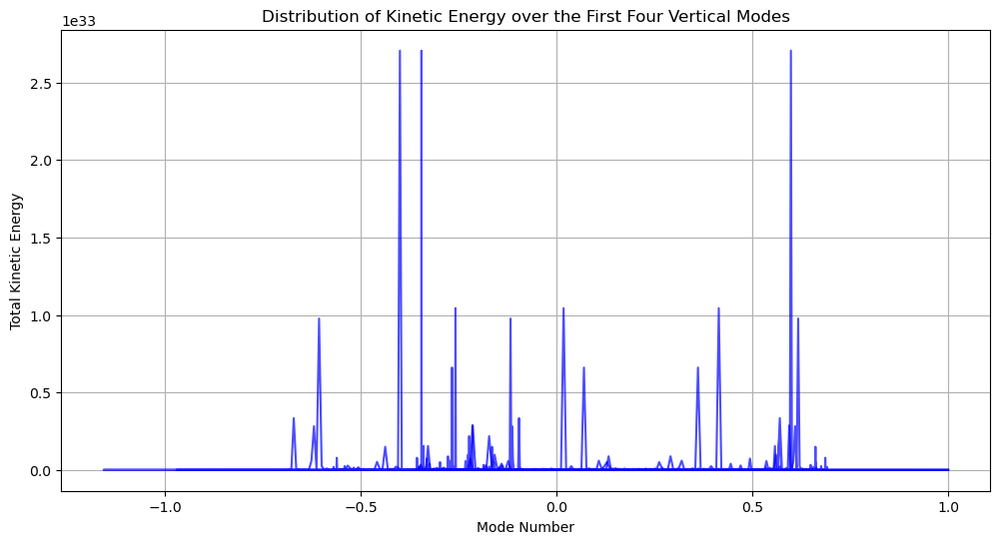

In [170]:
# Plot the distribution of kinetic energy over the first four vertical modes
plt.figure(figsize=(12, 6))
plt.plot(vi[:,1:4], average_mode_energies[:], color='blue', alpha=0.7)
plt.xlabel('Mode Number')
plt.ylabel('Total Kinetic Energy')
plt.title('Distribution of Kinetic Energy over the First Four Vertical Modes')
plt.grid()
plt.show()

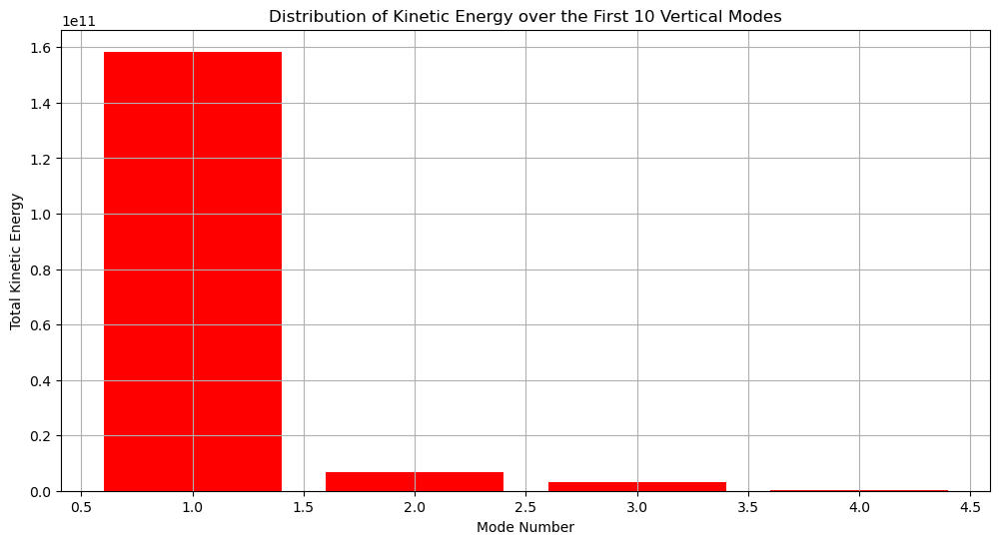

In [186]:
first_four_modes = average_mode_energies[:4]
modes = np.arange(1, 5)
# Plot the distribution of kinetic energy over the first four vertical modes
plt.figure(figsize=(12, 6))
plt.bar(modes, first_four_modes, color='r', alpha=1)
plt.xlabel('Mode Number')
plt.ylabel('Total Kinetic Energy')
plt.title('Distribution of Kinetic Energy over the First 10 Vertical Modes')
plt.grid()
plt.show()

In [179]:
# Compute total kinetic energy for each mode over all time steps
total_mode_energies = np.nansum(mode_energies, axis=1)

# Normalize the total kinetic energy for each mode
normalized_mode_energies = total_mode_energies / np.sum(total_mode_energies)

# Ensure the sum of the normalized energies is 1
assert np.isclose(np.sum(normalized_mode_energies), 1), "Normalization failed, total energy does not sum up to 1."


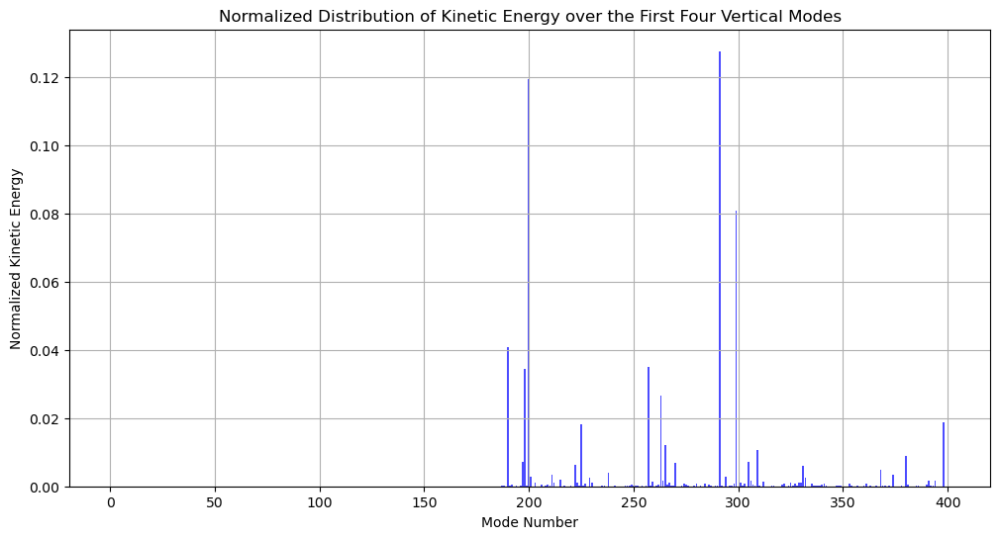

In [184]:
# Select the first four modes
first_four_modes = normalized_mode_energies[:400]
modes = np.arange(1, 401)

# Plot the distribution of kinetic energy over the first four vertical modes
plt.figure(figsize=(12, 6))
plt.bar(modes, first_four_modes, color='blue', alpha=0.7)
plt.xlabel('Mode Number')
plt.ylabel('Normalized Kinetic Energy')
plt.title('Normalized Distribution of Kinetic Energy over the First Four Vertical Modes')
plt.grid()
plt.show()

In [181]:
np.sum(normalized_mode_energies)

1.0

In [174]:
np.sum(average_mode_energies)

8.17467961728343e+33

In [176]:
normalized_mode_energies = average_mode_energies / np.sum(average_mode_energies)

In [193]:
S2

<xarray.Dataset>
Dimensions:                        (TIME: 33970165, LATITUDE: 1, LONGITUDE: 1,
                                    TIME_MIDPROFILE: 8499,
                                    PRESSURE_MIDPROFILE: 1, RANGES: 2,
                                    RHO_TIMEMEAN_DEPTH: 501,
                                    TIME_STERIC_HEIGHT: 8499, SCALAR: 1)
Coordinates:
  * TIME                           (TIME) datetime64[ns] 2023-03-03T01:18:59 ...
  * LATITUDE                       (LATITUDE) float64 35.92
  * LONGITUDE                      (LONGITUDE) float64 -125.0
    DEPTH                          (TIME) float64 ...
  * PRESSURE_MIDPROFILE            (PRESSURE_MIDPROFILE) float64 247.5
  * TIME_MIDPROFILE                (TIME_MIDPROFILE) datetime64[ns] 2023-03-0...
  * RHO_TIMEMEAN_DEPTH             (RHO_TIMEMEAN_DEPTH) float64 0.0 ... 500.0
  * TIME_STERIC_HEIGHT             (TIME_STERIC_HEIGHT) float64 2.672e+04 ......
Dimensions without coordinates: RANGES, SCALAR
Data variables: (12/23)
    CNDC                           (TIME) float64 ...
    TEMP                           (TIME) float64 ...
    PRES                           (TIME) float64 ...
    PSAL                           (TIME) float64 ...
    PROF_NUM                       (TIME) float64 ...
    STERIC_HEIGHT_ABOVE500         (TIME_MIDPROFILE) float64 ...
    ...                             ...
    LONGITUDE_GPSSB_STERIC_HEIGHT  (TIME_STERIC_HEIGHT) float64 ...
    PROF_GOOD_REALIZATIONS         (TIME_STERIC_HEIGHT) float64 ...
    STERIC_HEIGHT_CUTOFF_DEPTH     (SCALAR) float64 ...
    STERIC_HEIGHT_MIN_PROF_DEPTH   (TIME_STERIC_HEIGHT) float64 ...
    STERIC_HEIGHT_MAX_PROF_DEPTH   (TIME_STERIC_HEIGHT) float64 ...
    RHO_0                          (SCALAR) float64 ...
Attributes: (12/30)
    title:                         CTD Data from Profiler on Mooring S2 Durin...
    summary:                       In February 2023, a number of moorings wer...
    keywords:                      SEA SURFACE HEIGHT, MOORINGS, CTD
    keywords_vocabulary:           NASA Global Change Master Directory (GCMD)...
    creator_name:                  Jeff Sevadjian
    date_created:                  2023-10-17
    ...                            ...
    geospatial_vertical_min:       3.7183241301521126
    geospatial_vertical_max:       500.85036798171865
    geospatial_vertical_positive:  down
    geospatial_vertical_units:     meter
    time_coverage_start:           2023-03-03T01:18:59Z
    time_coverage_end:             2023-09-15T15:23:41Z

In [639]:
# mask = ds['qc_flag'] == 0
Depth_s1 = S1['DEPTH'].where(S1['QC_FLAG'] == 0)
Density_s1 = S1['RHO'].where(S1['QC_FLAG'] == 0)

Depth_s2 = S2['DEPTH'].where(S2['QC_FLAG'] == 0)
Density_s2 = S2['RHO'].where(S2['QC_FLAG'] == 0)

Depth_s3 = S3['DEPTH'].where(S3['QC_FLAG'] == 0)
Density_s3 = S3['RHO'].where(S3['QC_FLAG'] == 0)

Depth_s4 = S4['DEPTH'].where(S4['QC_FLAG'] == 0)
Density_s4 = S4['RHO'].where(S4['QC_FLAG'] == 0)


In [ ]:
RHO_0 = 1029

# Define a cutoff depth for data
CUTOFF_DEPTH = [445, 470, 475, 425, 425, 475, 475, 500, 500, 500, 500]

# Calculate the mean density profile from S1-4 and use it as a reference
dz_meanprof = 1
Z_meanprof = 500

RHO_TIMEMEAN_DEPTH = np.arange(0, Z_meanprof + dz_meanprof, dz_meanprof)
RHO_TIMEMEAN_OB = np.full_like(np.zeros(len(RHO_TIMEMEAN_DEPTH)), np.nan)

RHO_TIMEMEAN_OB.shape

for zi in range(1,501,1):
    # Calculate the mean density at the current depth level
    RHO_TIMEMEAN_OB[zi] = np.nanmean(np.concatenate((
        S1.RHO[(S1.QC_FLAG == 0) & (S1.DEPTH > RHO_TIMEMEAN_DEPTH[zi] - dz_meanprof/2) & (S1.DEPTH < RHO_TIMEMEAN_DEPTH[zi] + dz_meanprof/2)],
        S2.RHO[(S2.QC_FLAG == 0) & (S2.DEPTH > RHO_TIMEMEAN_DEPTH[zi] - dz_meanprof/2) & (S2.DEPTH < RHO_TIMEMEAN_DEPTH[zi] + dz_meanprof/2)],
        S3.RHO[(S3.QC_FLAG == 0) & (S3.DEPTH > RHO_TIMEMEAN_DEPTH[zi] - dz_meanprof/2) & (S3.DEPTH < RHO_TIMEMEAN_DEPTH[zi] + dz_meanprof/2)],
        S4.RHO[(S4.QC_FLAG == 0) & (S4.DEPTH > RHO_TIMEMEAN_DEPTH[zi] - dz_meanprof/2) & (S4.DEPTH < RHO_TIMEMEAN_DEPTH[zi] + dz_meanprof/2)]
    )))

/tmp/ipykernel_3159/1180616582.py:17: RuntimeWarning: Mean of empty slice
  RHO_TIMEMEAN_OB[zi] = np.nanmean(np.concatenate((
/tmp/ipykernel_3159/1180616582.py:17: RuntimeWarning: Mean of empty slice
  RHO_TIMEMEAN_OB[zi] = np.nanmean(np.concatenate((


In [ ]:
diff(RHO_TIMEMEAN_OB[10:])

In [ ]:

# Initialize lists to store mean densities and depths
mean_densities = []
common_depths = []

# Compute the weighted mean density at each unique depth
for depth in unique_depths:
    densities = []
    
    if depth in Depth_s1:
        densities.append(Density_s1[Density_s1['DEPTH'] == depth].values[0])
    if depth in Depth_s2:
        densities.append(Density_s2[Density_s2['DEPTH'] == depth].values[0])
    if depth in Depth_s3:
        densities.append(Density_s3[Density_s3['DEPTH'] == depth].values[0])
    if depth in Depth_s4:
        densities.append(Density_s4[Density_s4['DEPTH'] == depth].values[0])
    
    mean_density = np.mean(densities)
    mean_densities.append(mean_density)
    common_depths.append(depth)

# Create a DataFrame for the mean density profile
mean_density_profile = pd.DataFrame({
    'Depth': common_depths,
    'Mean_Density': mean_densities
})

In [648]:
def compute_weighted_mean(desired_depths, depths, densities):
    """Compute weighted mean density at desired depths."""
    mean_densities = []
    for depth in desired_depths:
        # Find all densities within a small range around the desired depth
        weights = 1.0 / np.abs(depths - depth)  # Inverse distance weights
        close_indices = np.abs(depths - depth) < 1  # Consider data points within 1 meter
        if np.sum(close_indices) > 0:
            weighted_mean = np.average(densities[close_indices], weights=weights[close_indices])
            mean_densities.append(weighted_mean)
        else:
            mean_densities.append(np.nan)
    return mean_densities

In [649]:
desired_depths = np.arange(0, 501, 1)

In [ ]:
compute_weighted_mean(desired_depths, Depth_s1, Density_s1)

In [191]:
path_fixed = '/mnt/flow/swot/Analysis_Luke/Moorings2/DATA/FIXED/'
path_prof = '/mnt/flow/swot/Analysis_Luke/Moorings2/DATA/PROF/'

nc_f = xr.open_dataset(path_fixed+'SWOTPOSTLAUNCH_L2_JPLQC_MOORING-S1_CTD-FIXED_START20230303_END20230917_DM_VER01.nc')
nc_p = xr.open_dataset(path_prof+'SWOTPOSTLAUNCH_L2_JPLQC_MOORING-P1_CTD-PROFILER-BOTH_START20230218_END20230918_DM_VER01_5s4s_alltimes.nc')

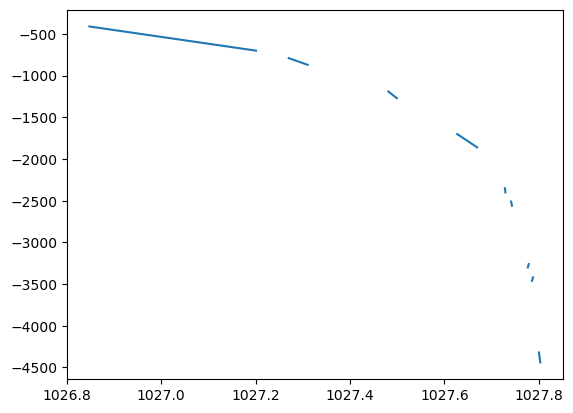

In [192]:
plt.plot( nc_f.RHO_TIMEMEAN, -nc_f.RHO_TIMEMEAN_DEPTH,)

In [190]:
nc_f

<xarray.Dataset>
Dimensions:             (TIME: 56966, DEPTH_NOMINAL: 7, LATITUDE: 1,
                         LONGITUDE: 1)
Coordinates:
  * TIME                (TIME) datetime64[ns] 2023-03-03T22:50:01.000003584 ....
  * DEPTH_NOMINAL       (DEPTH_NOMINAL) float64 605.0 804.0 ... 4.427e+03
  * LATITUDE            (LATITUDE) float64 36.19
  * LONGITUDE           (LONGITUDE) float64 -125.1
    DEPTH               (DEPTH_NOMINAL, TIME) float32 ...
Data variables: (12/13)
    INSTR_INFO          int8 ...
    INSTR_MAKE          |S19 ...
    INSTR_MODEL         (DEPTH_NOMINAL) |S9 ...
    INSTR_SN            (DEPTH_NOMINAL) int16 ...
    INSTR_HAS_P_SENSOR  (DEPTH_NOMINAL) int8 ...
    TEMP                (DEPTH_NOMINAL, TIME) float32 ...
    ...                  ...
    CNDC                (DEPTH_NOMINAL, TIME) float32 ...
    PRES                (DEPTH_NOMINAL, TIME) float32 ...
    TEMP_QC             (DEPTH_NOMINAL, TIME) int8 ...
    PSAL_QC             (DEPTH_NOMINAL, TIME) int8 ...
    CNDC_QC             (DEPTH_NOMINAL, TIME) int8 ...
    PRES_QC             (DEPTH_NOMINAL, TIME) int8 ...
Attributes: (12/23)
    title:                         Data from Fixed-Depth Instruments on Moori...
    summary:                       From February/March to September 2023, an ...
    creator_name:                  Matthias Lankhorst
    date_created:                  10-Oct-2023
    contributor_name:              Matthias Lankhorst; Jeff Sevadjian; Andrew...
    contributor_role:              project scientist; data manager; principal...
    ...                            ...
    geospatial_vertical_min:       605.0
    geospatial_vertical_max:       4427.0
    geospatial_vertical_positive:  down
    geospatial_vertical_units:     m
    time_coverage_start:           20230303T225001Z
    time_coverage_end:             20230917T175501Z

In [606]:
rho = nc_p.RHO_TIMEMEAN.values
rho_depth = nc_p.RHO_TIMEMEAN_DEPTH.values

In [ ]:
np.diff(rho)

In [608]:
n2 = []; depth=[]
g=9.81; rho0=1035
for i in range(1,len(rho_depth)):
    if not np.isnan(rho_depth[i-1]) and not np.isnan(rho_depth[i]):
        n2.append((g/rho0)*((rho[i] - rho[i-1])/(rho_depth[i] - rho_depth[i-1])))
        depth.append(rho_depth[i])
        
                  
depth = np.array(depth)
n2 = np.array(n2)        

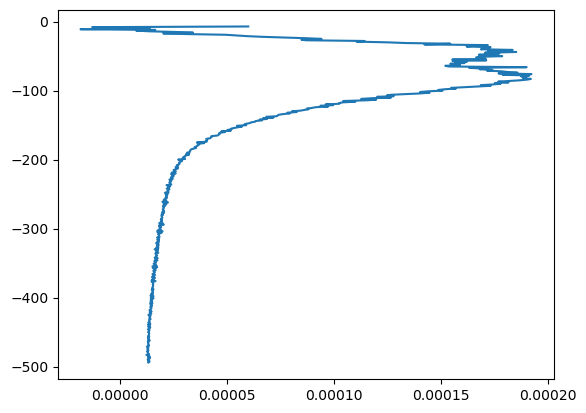

In [620]:
plt.plot(n2[6:-6], -depth[6:-6])

In [ ]:
n2

### read the aviso

In [507]:
nc

<xarray.Dataset>
Dimensions:    (time: 94, latitude: 56, longitude: 80)
Coordinates:
  * latitude   (latitude) float32 28.12 28.38 28.62 28.88 ... 41.38 41.62 41.88
  * longitude  (longitude) float32 -134.9 -134.6 -134.4 ... -115.6 -115.4 -115.1
  * time       (time) datetime64[ns] 2023-04-01 2023-04-02 ... 2023-07-03
Data variables:
    adt        (time, latitude, longitude) float32 ...
    err_sla    (time, latitude, longitude) float32 ...
    err_ugosa  (time, latitude, longitude) float32 ...
    err_vgosa  (time, latitude, longitude) float32 ...
    flag_ice   (time, latitude, longitude) float32 ...
    sla        (time, latitude, longitude) float32 ...
    ugos       (time, latitude, longitude) float32 ...
    ugosa      (time, latitude, longitude) float32 ...
    vgos       (time, latitude, longitude) float32 ...
    vgosa      (time, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             NRT merged all satellites Global Ocean Gridded SSALTO/...
    institution:       CLS, CNES
    source:            Altimetry measurements
    history:           2023-11-24 00:53:07Z: Creation
    contact:           servicedesk.cmems@mercator-ocean.eu
    references:        http://marine.copernicus.eu
    comment:           Sea Surface Height measured by Altimetry and derived v...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  SEALEVEL_GLO_PHY_L4_NRT_008_046
    subset:datasetId:  cmems_obs-sl_glo_phy-ssh_nrt_allsat-l4-duacs-0.25deg_P...
    subset:date:       2024-04-01T20:59:49.254Z

In [508]:
lon_s2 = -125.044
lat_s2 = 35.917
nc_interp = nc.interp(longitude=lon_s2, latitude=lat_s2, method='linear')

interp_u_aviso = filt_u.interp(time=nc.time, method='linear')

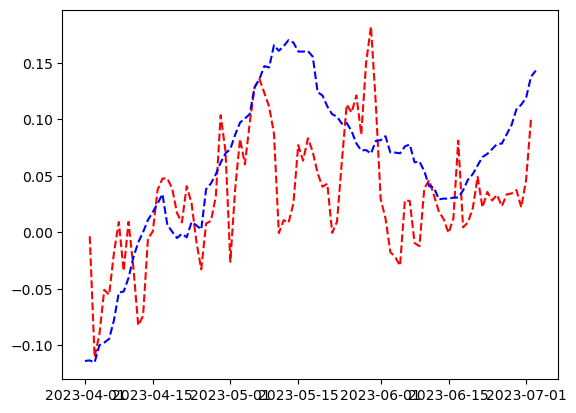

In [509]:
plt.plot(nc.time, interp_u_aviso[-10,:],'--r')
plt.plot(nc.time, nc_interp.ugosa,'--b')

In [510]:
indz = np.where(z>-500)[0]

In [511]:
indz.shape

(302,)

In [512]:
np.nanmean(nc_interp.ugosa)

0.058462332475297106

/tmp/ipykernel_3159/796156319.py:1: RuntimeWarning: Mean of empty slice
  plt.plot(nc.time, np.nanmean(interp_u_aviso[indz,:],0),'--r')


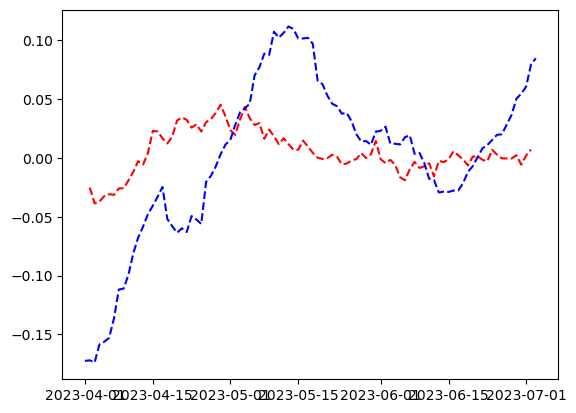

In [513]:
plt.plot(nc.time, np.nanmean(interp_u_aviso[indz,:],0),'--r')
plt.plot(nc.time, nc_interp.ugosa-np.nanmean(nc_interp.ugosa),'--b')

In [ ]:
plt.plot(nc.time, (interp_u_aviso[indz,:]),'--r')
plt.plot(nc.time, nc_interp.ugosa-np.nanmean(nc_interp.ugosa),'--b')

In [515]:
daily_average = da_u.resample(time="1D").mean().interp(time=nc.time)

/tmp/ipykernel_3159/1848533090.py:3: RuntimeWarning: Mean of empty slice
  plt.plot(daily_average.time,np.nanmean(daily_average[indz,:],0),'r', label='ACDP 0-500m averaged')


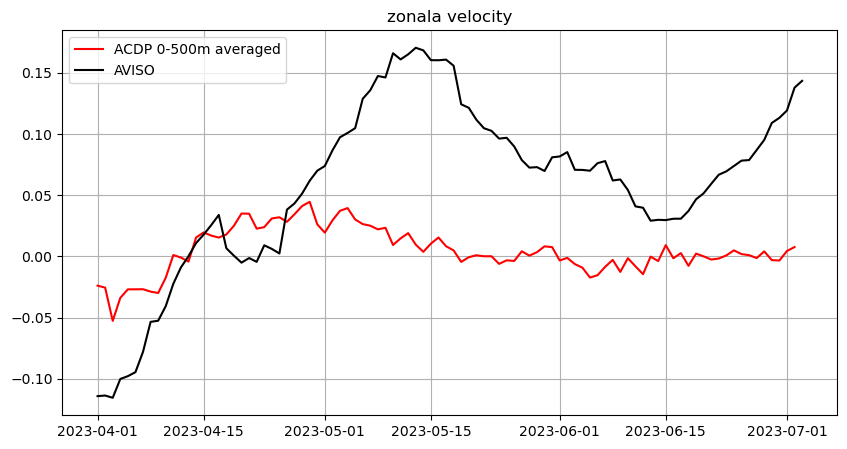

In [516]:
plt.figure(figsize=(10, 5))

plt.plot(daily_average.time,np.nanmean(daily_average[indz,:],0),'r', label='ACDP 0-500m averaged')
# plt.plot(nc.time, np.nanmean(interp_u_aviso[indz,:],0),'--r')
plt.plot(nc.time, nc_interp.ugosa,'k', label='AVISO')#-np.nanmean(nc_interp.ugosa),'--b')
plt.title('zonala velocity')
plt.legend()
plt.grid(True)


In [517]:
z[-20]

-31.490244431263818

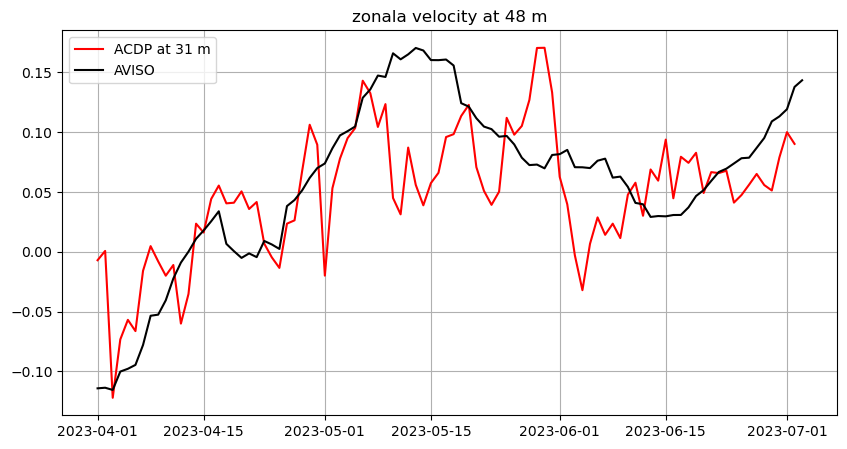

In [518]:
plt.figure(figsize=(10, 5))

plt.plot(daily_average.time,(daily_average[-20,:]),'r', label='ACDP at 31 m')
# plt.plot(daily_average.time,(interp_u_aviso[-20,:]),'b', label='ACDP at 31 m')
# plt.plot(nc.time, np.nanmean(interp_u_aviso[indz,:],0),'--r')
plt.plot(nc.time, nc_interp.ugosa,'k', label='AVISO')#-np.nanmean(nc_interp.ugosa),'--b')
plt.title('zonala velocity at 48 m')
plt.legend()
plt.grid(True)

In [346]:
nc_interp

<xarray.Dataset>
Dimensions:    (time: 94)
Coordinates:
  * time       (time) datetime64[ns] 2023-04-01 2023-04-02 ... 2023-07-03
    longitude  float64 -125.0
    latitude   float64 35.92
Data variables:
    adt        (time) float64 0.5291 0.5305 0.5315 ... 0.5211 0.5192 0.5193
    err_sla    (time) float64 0.01293 0.01321 0.01358 ... 0.01271 0.01289
    err_ugosa  (time) float64 0.03328 0.03408 0.03509 ... 0.03274 0.03302
    err_vgosa  (time) float64 0.0435 0.04424 0.04514 ... 0.04455 0.04483 0.04325
    flag_ice   (time) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    sla        (time) float64 0.003882 0.005258 0.006291 ... -0.005998 -0.005873
    ugos       (time) float64 -0.07004 -0.06948 -0.07137 ... 0.1819 0.1874
    ugosa      (time) float64 -0.1141 -0.1136 -0.1154 ... 0.1192 0.1378 0.1434
    vgos       (time) float64 0.06569 0.05032 0.03979 ... 0.0274 0.008168
    vgosa      (time) float64 0.1073 0.0919 0.08137 ... 0.06758 0.06896 0.04975
Attributes:
    Conventions:       CF-1.11
    title:             NRT merged all satellites Global Ocean Gridded SSALTO/...
    institution:       CLS, CNES
    source:            Altimetry measurements
    history:           2023-11-24 00:53:07Z: Creation
    contact:           servicedesk.cmems@mercator-ocean.eu
    references:        http://marine.copernicus.eu
    comment:           Sea Surface Height measured by Altimetry and derived v...
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  SEALEVEL_GLO_PHY_L4_NRT_008_046
    subset:datasetId:  cmems_obs-sl_glo_phy-ssh_nrt_allsat-l4-duacs-0.25deg_P...
    subset:date:       2024-04-01T20:59:49.254Z

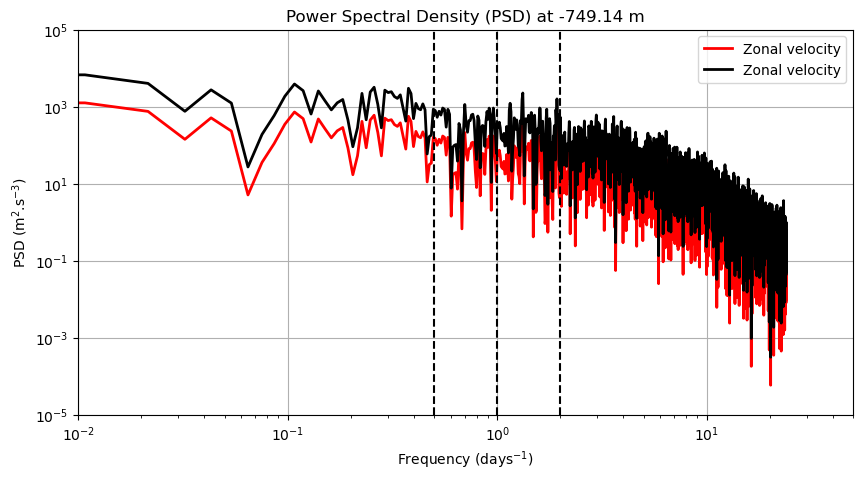

In [263]:
# Plotting the Power Spectral Density
lw=2
ymin, ymax = 1E-5, 1E5
xmin, xmax = 1E-2, 50
plt.figure(figsize=(10, 5))
plt.loglog(omega*24, shps[-1,:],color='r', lw = lw, label='Zonal velocity')
plt.loglog(frequencies_u*3600*24, power_u,color='k', lw = lw, label='Zonal velocity')
# plt.loglog(frequencies_v*3600*24, power_v,color='b', lw = lw, label='Meridional velocity')
plt.xlim([xmin,xmax])
plt.ylim([ymin,ymax])
# Add vertical lines at 12h and 24h frequencies
plt.axvline(x=2, color='k', linestyle='--')
plt.axvline(x=1, color='k', linestyle='--')
plt.axvline(x=0.5, color='k', linestyle='--')
dp = z[idz]
plt.title(f"Power Spectral Density (PSD) at {dp:.2f} m")
plt.xlabel('Frequency (days$^{-1}$)')
plt.ylabel(r'PSD (m$^2$.s$^{-3}$)',fontsize=fs+10)#('PSD (V^2/Hz)')
plt.grid(True)
plt.legend()
plt.show()

In [225]:
(shps.freq_time*60*60*24).max()

<xarray.DataArray 'freq_time' ()>
array(23.98923284)

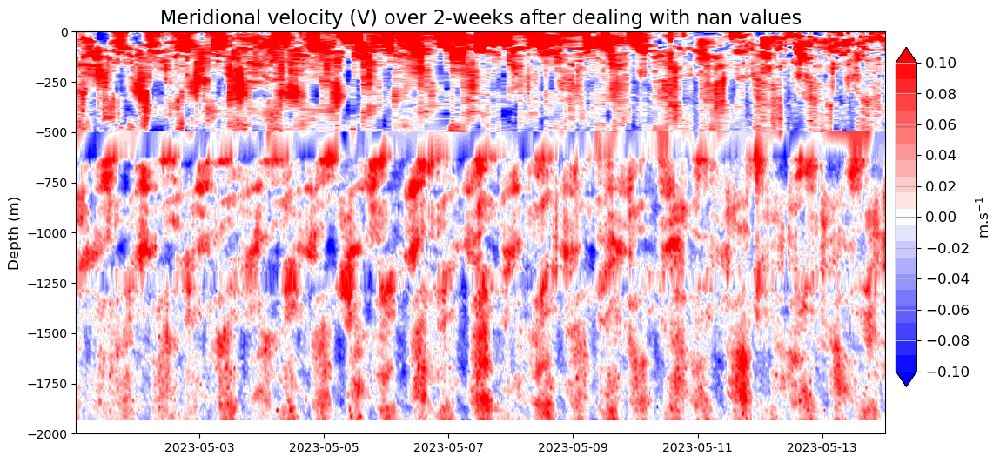

In [187]:
tick = [-0.1,-0.08,-0.06,-0.04,-0.02,0,0.02,0.04,0.06,0.08,0.1]
fs = 12
fig = plt.figure(figsize=(12, 6))
ct1 = plt.contourf(da_cleaned.time,da_cleaned.depth,da_cleaned.data, levels = np.linspace(-0.1,0.1,20), cmap='bwr',extend='both')
plt.ylim([-2000,0])
plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])
plt.title('Meridional velocity (V) over 2-weeks after dealing with nan values',fontsize=fs+4)
# plt.xlabel('Frequency (days)')
plt.ylabel('Depth (m)',fontsize=fs)
cb_ax = fig.add_axes([0.91, 0.2, 0.02, 0.65])
cb = fig.colorbar(ct1, cax=cb_ax, ticks = tick,
                    extend = 'both')
cb.ax.tick_params(labelsize=fs)
#cbar.ax.set_title(cb,fontsize=sc_font)
cb.set_label('m.s$^{-1}$',fontsize=fs)
plt.grid(True)
plt.show()

In [179]:
z.shape

(2685,)

In [180]:
da_cleaned.depth.shape

(1079,)

In [181]:
a= np.where((da_cleaned.depth.values >= -550) &(da_cleaned.depth.values <= -549.5))[0][0]
print('the index is ', idz)
print('the depth is ', z[idz])

IndexError: index 0 is out of bounds for axis 0 with size 0

In [186]:
da_cleaned.depth.values[0]

-1930.8491980222202

In [87]:
# # Sampling frequency in Hz (2 samples per hour, every 30 minutes)
# fs = 2
# # Convert 48 hours period to frequency
# fc = 1 / 48  # cutoff frequency in cycles per hour

# # Calculate normalized cutoff frequency (fs/2 = 1 for 30-minute sampling)
# Wn = 2 * fc / fs

# # Design Butterworth filter
# b, a = butter(N=4, Wn=Wn, btype='low', analog=False)

# # Apply the filter
# filtered_data = filtfilt(b, a, interp_u_values[:,:-1], axis=1)
data_filt = filter_butter(interp_u_values[:,:-1],fc,fs, btype='low',filter_order=4,axis=1)


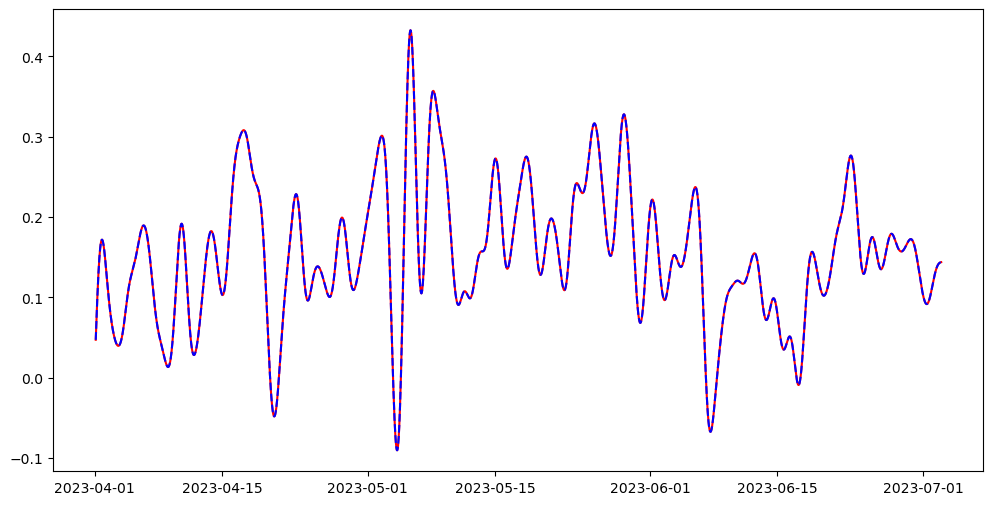

In [88]:
plt.figure(figsize=(12, 6))
# plt.plot(datetime_array[:-1], filtered_data[-1,:],'r')
plt.plot(datetime_array[:-1], data_filt[-1,:],'--b')
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-07 00:25:25')])

In [ ]:
plt.figure(figsize=(12, 6))
# plt.plot(time, u[-1,:],'r')
plt.plot(time, velocity[-100,:],'b')
plt.plot(datetime_array[:-1], data_filt[-1,:],'r')


In [99]:
time

<module 'time' (built-in)>

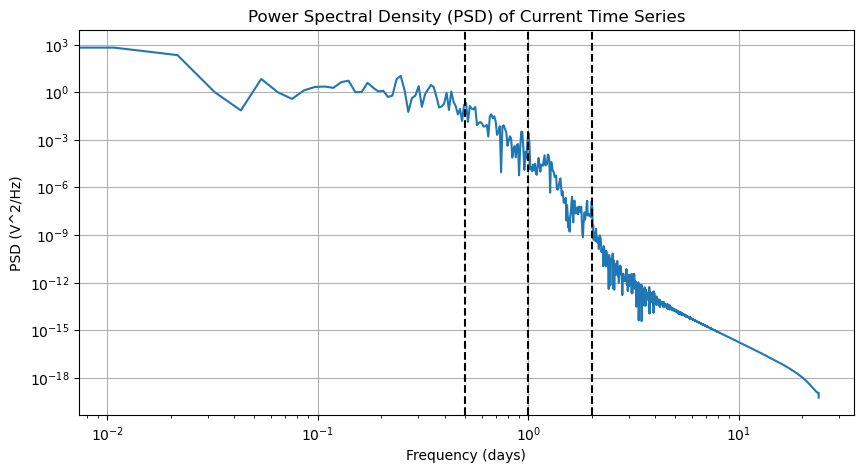

In [93]:
from scipy.signal import welch
# Compute the Power Spectral Density
fs = 1 / (30 * 60)  # Sampling frequency in Hz (1 sample per 1800 seconds)
npt=len(datetime_array[:-1])
noverlap = int(npt/2)  # Overlap between segments
frequencies, power = welch(data_filt[-500,:-1],window = 'hann',nfft = npt,
                                                             fs=fs,

                                                             nperseg=npt,
                                                             scaling='density',
                                                             noverlap=noverlap)#, nperseg=256)

# Plotting the Power Spectral Density
plt.figure(figsize=(10, 5))
plt.loglog(frequencies*3600*24, power)
# Add vertical lines at 12h and 24h frequencies
plt.axvline(x=2, color='k', linestyle='--')
plt.axvline(x=1, color='k', linestyle='--')
plt.axvline(x=0.5, color='k', linestyle='--')

plt.title('Power Spectral Density (PSD) of Current Time Series')
plt.xlabel('Frequency (days)')
plt.ylabel('PSD (V^2/Hz)')
plt.grid(True)
plt.show()

In [ ]:
plt.figure(figsize=(12, 6))
plt.contourf(datetime_array[:-1],z,data_filt, levels = np.linspace(-0.05,0.05,20), cmap='bwr',extend='both')
plt.ylim([-2000,0])
# plt.xlim([pd.Timestamp('2023-05-01 00:25:25'), pd.Timestamp('2023-05-14 00:25:25')])

In [94]:
z[-500]

-827.0332616421356

Min scale: 1.6983808882907132 Max scale: 4.716666666666667
Scales: [1.69838089 1.71599455 1.73379087 1.75177176 1.76993913 1.7882949
 1.80684105 1.82557953 1.84451234 1.86364151 1.88296906 1.90249705
 1.92222757 1.94216271 1.96230459 1.98265536 2.00321719 2.02399226
 2.04498278 2.066191   2.08761916 2.10926955 2.13114447 2.15324626
 2.17557726 2.19813985 2.22093643 2.24396944 2.26724131 2.29075454
 2.31451161 2.33851507 2.36276747 2.38727138 2.41202942 2.43704422
 2.46231844 2.48785478 2.51365596 2.53972471 2.56606382 2.59267609
 2.61956435 2.64673147 2.67418033 2.70191386 2.72993501 2.75824676
 2.78685213 2.81575416 2.84495594 2.87446055 2.90427116 2.93439093
 2.96482306 2.9955708  3.02663743 3.05802624 3.08974057 3.12178382
 3.15415938 3.1868707  3.21992126 3.25331459 3.28705424 3.32114379
 3.35558688 3.39038718 3.42554838 3.46107424 3.49696853 3.53323508
 3.56987773 3.60690041 3.64430704 3.68210161 3.72028814 3.7588707
 3.7978534  3.83724037 3.87703583 3.91724399 3.95786915 3.998915

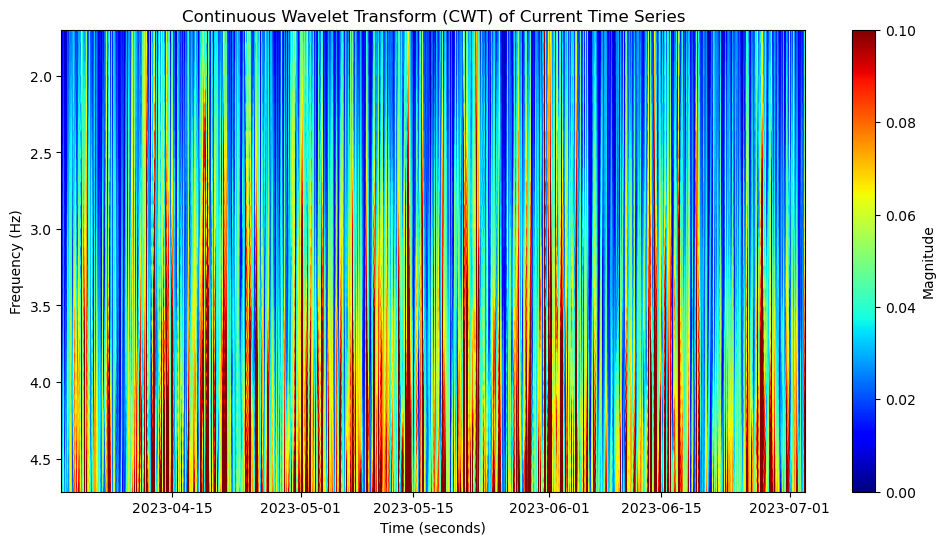

In [163]:
import pywt
# Sample data preparation (replace with your actual data)
# Assuming interp_u_values is your data array and is already loaded
data = interp_u_values[1:-2]  # Adjust according to your data

# Time vector creation for plotting
time_vector = np.linspace(0, len(data), num=len(data), endpoint=False)

# Define parameters for the CWT
f_c = 0.849  # Center frequency for cmor wavelet
max_freq = frequencies.max()  # Maximum frequency of interest
min_freq = 0.0001  # about one cycle every 5.5 hours

# Calculate scales for given frequencies
min_scale = f_c * fs / max_freq
max_scale = f_c * fs / min_freq

# Generate scales logarithmically spaced
scales = np.logspace(np.log10(min_scale), np.log10(max_scale), num=100)

# Now, scales will be used for the Continuous Wavelet Transform (CWT)
print("Min scale:", min_scale, "Max scale:", max_scale)
print("Scales:", scales)

# # Calculate corresponding scales
# min_scale = f_c * fs / max_freq
# max_scale = f_c * fs / min_freq

# # Generate scales logarithmically spaced
# scales = np.logspace(np.log10(min_scale), np.log10(max_scale), num=100)

# scales = np.arange(1, npt)  # Range of scales to perform the wavelet transform
wavelet_name = 'cmor'  # Complex Morlet wavelet

# Perform the Continuous Wavelet Transform
coefficients, freq = pywt.cwt(data, scales, wavelet_name, 1/fs)

# Plot the CWT power spectrum
extent = [datetime_array[1], datetime_array[-3], 1/(3600*freq.min()), 1/(3600*freq.max())]  # Adjusted for data slice [1:-2]
plt.figure(figsize=(12, 6))
plt.imshow(np.abs(coefficients), extent=extent,
           cmap='jet', aspect='auto', vmax=0.1, vmin=0)
plt.colorbar(label='Magnitude')
plt.title('Continuous Wavelet Transform (CWT) of Current Time Series')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (seconds)')
plt.show()

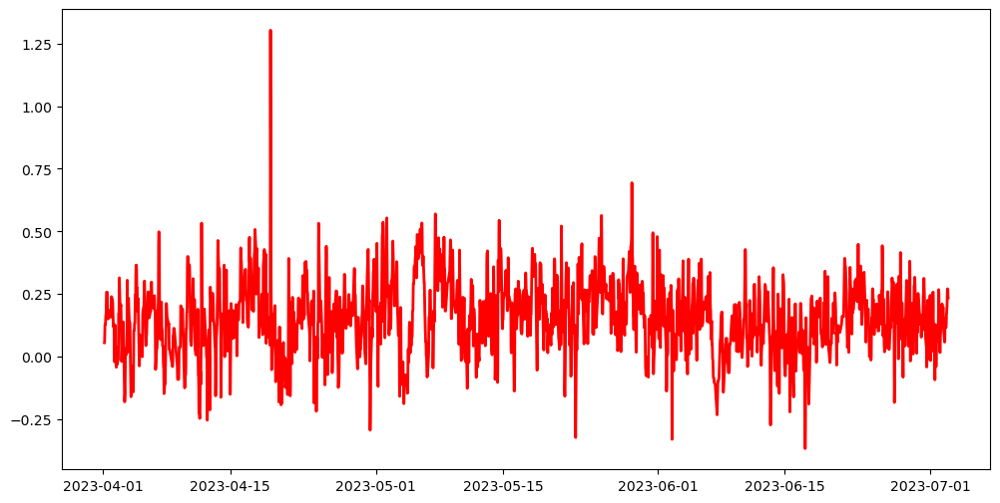

In [168]:
plt.figure(figsize=(12, 6))
plt.plot(datetime_array, interp_u_values, lw = 2, color = 'r')

In [164]:
freq.max()

0.00016355446513375413

In [165]:
frequencies.max()

0.00027771548179711446

In [159]:
1/ (0.0001 *3600)

2.7777777777777772

In [153]:
max_freq

0.00027771548179711446

In [120]:
datetime_array_days

array([19448.        , 19448.02083333, 19448.04166667, ...,
       19540.95833333, 19540.97916667, 19541.        ])

In [384]:
nc = xr.open_dataset('/mnt/flow/swot/Matt_Analysis/CNES_L3_CalVal/SWOT_L3_LR_SSH_Basic_477_026_20230401T185120_20230401T194224_v0.3.nc')

In [385]:
nc


<xarray.Dataset>
Dimensions:         (num_lines: 9860, num_pixels: 69, num_nadir: 2114)
Coordinates:
    latitude        (num_lines, num_pixels) float64 ...
    longitude       (num_lines, num_pixels) float64 ...
Dimensions without coordinates: num_lines, num_pixels, num_nadir
Data variables:
    time            (num_lines) datetime64[ns] ...
    mdt             (num_lines, num_pixels) float64 ...
    ssha            (num_lines, num_pixels) float64 ...
    ssha_noiseless  (num_lines, num_pixels) float64 ...
    i_num_line      (num_nadir) int16 ...
    i_num_pixel     (num_nadir) int8 ...
Attributes: (12/42)
    contact:                         aviso@altimetry.fr
    creator_email:                   aviso@altimetry.fr
    creator_name:                    DUACS - Data Unification and Altimeter C...
    creator_url:                     https://aviso.altimetry.fr
    institution:                     CNES
    license:                         https://www.aviso.altimetry.fr/fileadmin...
    ...                              ...
    geospatial_lat_min:              -78.272132
    geospatial_lat_max:              78.272321
    geospatial_lon_min:              157.485889
    geospatial_lon_max:              324.431861
    doi:                             10.24400/527896/a01-2023.017
    data_used:                       L2 SWOT (NASA/CNES). DOI associated : ht...

In [386]:
nc['longitude'] -= 360

In [387]:
ssha = nc.ssha.values

In [388]:
ds = nc.where((nc.longitude >= -127) & (nc.longitude <= -124) & (nc.latitude >= 32) & (nc.latitude <= 39), drop=True)

In [389]:
ds

<xarray.Dataset>
Dimensions:         (num_lines: 408, num_pixels: 69, num_nadir: 2114)
Coordinates:
    latitude        (num_lines, num_pixels) float64 39.24 39.23 ... 31.81 31.81
    longitude       (num_lines, num_pixels) float64 -125.6 -125.6 ... -125.2
Dimensions without coordinates: num_lines, num_pixels, num_nadir
Data variables:
    time            (num_lines, num_pixels) datetime64[ns] NaT NaT ... NaT NaT
    mdt             (num_lines, num_pixels) float64 nan nan nan ... nan nan nan
    ssha            (num_lines, num_pixels) float64 nan nan nan ... nan nan nan
    ssha_noiseless  (num_lines, num_pixels) float64 nan nan nan ... nan nan nan
    i_num_line      (num_nadir, num_lines, num_pixels) float64 nan nan ... nan
    i_num_pixel     (num_nadir, num_lines, num_pixels) float64 nan nan ... nan
Attributes: (12/42)
    contact:                         aviso@altimetry.fr
    creator_email:                   aviso@altimetry.fr
    creator_name:                    DUACS - Data Unification and Altimeter C...
    creator_url:                     https://aviso.altimetry.fr
    institution:                     CNES
    license:                         https://www.aviso.altimetry.fr/fileadmin...
    ...                              ...
    geospatial_lat_min:              -78.272132
    geospatial_lat_max:              78.272321
    geospatial_lon_min:              157.485889
    geospatial_lon_max:              324.431861
    doi:                             10.24400/527896/a01-2023.017
    data_used:                       L2 SWOT (NASA/CNES). DOI associated : ht...

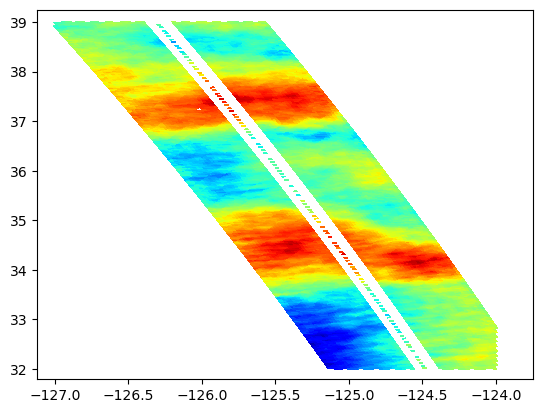

In [390]:
plt.pcolor(ds.longitude,ds.latitude,ds.ssha,cmap ='jet',vmin=-0.15,vmax=0.15)


In [391]:
import numpy as np

# Define scales in km
scales_km = [5, 10, 25,50,70]

# Compute windows based on the actual resolution of the data
windows = {
    scale: (
        np.outer(
            np.hanning(int(scale / 2) * 2 + 1),  # Along-track window, 2 km per pixel
            np.hanning(int(scale / 10) * 2 + 1)  # Cross-track window, 10 km per pixel
        )
    )
    for scale in scales_km
}

# Normalize the windows
for window in windows.values():
    window /= window.sum()

In [392]:
from scipy.signal import convolve2d
data = ds.ssha.values
def apply_hann_filter(data, window):
    def filter_func(data_section):
        valid = ~np.isnan(data_section)
        if np.all(~valid):
            return np.nan
        valid_data = data_section[valid]
        valid_window = window.reshape(data_section.shape)[valid]
        return (valid_data * valid_window).sum() / valid_window.sum()

    filtered_data = xr.apply_ufunc(
        lambda x: convolve2d(x, window, mode='same', boundary='fill', fillvalue=np.nan),
        data,
        input_core_dims=[['alontrack', 'crosstrack']],
        output_core_dims=[['alontrack', 'crosstrack']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )
    return filtered_data

# Assuming 'data' is your xarray DataArray
filtered_data = {f'{scale}km': apply_hann_filter(ssh_data, windows[scale]) for scale in scales_km}

NameError: name 'ssh_data' is not defined

In [393]:
plt.pcolor(ds.longitude, ds.latitude,filtered_data['25km'],vmin=-0.15,vmax=0.15,cmap='jet')


NameError: name 'filtered_data' is not defined

In [394]:
ssh_data = ds.ssha.values

In [395]:
# Function to interpolate NaNs in a 2D array
def interpolate_nans(data):
    try:
        from scipy.interpolate import griddata
        x, y = np.indices(data.shape)
        points = np.array((x[~np.isnan(data)], y[~np.isnan(data)])).T
        values = data[~np.isnan(data)]
        data_interp = griddata(points, values, (x, y), method='linear')
        return np.where(np.isnan(data), data_interp, data)
    except ImportError:
        print("Scipy is required for this function")
        return data

# Apply interpolation
ssh_data = interpolate_nans(ssh_data)

In [396]:
from scipy.ndimage import gaussian_filter

50/6

8.333333333333334

In [397]:
# Define sigma values based on scales
sigmas = {
    '5km': 0.83 / 2,  # Dividing by resolution if needed
    '10km': 1.67 / 2,
    '25km': 4.17 / 2,
    '150km': 8.33 / 2
}

# Apply Gaussian filter for each scale
smoothed_data_5km = gaussian_filter(ssh_data, sigma=sigmas['5km'], mode='nearest')
smoothed_data_10km = gaussian_filter(ssh_data, sigma=sigmas['10km'], mode='nearest')
smoothed_data_25km = gaussian_filter(ssh_data, sigma=sigmas['25km'], mode='nearest')
smoothed_data_150km = gaussian_filter(ssh_data, sigma=sigmas['150km'], mode='nearest')



In [398]:
# ds['SSH'] = xr.DataArray(smoothed_data_150km, dims=('num_lines', 'num_pixels'), coords=ds.ssha.coords)
# ds['grad_ssh_y'] = xr.DataArray(np.gradient(ds.SSH, axis=0) / dy, dims=('num_lines', 'num_pixels'), coords=ds.SSH.coords)
ds['SSH'] = xr.DataArray(filtered_data['25km'], dims=('num_lines', 'num_pixels'), coords=ds.ssha.coords)

NameError: name 'filtered_data' is not defined

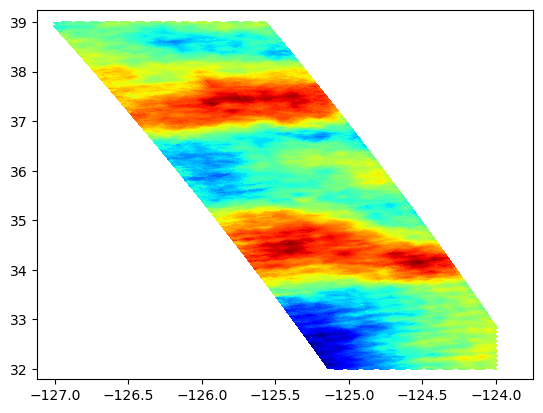

In [399]:
plt.pcolor(ds.longitude,ds.latitude,ssh_data,cmap ='jet')


In [400]:
ssh_data[1,:]

array([    nan,     nan,     nan,     nan,     nan,     nan,     nan,
           nan,     nan,     nan,     nan,     nan,     nan,     nan,
           nan,     nan,     nan,     nan,     nan,     nan,     nan,
           nan,     nan,     nan,     nan,     nan,     nan,     nan,
           nan,     nan,     nan,     nan,     nan,     nan,     nan,
           nan,     nan,     nan,     nan,     nan,     nan,     nan,
           nan,     nan,     nan,     nan,     nan,     nan,     nan,
           nan,     nan,     nan,     nan,     nan,     nan,  0.0001,
       -0.0013, -0.0077, -0.0038, -0.007 , -0.0077, -0.0149, -0.0205,
       -0.0241,     nan,     nan,     nan,     nan,     nan])

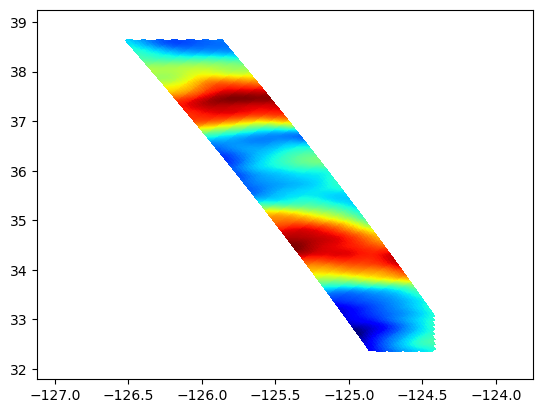

In [401]:
plt.pcolor(ds.longitude,ds.latitude,smoothed_data_150km,cmap ='jet')


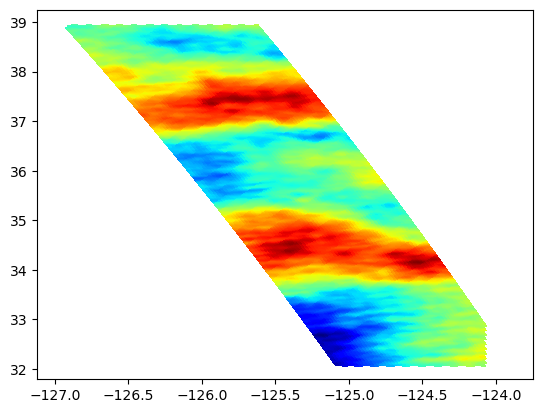

In [402]:
plt.pcolor(ds.longitude,ds.latitude,smoothed_data_10km,cmap ='jet')


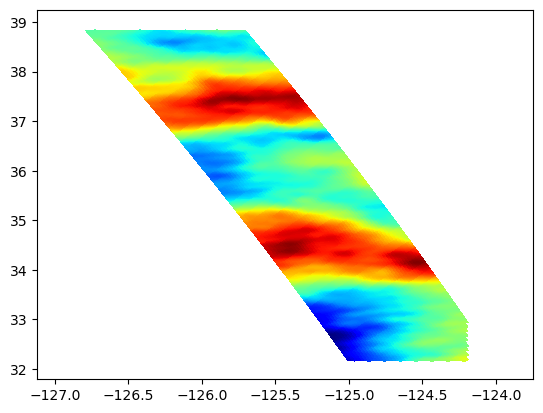

In [403]:
plt.pcolor(ds.longitude,ds.latitude,smoothed_data_25km,cmap ='jet')


In [404]:
# ds = ds.rename({'ssha': 'SSH'})

da = compute_geostrophic_velocities(ds)

plt.pcolor(ds.longitude,ds.latitude,da.u_g,vmin = -1, vmax = 1, cmap ='jet')

AttributeError: 'Dataset' object has no attribute 'SSH'

In [405]:
plt.pcolor(ds.longitude,ds.latitude,da.v_g,vmin = -1, vmax = 1, cmap ='jet')

NameError: name 'da' is not defined

In [406]:
plt.pcolor(ds.longitude,ds.latitude,np.sqrt(da.v_g**2+da.u_g**2),vmin = 0, vmax = .4, cmap ='jet')
plt.title('along and cross-track')

NameError: name 'da' is not defined

In [407]:
# Flatten the arrays
lon_flat = lon.flatten()
lat_flat = lat.flatten()
ssh_flat = ssha.flatten()

# Prepare matrix for polynomial fitting
X = np.column_stack((lon_flat, lat_flat, lon_flat*lat_flat, lon_flat**2, lat_flat**2))

NameError: name 'lon' is not defined

In [408]:
# Fit the polynomial using least squares
coeff, residuals, rank, s = np.linalg.lstsq(X, ssh_flat, rcond=None)

NameError: name 'ssh_flat' is not defined

In [409]:
coeff

NameError: name 'coeff' is not defined

In [410]:
def calculate_bearing(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

    # Difference in the coordinates
    dlon = lon2 - lon1

    # Primary calculation
    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - (np.sin(lat1) * np.cos(lat2) * np.cos(dlon))

    # Bearing converted from radians to degrees
    initial_bearing = np.arctan2(x, y)
    initial_bearing = np.degrees(initial_bearing)
    compass_bearing = (initial_bearing + 360) % 360

    return compass_bearing

In [411]:
lat1, lon1, lat2, lon2 = ds.latitude.values[0,0],ds.longitude.values[0,0],ds.latitude.values[-1,0],ds.longitude.values[-1,0] 

In [412]:
calculate_bearing(lat1, lon1, lat2, lon2)

167.86982913575093

In [413]:
def compute_along_track_directions(latitudes, longitudes):
    bearings = []
    for i in range(len(latitudes) - 1):
        bearing = calculate_bearing(latitudes[i], longitudes[i], latitudes[i + 1], longitudes[i + 1])
        bearings.append(bearing)
    return bearings

def compute_average_bearing(bearings):
    # Convert bearings to radians for circular mean calculation
    radian_bearings = np.radians(bearings)
    average_bearing_radians = np.arctan2(np.mean(np.sin(radian_bearings)), np.mean(np.cos(radian_bearings)))
    average_bearing_degrees = np.degrees(average_bearing_radians) % 360
    return average_bearing_degrees

# Example usage:
bearings = compute_along_track_directions(ds.latitude.values[:,0], ds.longitude.values[:,0])
average_bearing = compute_average_bearing(bearings)
print("Average Along-Track Direction:", average_bearing)

Average Along-Track Direction: 168.43371760387063


In [414]:
theta=90 - average_bearing

In [415]:
def rotate_coordinates(u_local, v_local, theta_deg):
    theta_rad = np.radians(theta_deg)
    u_geo = u_local * np.cos(theta_rad) - v_local * np.sin(theta_rad)
    v_geo = u_local * np.sin(theta_rad) + v_local * np.cos(theta_rad)
    return u_geo, v_geo

In [416]:
u_geo, v_geo = rotate_coordinates(da.u_g.values, da.v_g.values, theta)

NameError: name 'da' is not defined

In [417]:
plt.pcolor(ds.longitude,ds.latitude,np.sqrt(u_geo**2+v_geo**2),vmin = 0, vmax = .5, cmap ='jet')
plt.title('northward and eastward')

NameError: name 'u_geo' is not defined

In [418]:
plt.pcolor(ds.longitude,ds.latitude,v_geo,vmin = -1, vmax = 1, cmap ='jet')

NameError: name 'v_geo' is not defined

In [419]:
plt.pcolor(ds.longitude,ds.latitude,u_geo,vmin = -1, vmax = 1, cmap ='jet')

NameError: name 'u_geo' is not defined

In [420]:
u_geo[:,17]

NameError: name 'u_geo' is not defined

In [421]:
da.u_g.values[:,17]

NameError: name 'da' is not defined

In [422]:
import numpy as np
from scipy import signal, ndimage

# Example data (replace with your actual SWOT data)
data = ds.ssha.values  # 100 alongtrack (2km each) and 10 crosstrack (10m each)

# Create a mask for NaN values
mask = np.isnan(data)
data_masked = np.ma.array(data, mask=mask)


In [423]:
# Define a NaN-safe filter function
def apply_nan_safe_filter(data, function=np.nanmean, size=3):
    return ndimage.generic_filter(data, function, size=size)


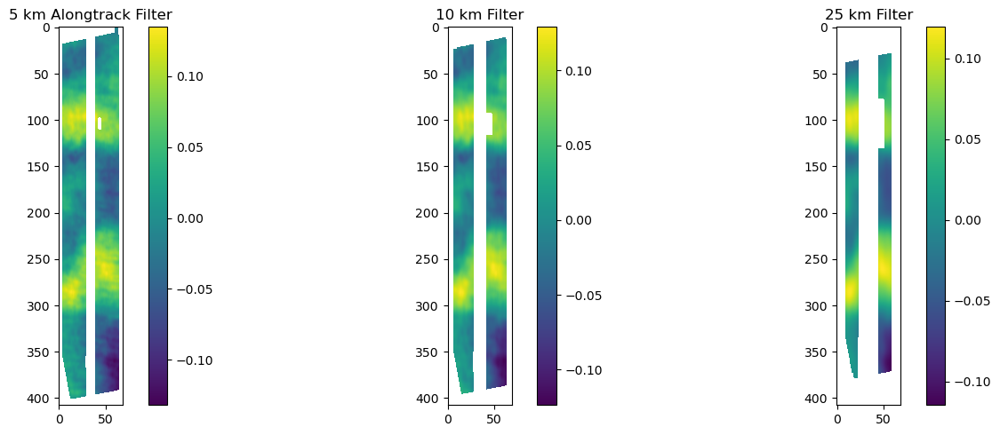

In [424]:
 # Pad data to minimize edge effects
pad_width = 20  # Larger padding for the largest filter
data_padded = np.pad(data, pad_width, mode='reflect')

# Define filtering function with NaN handling
def apply_gaussian(data, sigma):
    return gaussian_filter(data, sigma=sigma, mode='nearest')

# Apply filters for each scale
filtered_5km = apply_gaussian(data_padded, sigma=(2.5/2, 0))  # 5 km alongtrack
filtered_10km = apply_gaussian(data_padded, sigma=(5/2, 1/2))  # 10 km both directions
filtered_25km = apply_gaussian(data_padded, sigma=(12.5/2, 3/2))  # 25 km both directions

# Remove padding
filtered_5km = filtered_5km[pad_width:-pad_width, pad_width:-pad_width]
filtered_10km = filtered_10km[pad_width:-pad_width, pad_width:-pad_width]
filtered_25km = filtered_25km[pad_width:-pad_width, pad_width:-pad_width]

# Visualization
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(filtered_5km, cmap='viridis')
axes[0].set_title('5 km Alongtrack Filter')
axes[1].imshow(filtered_10km, cmap='viridis')
axes[1].set_title('10 km Filter')
axes[2].imshow(filtered_25km, cmap='viridis')
axes[2].set_title('25 km Filter')

for ax in axes:
    plt.colorbar(ax.images[0], ax=ax)

plt.tight_layout()
plt.show()

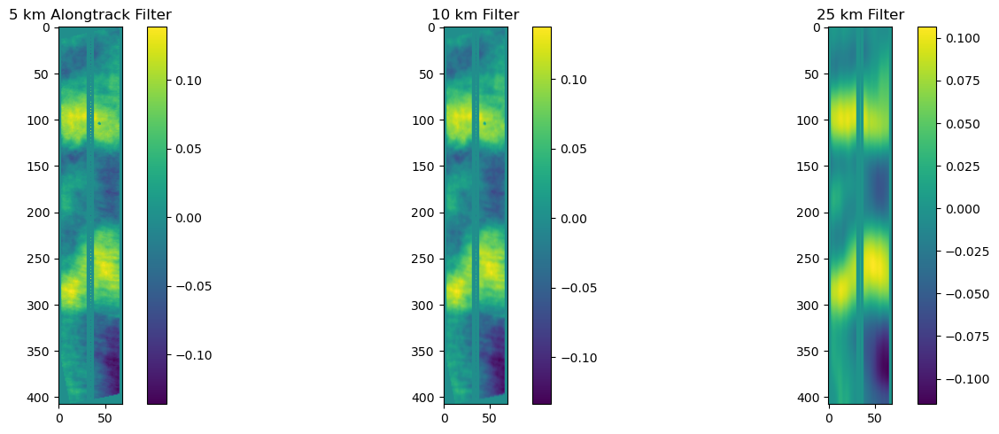

In [478]:
from scipy.signal import convolve2d

# Example data
data = ds.ssha.values
# Function to apply a Hanning filter
def apply_hanning(data, size_alongtrack, size_crosstrack):
    window_alongtrack = np.hanning(size_alongtrack)
    window_crosstrack = np.hanning(size_crosstrack)
    window = window_alongtrack[:, None] * window_crosstrack[None, :]  # Create a 2D window
    window /= window.sum()  # Normalize the window to preserve data amplitude

    # Pad data to minimize edge effects
    pad_width_alongtrack = size_alongtrack // 2
    pad_width_crosstrack = size_crosstrack // 2
    data_padded = np.pad(data, ((pad_width_alongtrack, pad_width_alongtrack),
                                (pad_width_crosstrack, pad_width_crosstrack)), mode='reflect')

    # Handle NaNs by treating them as zero (influence can be limited by normalizing the window)
    data_padded[np.isnan(data_padded)] = 0
    filtered_data = convolve2d(data_padded, window, mode='valid', boundary='fill', fillvalue=0)
    return filtered_data

# Apply Hanning filter at specified scales
filtered_5km = apply_hanning(data, 3, 1)  # 5 km alongtrack
filtered_10km = apply_hanning(data, 5, 1)  # 10 km both directions
filtered_25km = apply_hanning(data, 75, 3)  # 25 km both directions

# Visualization
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(filtered_5km, cmap='viridis')
axes[0].set_title('5 km Alongtrack Filter')
axes[1].imshow(filtered_10km, cmap='viridis')
axes[1].set_title('10 km Filter')
axes[2].imshow(filtered_25km, cmap='viridis')
axes[2].set_title('25 km Filter')

for ax in axes:
    plt.colorbar(ax.images[0], ax=ax)

plt.tight_layout()
plt.show()

In [479]:
filtered_5km = np.where(np.isnan(ds.ssha.values),np.nan,filtered_5km)
filtered_25km = np.where(np.isnan(ds.ssha.values),np.nan,filtered_25km)
filtered_10km = np.where(np.isnan(ds.ssha.values),np.nan,filtered_10km)

Text(0.5, 1.0, '50 km Alontrack Filter')

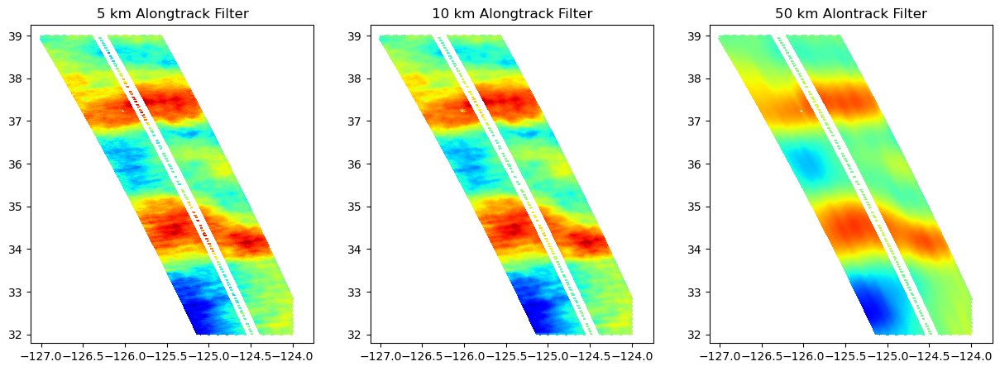

In [480]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].pcolor(ds.longitude,ds.latitude,filtered_5km, vmin=-.15,vmax=.15, cmap='jet')
axes[0].set_title('5 km Alongtrack Filter')
axes[1].pcolor(ds.longitude,ds.latitude,filtered_10km, vmin=-.15,vmax=.15, cmap='jet')
axes[1].set_title('10 km Alongtrack Filter')
axes[2].pcolor(ds.longitude,ds.latitude,filtered_25km, vmin=-.15,vmax=.15, cmap='jet')
axes[2].set_title('50 km Alontrack Filter')

In [481]:
ds['SSH'] = xr.DataArray(filtered_25km, dims=('num_lines', 'num_pixels'), coords=ds.ssha.coords)

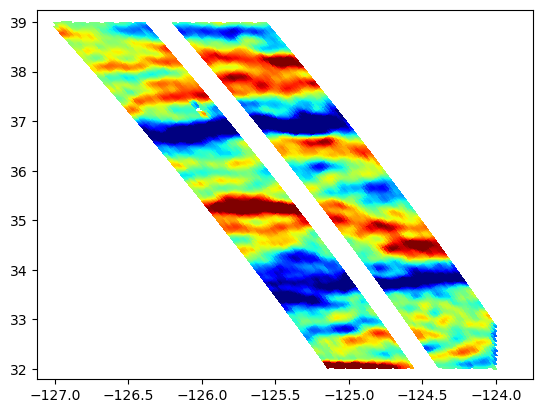

In [452]:
da = compute_geostrophic_velocities(ds)

plt.pcolor(ds.longitude,ds.latitude,da.u_g,vmin = -.25, vmax = .25, cmap ='jet')

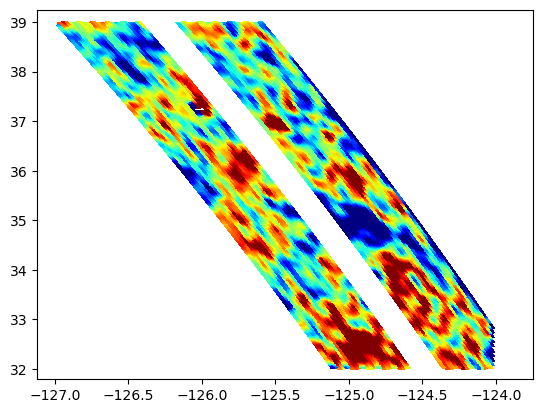

In [453]:
plt.pcolor(ds.longitude,ds.latitude,da.v_g,vmin = -.25, vmax = .25, cmap ='jet')

Text(0.5, 1.0, 'along and cross-track')

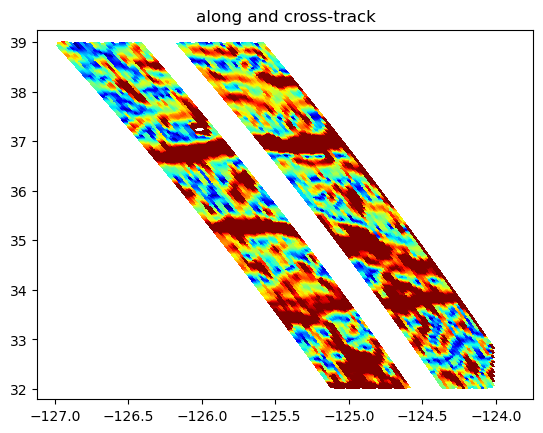

In [455]:
plt.pcolor(ds.longitude,ds.latitude,np.sqrt(da.v_g**2+da.u_g**2),vmin = 0, vmax = .25, cmap ='jet')
plt.title('along and cross-track')

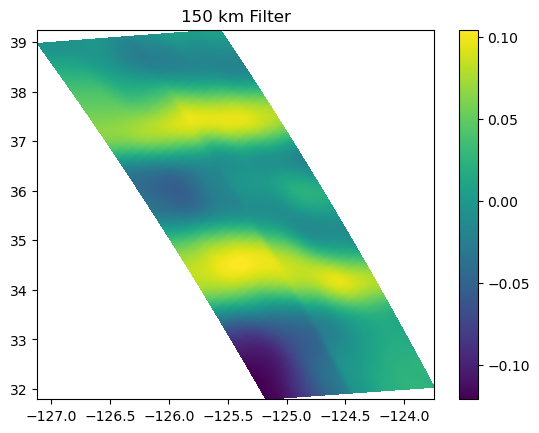

In [489]:
import numpy as np
from scipy.signal import convolve2d
import matplotlib.pyplot as plt

def apply_hanning(data, size_alongtrack, size_crosstrack):
    window_alongtrack = np.hanning(size_alongtrack)
    window_crosstrack = np.hanning(size_crosstrack)
    window = window_alongtrack[:, None] * window_crosstrack[None, :]  # Create a 2D window
    window /= window.sum()  # Normalize the window to preserve data amplitude

    # Pad data to minimize edge effects
    pad_width_alongtrack = size_alongtrack // 2
    pad_width_crosstrack = size_crosstrack // 2
    data_padded = np.pad(data, ((pad_width_alongtrack, pad_width_alongtrack),
                                (pad_width_crosstrack, pad_width_crosstrack)), mode='reflect')

    # Handle NaNs by treating them as zero (influence can be limited by normalizing the window)
    nan_mask = np.isnan(data_padded)
    data_padded[nan_mask] = 0
    filtered_data = convolve2d(data_padded, window, mode='valid', boundary='fill', fillvalue=0)

    # Correct the NaN influence by reapplying the nan_mask
    nan_mask = nan_mask.astype(float)
    normalization = convolve2d(1 - nan_mask, window, mode='valid', boundary='fill', fillvalue=0)
    filtered_data /= normalization
    nan_result_mask = normalization == 0
    filtered_data[nan_result_mask] = np.nan

    return filtered_data


# Apply Hanning filter with calculated sizes for 150 km
filtered_150km = apply_hanning(ds.ssha.values, 75, 15)  # 150 km filter
np.where(np.isnan(ds.ssha.values),np.nan,filtered_5km)
# Visualization
plt.pcolor(ds.longitude, ds.latitude,filtered_150km, cmap='viridis')
plt.title('150 km Filter')
plt.colorbar()
plt.show()

In [492]:
75//2

37

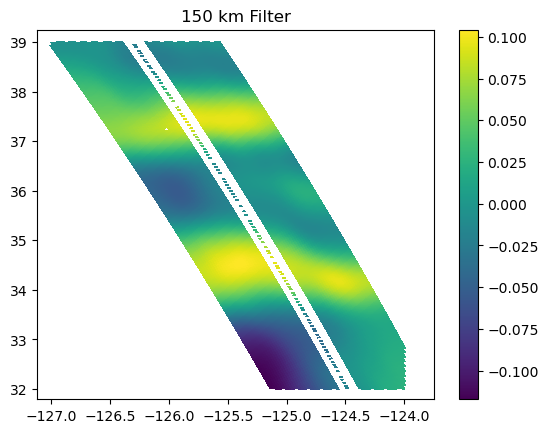

In [493]:
# Apply Hanning filter with calculated sizes for 150 km
# filtered_150km = apply_hanning(ds.ssha.values, 75, 15)  # 150 km filter
filtered_150km = np.where(np.isnan(ds.ssha.values),np.nan,filtered_150km)
# Visualization
plt.pcolor(ds.longitude, ds.latitude,filtered_150km, cmap='viridis')
plt.title('150 km Filter')
plt.colorbar()
plt.show()

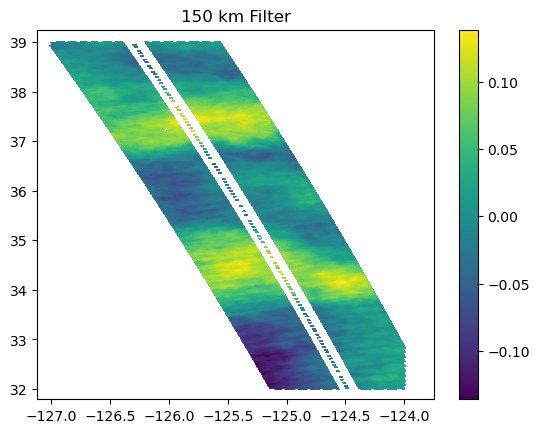

In [474]:
plt.pcolor(ds.longitude, ds.latitude,ds.ssha, cmap='viridis')
plt.title('150 km Filter')
plt.colorbar()
plt.show()